# Similarity

In [1]:
import os
import anndata as ad
import scipy as sp
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from collections import Counter

In [2]:
"""
The data folder is structured as follows:

data
    |input
        |original
        |pb
        |pb_L
    |output
        |corr
        |gk
        |corr_L
        |graph_sum
        |extra
        |graph
        |plots
"""

data = os.path.abspath(os.path.join(os.getcwd(),"../data"))

input = os.path.join(data, "input")
output = os.path.join(data, "output")

original = os.path.join(input, "original")
pb = os.path.join(input, "pb")
pb_L = os.path.join(input, "pb_L")

corr = os.path.join(output, "corr")
gk = os.path.join(output, "gk")
corr_L = gk = os.path.join(output, "corr_L")
graph_sum = os.path.join(output, "graph_sum")
extra = os.path.join(output, "extra")
graph = os.path.join(output, "graph")

In [3]:
# Read Original Data
adt = ad.read_h5ad(os.path.join(original, "adt_pp.h5ad"))
bulkRNA = ad.read_h5ad(os.path.join(original, "bulkRNA_pp.h5ad"))
cytof = ad.read_h5ad (os.path.join(original, "cytof_pp.h5ad"))
facs = ad.read_h5ad(os.path.join(original, "facs_pp.h5ad"))
luminex = ad.read_h5ad(os.path.join(original, "luminex_pp.h5ad"))
scRNA = ad.read_h5ad(os.path.join(original, "scRNA_pp.h5ad"))

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation

In [4]:
# Read Pseudobulks
with open(os.path.join(pb_L, "citeRNA_pseudobulks.pickle"), "rb") as f:
    citeRNA_pseudobulks = pickle.load(f) # Float

with open(os.path.join(pb_L, "adt_pseudobulks.pickle"), "rb") as f:
    adt_pseudobulks = pickle.load(f) # Float

with open(os.path.join(pb_L, "cytof_pseudobulks.pickle"), "rb") as f:
    cytof_pseudobulks = pickle.load(f) # Float

with open(os.path.join(pb_L, "bulkRNA_pseudobulks.pickle"), "rb") as f:
    bulkRNA_pseudobulks = pickle.load(f) # Float

luminex_pseudobulks = pd.read_csv(os.path.join(pb_L, "luminex_pseudobulks.csv"), index_col = 0) # Float
facs_pseudobulks = pd.read_csv(os.path.join(pb_L, "facs_pseudobulks.csv"), index_col = 0)

## Mapping Patients to Diseases
Every row is a patient 

In [5]:
patients = set(cytof.obs.COMBAT_ID).union(adt.obs.COMBAT_ID).union(bulkRNA.obs.COMBAT_ID).union(luminex.obs.COMBAT_ID).union(facs.obs.COMBAT_ID) # 311 

In [6]:
patient_disease_map = adt.obs.Diseases.to_dict()

for patient in patients: # Go through every patient 

    # Extract sample ids
    cytof_IDS = set(cytof.obs_names[cytof.obs.COMBAT_ID == patient])
    facs_IDS = set(facs.obs_names[facs.obs.COMBAT_ID == patient])
    luminex_IDS = set(luminex.obs.PID[luminex.obs.COMBAT_ID == patient])
    bulkRNA_IDS = set(bulkRNA.obs_names[bulkRNA.obs.COMBAT_ID == patient])
    
    # Extract disease name
    if len(cytof_IDS) > 0:
        disease = cytof.obs.Diseases[cytof.obs.COMBAT_ID == patient].head(1)[0]
    elif len(facs_IDS) > 0:
        disease = facs.obs.Diseases[facs.obs.COMBAT_ID == patient].head(1)[0]
    elif len(luminex_IDS) > 0:
        disease = luminex.obs.Disease[luminex.obs.COMBAT_ID == patient].head(1)[0]
    
    # Unify disease names 
    if disease == "COVID-severe":
        disease = "COVID_SEV"
    if disease == "COVID-HCW":
        disease = "COVID_HCW"
    if disease == "COVID-mild":
        disease = "COVID_MILD"
    if disease == "COVID-critical":
        disease = "COVID_CRIT"


    if len(cytof_IDS) > 0:
        for pid in cytof_IDS:
            patient_disease_map[pid] = disease
    if len(facs_IDS) > 0:
        for pid in facs_IDS:
            patient_disease_map[pid] = disease
    if len(luminex_IDS) > 0:
        for pid in luminex_IDS:
            patient_disease_map[pid] = disease
    if len(bulkRNA_IDS) > 0:
        for pid in bulkRNA_IDS:
            patient_disease_map[pid] = disease

diseases = set(patient_disease_map.values())
len(patient_disease_map.keys())

792

In [7]:
disease_patient_map = {}
for k,v in patient_disease_map.items():
    combat_ID = k.split("-")[0]
    if v in disease_patient_map.keys():
        if(combat_ID not in disease_patient_map[v]):
            disease_patient_map[v].append(combat_ID)
    else:
        disease_patient_map[v] = [combat_ID]

In [8]:
total_patients = 0
for k,v in disease_patient_map.items():
    total_patients = total_patients + len(v)
    print(k, " : ", len(v))

print("total: ", total_patients)

COVID_SEV  :  44
COVID_MILD  :  27
COVID_HCW_MILD  :  3
COVID_CRIT  :  23
COVID_LDN  :  2
Sepsis  :  44
HV  :  36
Flu  :  12
COVID_HCW  :  25
COVID_CONV  :  9
HCW  :  6
Sepsis_conv  :  2
Flu SGUL (serum)  :  12
COVID critical SGUL (serum)  :  42
nan  :  18
HC (serum)  :  16
total:  321


In [8]:
with open(os.path.join(extra, 'patient_disease_map.pickle'), 'wb') as f:
    pickle.dump(patient_disease_map, f)

with open(os.path.join(extra, 'disease_patient_map.pickle'), 'wb') as f:
    pickle.dump(disease_patient_map, f)

## Computing Correlation

### citeRNA

In [10]:
corr_p_citeRNA = {}
for key in citeRNA_pseudobulks.keys():
    pseudo_bulk = citeRNA_pseudobulks[key]
    corr_p_citeRNA[key] = pseudo_bulk.T.corr()

In [11]:
citeRNA_disease_clusters_corr = {}

for key in corr_p_citeRNA.keys():
    corr_matrix = corr_p_citeRNA[key].rename(index = patient_disease_map, columns = patient_disease_map)
    corr_matrix.sort_index(inplace = True) # Sort the row names
    corr_matrix.sort_index(inplace = True, axis = 1) # Sort the column names
    
    inter_diseases = {}
    intra_diseases = {}

    for i, disease1 in enumerate(corr_matrix.columns.unique()):
        intra_diseases[disease1] = corr_matrix.loc[disease1, disease1]
        for j in range(i):
            disease2 = corr_matrix.columns.unique()[j]
            inter_diseases[disease1 + "_&_" + disease2] = corr_matrix.loc[disease1, disease2]
    
    citeRNA_disease_clusters_corr[key] = {"inter_diseases": inter_diseases, "intra_diseases": intra_diseases, "all" : corr_matrix}
        

In [12]:
for key in citeRNA_disease_clusters_corr.keys():
    print(key, " : ", citeRNA_disease_clusters_corr[key]["all"].shape[0]) # Number of patients in each modality

NK-greenyellow  :  138
NK-tan  :  138
NK-red  :  138
NK-turquoise  :  138
NK-green  :  138
NK-purple  :  138
NK-brown  :  138
NK-blue  :  138
NK-black  :  138
NK-salmon  :  138
NK-lightcyan  :  138
NK-grey60  :  138
NK-grey  :  138
NK-lightgreen  :  138
NK-pink  :  138
NK-yellow  :  138
NK-magenta  :  138
NK-cyan  :  138
NK-midnightblue  :  138
NK-lightyellow  :  138
CD8-greenyellow  :  138
CD8-tan  :  138
CD8-red  :  138
CD8-turquoise  :  138
CD8-green  :  138
CD8-purple  :  138
CD8-brown  :  138
CD8-blue  :  138
CD8-black  :  138
CD8-salmon  :  138
CD8-lightcyan  :  138
CD8-grey60  :  138
CD8-grey  :  138
CD8-lightgreen  :  138
CD8-pink  :  138
CD8-yellow  :  138
CD8-magenta  :  138
CD8-cyan  :  138
CD8-midnightblue  :  138
CD8-lightyellow  :  138
nan-greenyellow  :  140
nan-tan  :  140
nan-red  :  140
nan-turquoise  :  140
nan-green  :  140
nan-purple  :  140
nan-brown  :  140
nan-blue  :  140
nan-black  :  140
nan-salmon  :  140
nan-lightcyan  :  140
nan-grey60  :  140
nan-grey  : 

### ADT

In [13]:
corr_p_adt = {}
for key in adt_pseudobulks.keys():
    pseudo_bulk = adt_pseudobulks[key]
    corr_p_adt[key] = pseudo_bulk.T.corr()

In [14]:
adt_disease_clusters_corr = {}

for key in corr_p_adt.keys():
    corr_matrix = corr_p_adt[key].rename(index = patient_disease_map, columns = patient_disease_map)
    corr_matrix.sort_index(inplace = True) # Sort the row names
    corr_matrix.sort_index(inplace = True, axis = 1) # Sort the column names
    
    inter_diseases = {}
    intra_diseases = {}

    for i, disease1 in enumerate(corr_matrix.columns.unique()):
        intra_diseases[disease1] = corr_matrix.loc[disease1, disease1]
        for j in range(i):
            disease2 = corr_matrix.columns.unique()[j]
            inter_diseases[disease1 + "_&_" + disease2] = corr_matrix.loc[disease1, disease2]
    
    adt_disease_clusters_corr[key] = {"inter_diseases": inter_diseases, "intra_diseases": intra_diseases, "all" : corr_matrix}

### CyTOF

In [15]:
corr_p_cytof = {}
for key in cytof_pseudobulks.keys():
    pseudo_bulk = cytof_pseudobulks[key]
    corr_p_cytof[key] = pseudo_bulk.T.corr()

In [16]:
cytof_disease_clusters_corr = {}

for key in corr_p_cytof.keys():
    corr_matrix = corr_p_cytof[key].rename(index = patient_disease_map, columns = patient_disease_map)
    corr_matrix.sort_index(inplace = True) # Sort the row names
    corr_matrix.sort_index(inplace = True, axis = 1) # Sort the column names
    
    inter_diseases = {}
    intra_diseases = {}

    for i, disease1 in enumerate(corr_matrix.columns.unique()):
        intra_diseases[disease1] = corr_matrix.loc[disease1, disease1]
        for j in range(i):
            disease2 = corr_matrix.columns.unique()[j]
            inter_diseases[disease1 + "_&_" + disease2] = corr_matrix.loc[disease1, disease2]
    
    cytof_disease_clusters_corr[key] = {"inter_diseases": inter_diseases, "intra_diseases": intra_diseases, "all" : corr_matrix}

In [17]:
corr_p_d_cytof = {}

for key in corr_p_cytof.keys():
    corr_matrix = corr_p_cytof[key].rename(columns = patient_disease_map)
    corr_matrix.sort_index(inplace = True, axis = 1) # Sort the column names
    corr_p_d_cytof[key] = corr_matrix

In [18]:
for key in cytof_disease_clusters_corr.keys():
    print(key, " : ", cytof_disease_clusters_corr[key]["all"].shape[0]) # Number of patients in each modality

CD8  :  160
B  :  160
cMono  :  160
CD4  :  160
GDT  :  160
DC  :  160
Basophil  :  159
NK  :  160
ncMono  :  160
MAIT  :  160
DN  :  160
PB  :  160
nan  :  159


### bulkRNA

In [19]:
corr_p_bulkRNA = {}
for key in bulkRNA_pseudobulks.keys():
    pseudo_bulk = bulkRNA_pseudobulks[key]
    corr_p_bulkRNA[key] = pseudo_bulk.T.corr()

In [20]:
bulkRNA_disease_clusters_corr = {}

for key in corr_p_bulkRNA.keys():
    corr_matrix = corr_p_bulkRNA[key].rename(index = patient_disease_map, columns = patient_disease_map)
    corr_matrix.sort_index(inplace = True) # Sort the row names
    corr_matrix.sort_index(inplace = True, axis = 1) # Sort the column names
    
    inter_diseases = {}
    intra_diseases = {}

    for i, disease1 in enumerate(corr_matrix.columns.unique()):
        intra_diseases[disease1] = corr_matrix.loc[disease1, disease1]
        for j in range(i):
            disease2 = corr_matrix.columns.unique()[j]
            inter_diseases[disease1 + "_&_" + disease2] = corr_matrix.loc[disease1, disease2]
    
    bulkRNA_disease_clusters_corr[key] = {"inter_diseases": inter_diseases, "intra_diseases": intra_diseases, "all" : corr_matrix}

In [21]:
for key in bulkRNA_disease_clusters_corr.keys():
    print(key, " : ", bulkRNA_disease_clusters_corr[key]["all"].shape[0]) # Number of patients in each modality

greenyellow  :  143
green  :  143
magenta  :  143
lightgreen  :  143
black  :  143
turquoise  :  143
lightcyan  :  143
midnightblue  :  143
blue  :  143
grey60  :  143
purple  :  143
cyan  :  143
grey  :  143


### Luminex

In [22]:
corr_p_luminex = luminex_pseudobulks.T.corr()

In [23]:
corr_d_luminex = corr_p_luminex.rename(index = patient_disease_map, columns = patient_disease_map)
corr_d_luminex.sort_index(inplace = True) # Sort the row names
corr_d_luminex.sort_index(inplace = True, axis = 1) # Sort the column names

In [24]:
corr_p_d_luminex = corr_p_luminex.rename(columns = patient_disease_map) # One axis patients, one axis diseses. Elements are correlations
corr_p_d_luminex.sort_index(inplace = True, axis = 1) # Sort the column names

In [25]:
inter_diseases = {}
intra_diseases = {}

for i, disease1 in enumerate(corr_d_luminex.columns.unique()):
    intra_diseases[disease1] = corr_d_luminex.loc[disease1, disease1]
    for j in range(i):
        disease2 = corr_d_luminex.columns.unique()[j]
        inter_diseases[str(disease1) + "_&_" + disease2] = corr_d_luminex.loc[disease1, disease2]
    
luminex_disease_clusters_corr = {"inter_diseases": inter_diseases, "intra_diseases": intra_diseases, "all" : corr_d_luminex}

In [26]:
print(corr_p_luminex.shape[0]) # Number of samples in each modality

349


### FACS

In [27]:
corr_p_facs = facs_pseudobulks.T.corr()

In [28]:
corr_d_facs = corr_p_facs.rename(index = patient_disease_map, columns = patient_disease_map)
corr_d_facs.sort_index(inplace = True) # Sort the row names
corr_d_facs.sort_index(inplace = True, axis = 1) # Sort the column names

In [29]:
corr_p_d_facs = corr_p_facs.rename(columns = patient_disease_map) # One axis patients, one axis diseses. Elements are correlations
corr_p_d_facs.sort_index(inplace = True, axis = 1) # Sort the column names

In [30]:
inter_diseases = {}
intra_diseases = {}

for i, disease1 in enumerate(corr_d_facs.columns.unique()):
    intra_diseases[disease1] = corr_d_facs.loc[disease1, disease1]
    for j in range(i):
        disease2 = corr_d_facs.columns.unique()[j]
        inter_diseases[disease1 + "_&_" + disease2] = corr_d_facs.loc[disease1, disease2]
    
facs_disease_clusters_corr = {"inter_diseases": inter_diseases, "intra_diseases": intra_diseases, "all" : corr_d_facs}

In [31]:
print(corr_p_facs.shape[0]) # Number of samples in each modality

100


## Saving Correlations

In [32]:
with open(os.path.join(corr_L,'citeRNA_disease_clusters_corr.pickle'), 'wb') as f:
    pickle.dump(citeRNA_disease_clusters_corr, f)

with open(os.path.join(corr_L,'corr_p_citeRNA.pickle'), 'wb') as f:
    pickle.dump(corr_p_citeRNA, f)

with open(os.path.join(corr_L,'adt_disease_clusters_corr.pickle'), 'wb') as f:
    pickle.dump(adt_disease_clusters_corr, f)

with open(os.path.join(corr_L,'corr_p_adt.pickle'), 'wb') as f:
    pickle.dump(corr_p_adt, f)

with open(os.path.join(corr_L, 'cytof_disease_clusters_corr.pickle'), 'wb') as f:
    pickle.dump(cytof_disease_clusters_corr, f)

with open(os.path.join(corr_L, 'corr_p_cytof.pickle'), 'wb') as f:
    pickle.dump(corr_p_cytof, f)

with open(os.path.join(corr_L, 'corr_p_d_cytof.pickle'), 'wb') as f:
    pickle.dump(corr_p_d_cytof, f)

with open(os.path.join(corr_L, 'bulkRNA_disease_clusters_corr.pickle'), 'wb') as f:
    pickle.dump(bulkRNA_disease_clusters_corr, f)

with open(os.path.join(corr_L, 'corr_p_bulkRNA.pickle'), 'wb') as f:
    pickle.dump(corr_p_bulkRNA, f)

with open(os.path.join(corr_L, 'corr_p_luminex.pickle'), 'wb') as f:
    pickle.dump(corr_p_luminex, f)

with open(os.path.join(corr_L, 'luminex_disease_clusters_corr.pickle'), 'wb') as f:
    pickle.dump(luminex_disease_clusters_corr, f)

with open(os.path.join(corr_L, 'corr_p_facs.pickle'), 'wb') as f:
    pickle.dump(corr_p_facs, f)

with open(os.path.join(corr_L, 'facs_disease_clusters_corr.pickle'), 'wb') as f:
    pickle.dump(facs_disease_clusters_corr, f)

corr_d_luminex.to_csv(os.path.join(corr_L, "corr_d_luminex.csv"))
corr_d_facs.to_csv(os.path.join(corr_L, "corr_d_facs.csv"))
corr_p_d_facs.to_csv(os.path.join(corr_L, "corr_p_d_facs.csv"))
corr_p_d_luminex.to_csv(os.path.join(corr_L, "corr_p_d_luminex.csv"))

## Correlation Visualization

### citeRNA

In [33]:
diseases = list(citeRNA_disease_clusters_corr[list(citeRNA_disease_clusters_corr.keys())[0]]["all"].index.unique())
for i in range(1, len(list(citeRNA_disease_clusters_corr.keys()))):
    key = list(citeRNA_disease_clusters_corr.keys())[i]
    diseases = diseases + list((citeRNA_disease_clusters_corr[key]["all"].index.unique()))
diseases = list(set(diseases))

disease_pairs = list(citeRNA_disease_clusters_corr[list(citeRNA_disease_clusters_corr.keys())[0]]["inter_diseases"].keys()) # List of all disease pairs in all pseudobulks. 
                                                                                                                            # It could be the case, that some pairs are not present in all cell-types or modules
for i in range(1, len(list(citeRNA_disease_clusters_corr.keys()))):
    key = list(citeRNA_disease_clusters_corr.keys())[i]
    disease_pairs = disease_pairs + list((citeRNA_disease_clusters_corr[key]["inter_diseases"].keys()))
disease_pairs = list(set(disease_pairs))

In [75]:
non_grey_keys = [key for key in citeRNA_disease_clusters_corr.keys() if key.find("grey") == -1 or key.find("grey60") > 0]

Text(0.5, 80.7222222222222, 'Module')

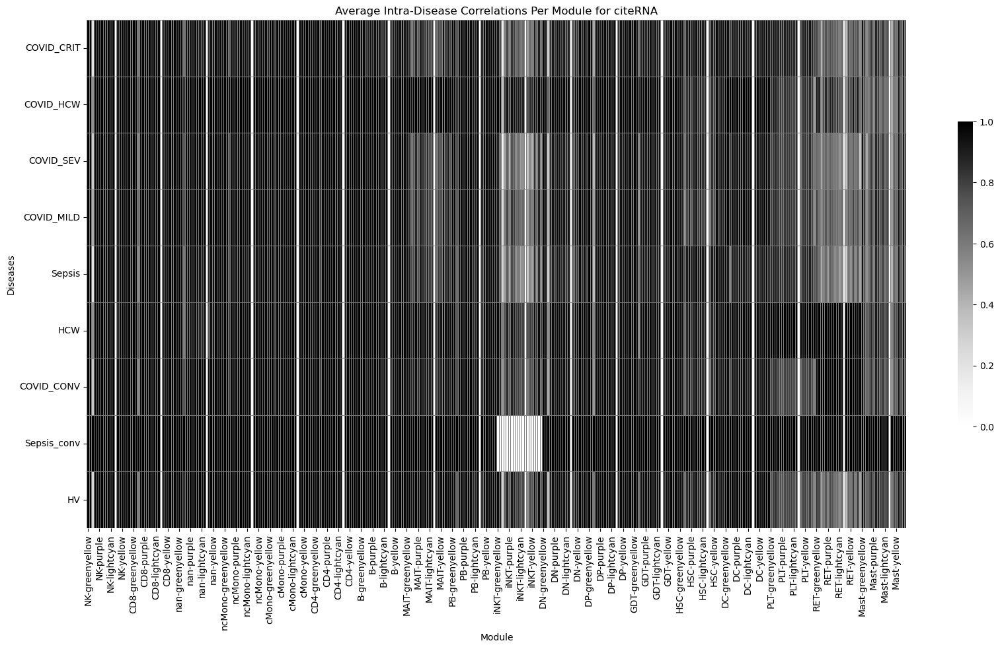

In [76]:
# All Cell Types and Diseases: Average Correlation between Patients of the Same Disease
module_intra_disease_avg = {m:[0] * len(diseases) for m in citeRNA_disease_clusters_corr.keys() } # For every module and every disease, we compute ome average value, which is the average 
                                                                                                  # of all correlations in the matrix of that disease for that specific module.

for m in non_grey_keys:
    for i, disease in enumerate(diseases):
        if (not (m.find("iNKT") > -1 and disease == "Sepsis_conv") and
            not (m.find("RET") > -1 and disease == "COVID_HCW_MILD") and 
            not (m.find("Mast") > -1 and disease == "COVID_HCW_MILD")):
            module_intra_disease_avg[m][i] = citeRNA_disease_clusters_corr[m]["intra_diseases"][disease].mean().mean()
        
df = pd.DataFrame(data = module_intra_disease_avg, index = diseases)

fig, ax = plt.subplots(figsize=(20,10))  
sb.heatmap(df, cmap ='Greys',  robust = True, linewidth=0.4, linecolor = "grey", cbar_kws={"shrink": 0.6}, ax = ax)
plt.title("Average Intra-Disease Correlations Per Module for citeRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")


Text(0.5, 80.7222222222222, 'Module')

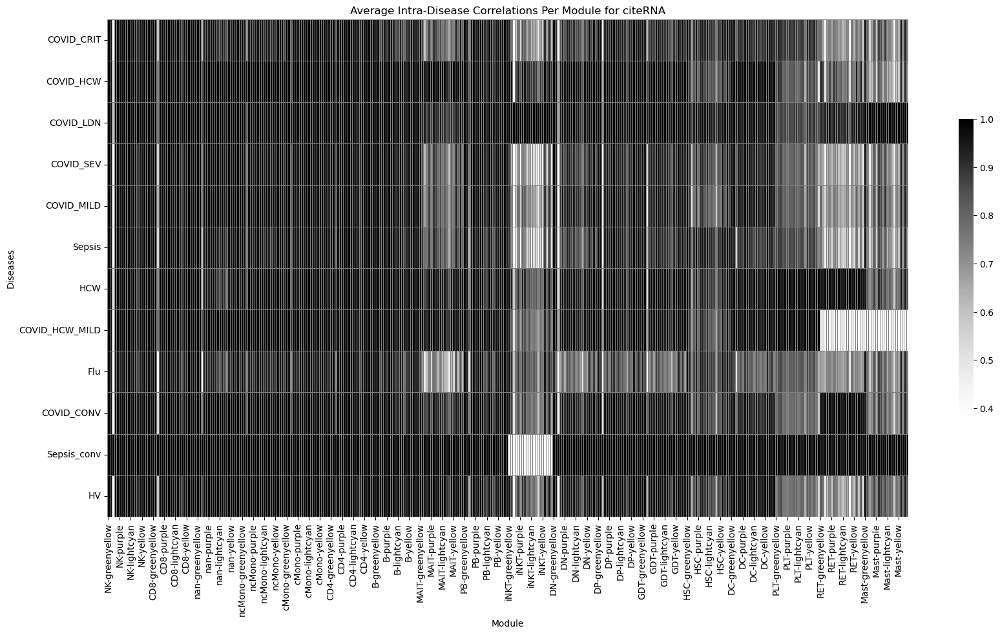

In [34]:
# All Cell Types and Diseases: Average Correlation between Patients of the Same Disease
module_intra_disease_avg = {m:[0] * len(diseases) for m in citeRNA_disease_clusters_corr.keys() } # For every module and every disease, we compute ome average value, which is the average 
                                                                                                  # of all correlations in the matrix of that disease for that specific module.

for m in citeRNA_disease_clusters_corr.keys():
    for i, disease in enumerate(diseases):
        if (not (m.find("iNKT") > -1 and disease == "Sepsis_conv") and
            not (m.find("RET") > -1 and disease == "COVID_HCW_MILD") and 
            not (m.find("Mast") > -1 and disease == "COVID_HCW_MILD")):
            module_intra_disease_avg[m][i] = citeRNA_disease_clusters_corr[m]["intra_diseases"][disease].mean().mean()
        
df = pd.DataFrame(data = module_intra_disease_avg, index = diseases)

fig, ax = plt.subplots(figsize=(20,10))  
sb.heatmap(df, cmap ='Greys',  robust = True, linewidth=0.4, linecolor = "grey", cbar_kws={"shrink": 0.6}, ax = ax)
plt.title("Average Intra-Disease Correlations Per Module for citeRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")


Text(0.5, 1.5, 'Simple Disease-Cell-Type Correlations in citeRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization')

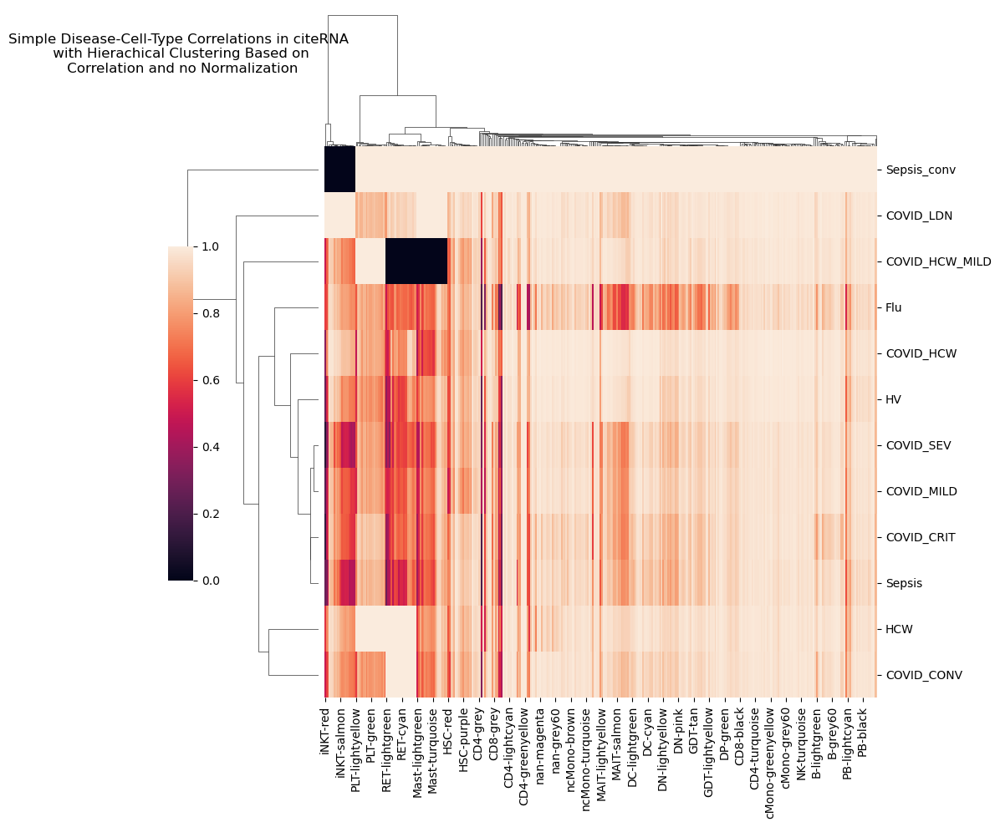

In [35]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations in citeRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)

Text(0.5, 1.3, 'Simple Disease-Cell-Type Correlations \n in citeRNA with \n Two-Way Hierachical Clustering')

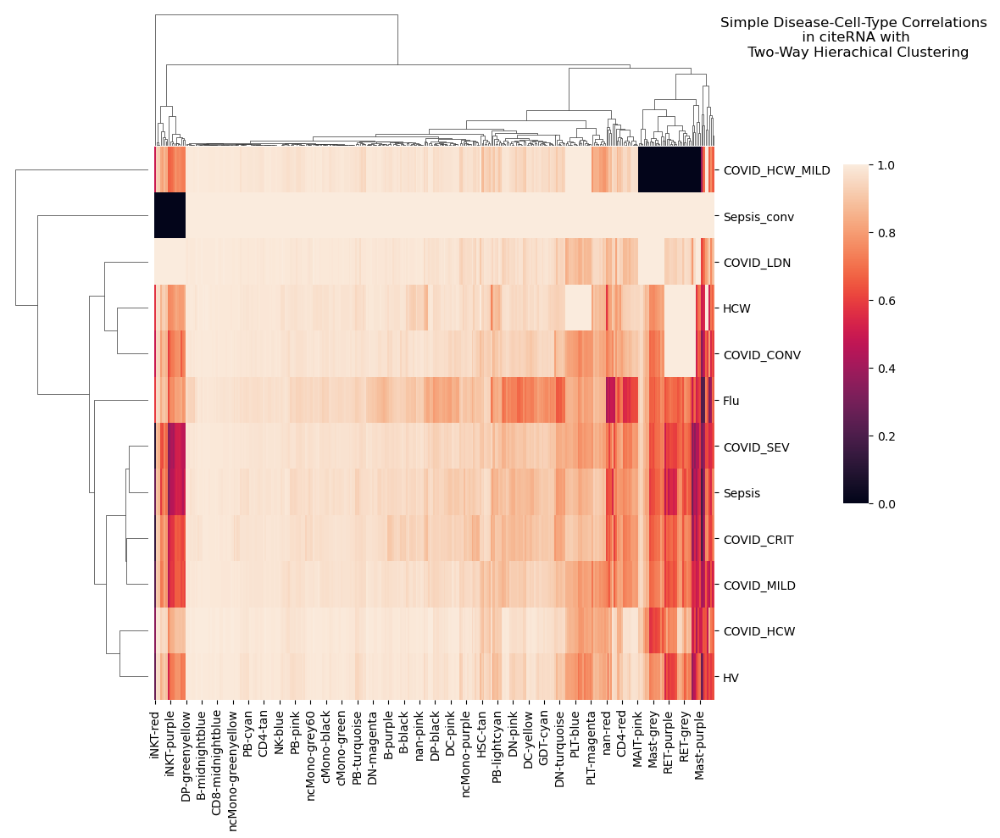

In [36]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations \n in citeRNA with \n Two-Way Hierachical Clustering", y = 1.3)

Text(0.5, 80.7222222222222, 'Module')

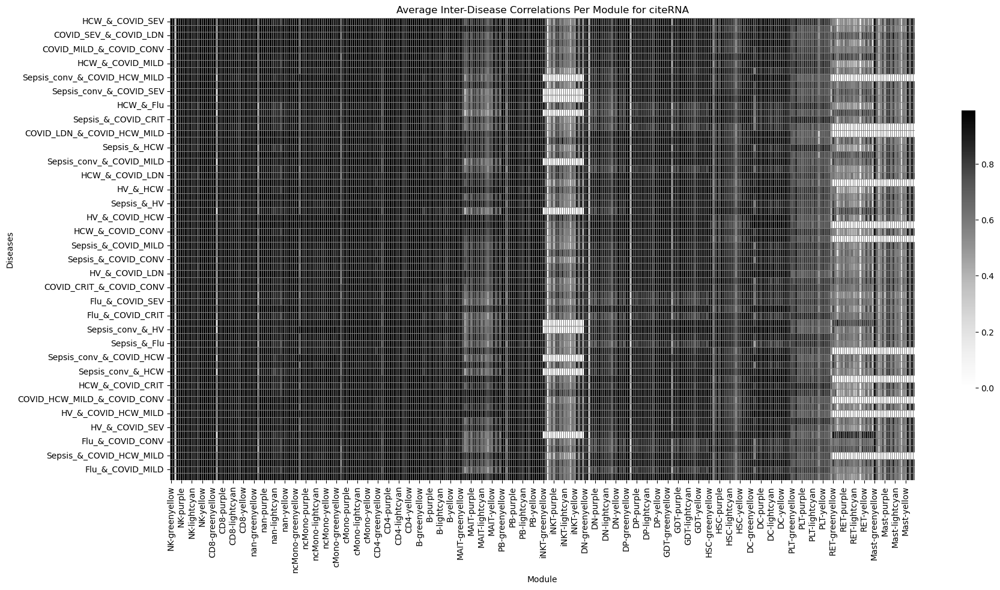

In [37]:
# Avergae Correlation of the Patients of two different diseases
module_inter_disease_avg = {ct:[0] * len(disease_pairs) for ct in citeRNA_disease_clusters_corr.keys() }

for m in citeRNA_disease_clusters_corr.keys():
    for i, pair in enumerate(disease_pairs):
        if (not (m.find("iNKT") > -1 and pair.find("Sepsis_conv") > -1) and
            not (m.find("RET") > -1 and pair.find("COVID_HCW_MILD") > -1) and 
            not (m.find("Mast") > -1 and pair.find("COVID_HCW_MILD") > -1 )):
            module_inter_disease_avg[m][i] = citeRNA_disease_clusters_corr[m]["inter_diseases"][pair].mean().mean()
        
df = pd.DataFrame(data = module_inter_disease_avg, index = disease_pairs)

fig, ax = plt.subplots(figsize=(20,10))  
sb.heatmap(df, cmap ='Greys',  robust = True, linewidth=0.4, linecolor = "grey", cbar_kws={"shrink": 0.6}, ax = ax)

plt.title("Average Inter-Disease Correlations Per Module for citeRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")


Text(0.5, 80.7222222222222, 'Module')

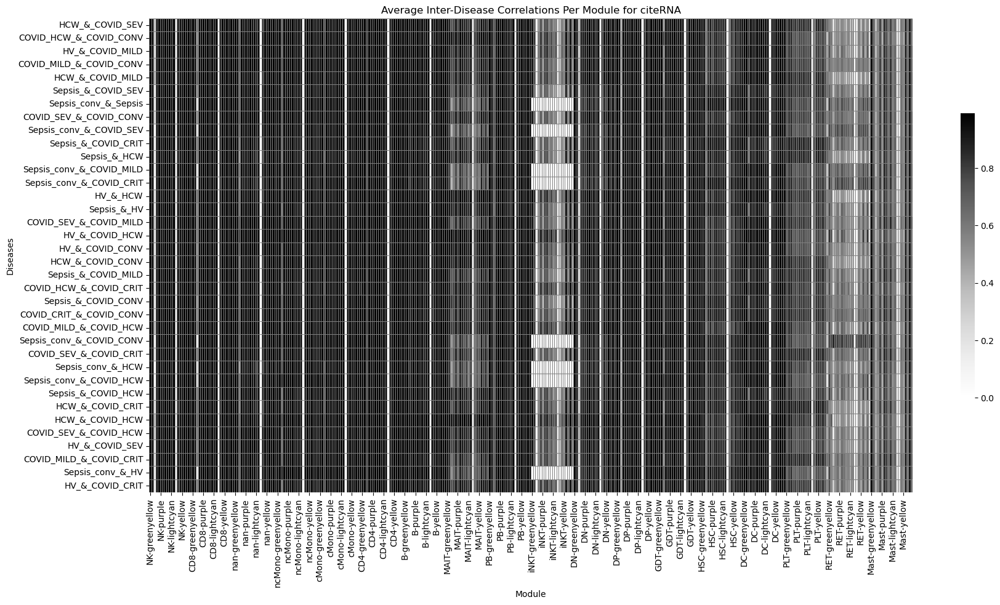

In [77]:
# Avergae Correlation of the Patients of two different diseases
module_inter_disease_avg = {ct:[0] * len(disease_pairs) for ct in citeRNA_disease_clusters_corr.keys() }

for m in non_grey_keys:
    for i, pair in enumerate(disease_pairs):
        if (not (m.find("iNKT") > -1 and pair.find("Sepsis_conv") > -1) and
            not (m.find("RET") > -1 and pair.find("COVID_HCW_MILD") > -1) and 
            not (m.find("Mast") > -1 and pair.find("COVID_HCW_MILD") > -1 )):
            module_inter_disease_avg[m][i] = citeRNA_disease_clusters_corr[m]["inter_diseases"][pair].mean().mean()
        
df = pd.DataFrame(data = module_inter_disease_avg, index = disease_pairs)

fig, ax = plt.subplots(figsize=(20,10))  
sb.heatmap(df, cmap ='Greys',  robust = True, linewidth=0.4, linecolor = "grey", cbar_kws={"shrink": 0.6}, ax = ax)

plt.title("Average Inter-Disease Correlations Per Module for citeRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")


/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.5, 'Simple Disease-Cell-Type Correlations in citeRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization')

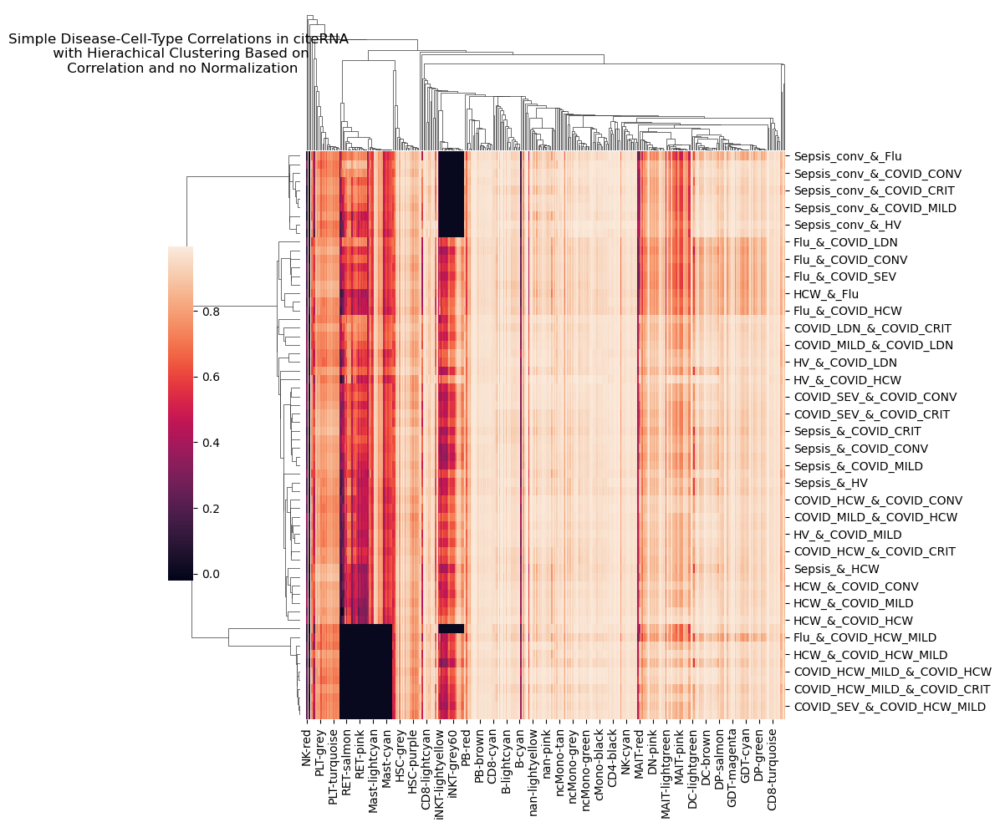

In [38]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations in citeRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease-Cell-Type Correlations \n in citeRNA with \n Two-Way Hierachical Clustering')

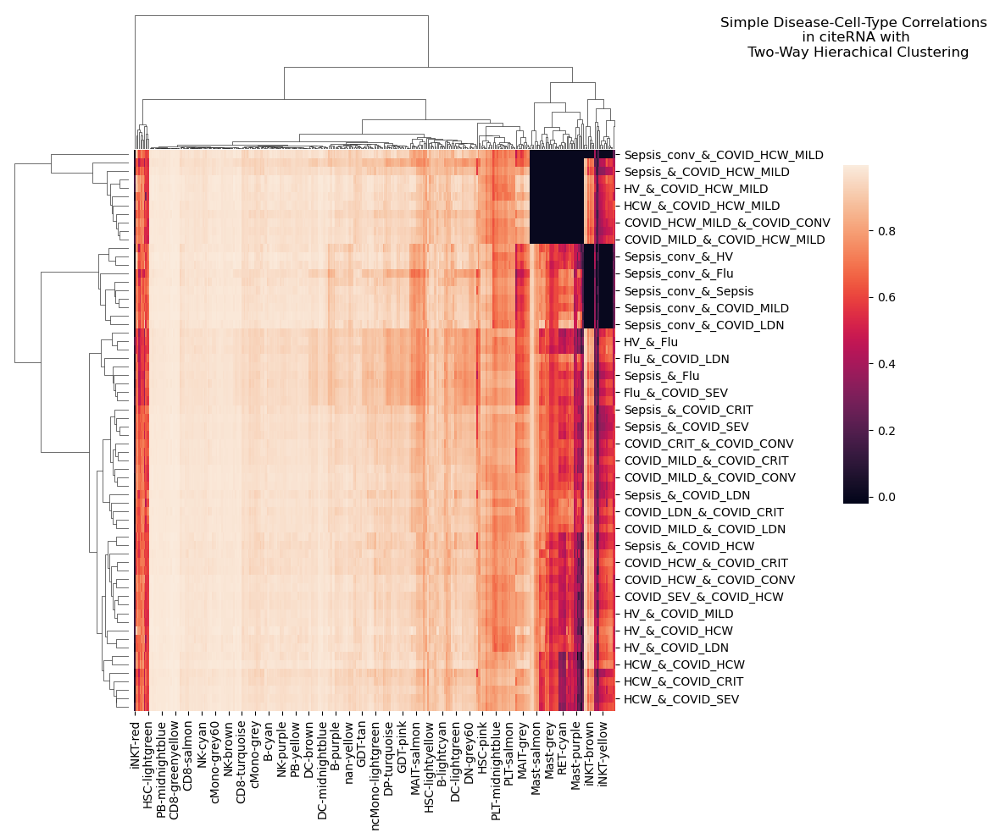

In [39]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations \n in citeRNA with \n Two-Way Hierachical Clustering", y = 1.3)

### ADT

#### Heatmaps

In [40]:
diseases = list(adt_disease_clusters_corr[list(adt_disease_clusters_corr.keys())[0]]["all"].index.unique())
for i in range(1, len(list(adt_disease_clusters_corr.keys()))):
    key = list(adt_disease_clusters_corr.keys())[i]
    diseases = diseases + list((adt_disease_clusters_corr[key]["all"].index.unique()))
diseases = list(set(diseases))

In [41]:
disease_pairs = list(adt_disease_clusters_corr[list(adt_disease_clusters_corr.keys())[0]]["inter_diseases"].keys())
for i in range(1, len(list(adt_disease_clusters_corr.keys()))):
    key = list(adt_disease_clusters_corr.keys())[i]
    disease_pairs = disease_pairs + list((adt_disease_clusters_corr[key]["inter_diseases"].keys()))
disease_pairs = list(set(disease_pairs))

Text(0.5, 76.05555555555551, 'Cell Types')

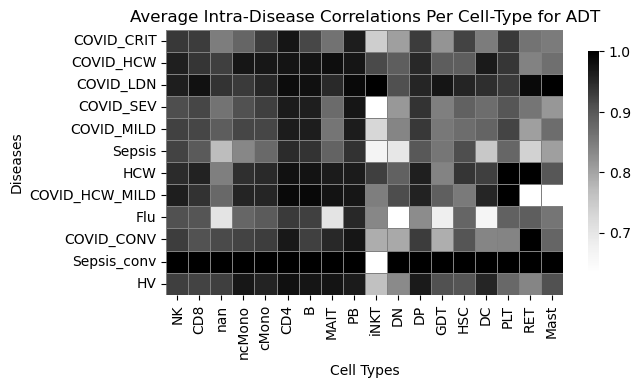

In [42]:
# All Cell Types and Diseases: Average Correlation between Patients of the Same Disease
cell_type_intra_disease_avg = {ct:[0] * len(diseases) for ct in adt_disease_clusters_corr.keys() }

for ct in adt_disease_clusters_corr.keys():
    for i, disease in enumerate(diseases):
        if (not (ct == "iNKT" and disease == "Sepsis_conv") and 
        not (ct == "RET" and disease == "COVID_HCW_MILD") and
        not (ct == "Mast" and disease == "COVID_HCW_MILD")): # These diseases do not exist for these cell types
            cell_type_intra_disease_avg[ct][i] = adt_disease_clusters_corr[ct]["intra_diseases"][disease].mean().mean()
        
df = pd.DataFrame(data =cell_type_intra_disease_avg, index = diseases)

sb.heatmap(df, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Intra-Disease Correlations Per Cell-Type for ADT")

plt.ylabel("Diseases")
plt.xlabel("Cell Types")

Text(0.5, 1.3, 'Simple Disease-Cell-Type Correlations \n in ADT with \n Two-Way Hierachical Clustering')

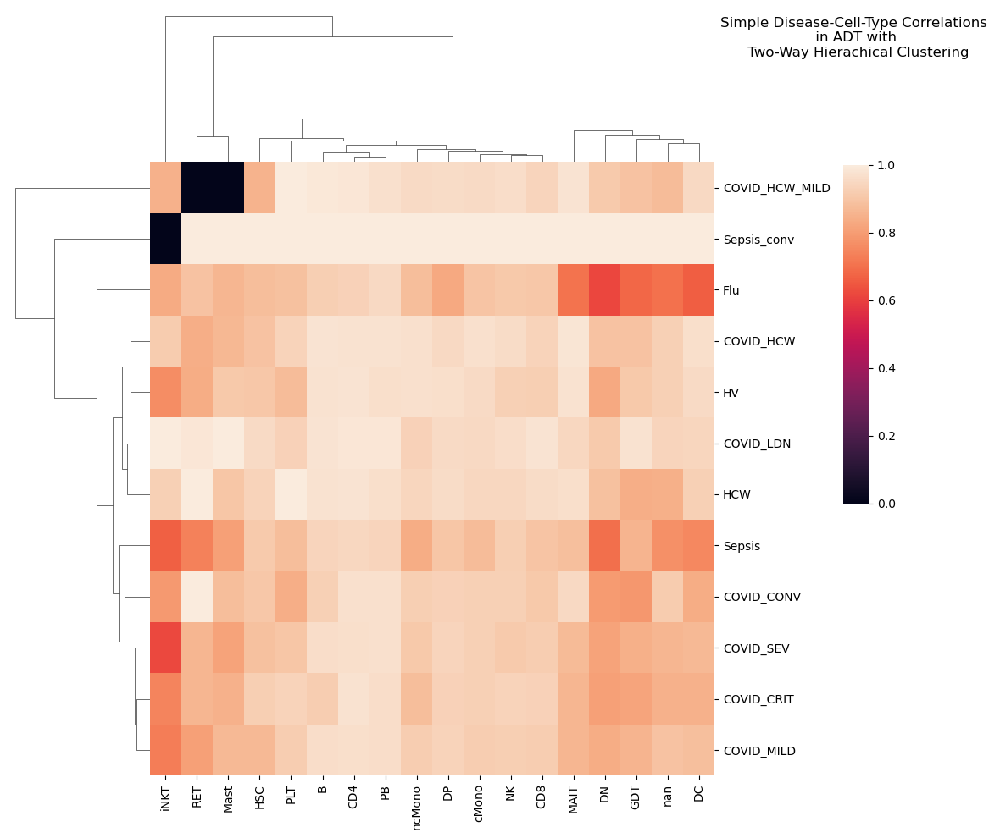

In [43]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations \n in ADT with \n Two-Way Hierachical Clustering", y = 1.3)

Text(0.5, 1.5, 'Simple Disease-Cell-Type Correlations in ADT \n with Hierachical Clustering Based on \n Correlation and no Normalization')

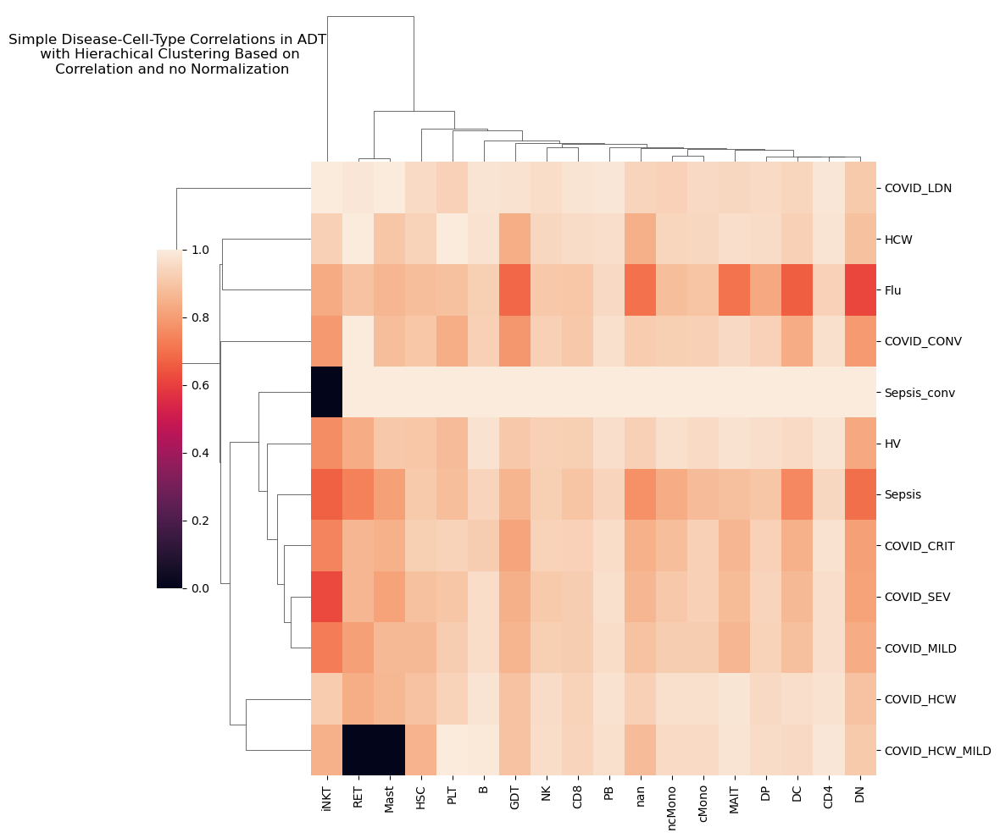

In [44]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations in ADT \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)

Text(0.5, 23.52222222222222, 'Cell Types')

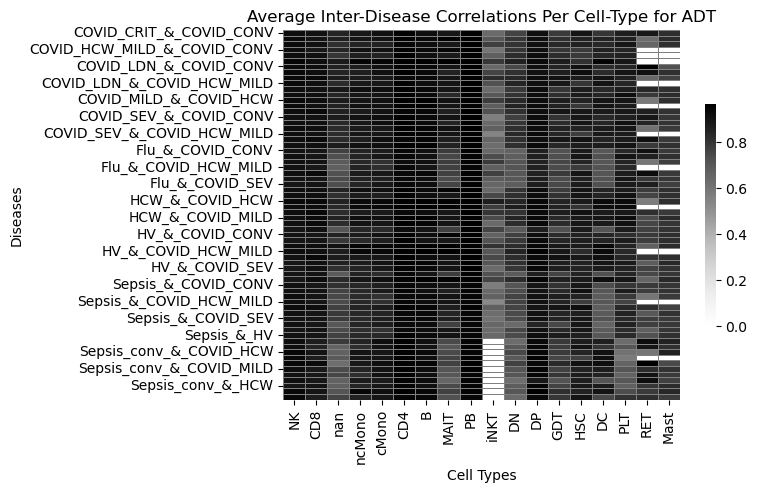

In [45]:
# Avergae Correlation of the Patients of two different diseases
disease_pairs = list(adt_disease_clusters_corr[list(adt_disease_clusters_corr.keys())[0]]["inter_diseases"].keys())
cell_type_intra_disease_avg = {ct:[0] * len(disease_pairs) for ct in adt_disease_clusters_corr.keys() }

for ct in adt_disease_clusters_corr.keys():
    for i, pair in enumerate(disease_pairs):
        if (not (ct == "iNKT" and pair.find("Sepsis_conv") > -1) and 
        not (ct == "RET" and pair.find("COVID_HCW_MILD") >  -1) and
        not (ct == "Mast" and pair.find("COVID_HCW_MILD") > -1 )): # These diseases do not exist for these cell types
            cell_type_intra_disease_avg[ct][i] = adt_disease_clusters_corr[ct]["inter_diseases"][pair].mean().mean()
        
df = pd.DataFrame(data =cell_type_intra_disease_avg, index = disease_pairs)

sb.heatmap(df, cmap ='Greys',  robust = True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Inter-Disease Correlations Per Cell-Type for ADT")
plt.ylabel("Diseases")
plt.xlabel("Cell Types")

Text(0.5, 1.5, 'Simple Disease-Cell-Type Correlations in ADT \n with Hierachical Clustering Based on \n Correlation and no Normalization')

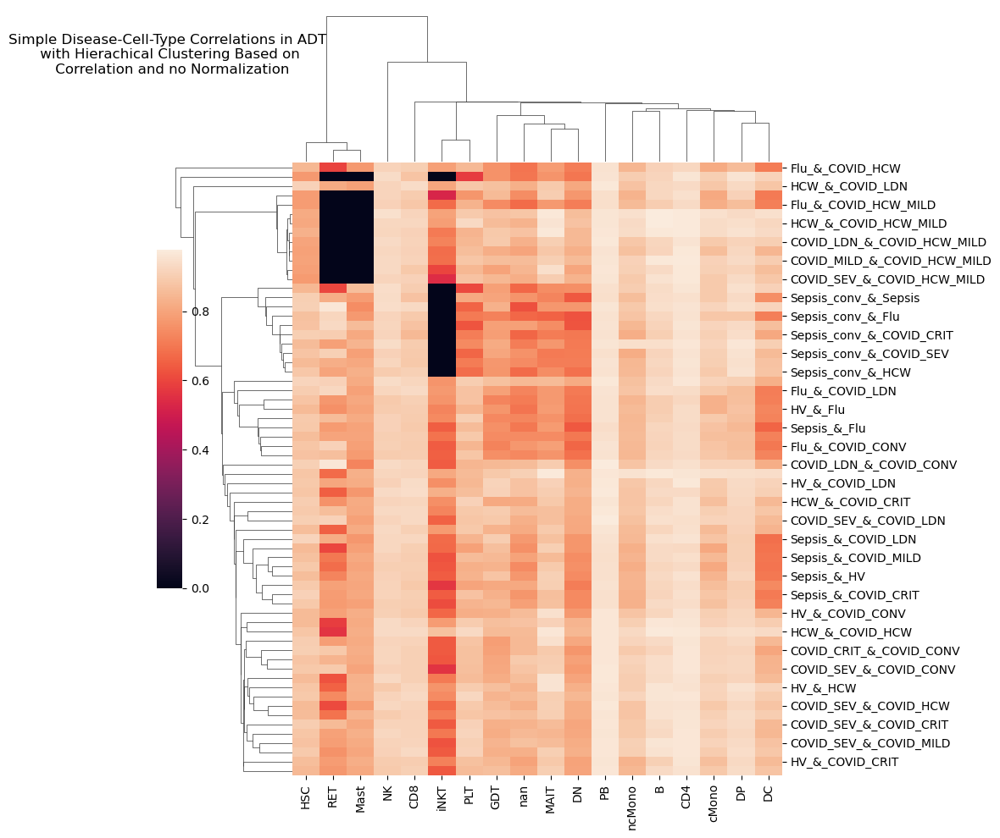

In [46]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations in ADT \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)

Text(0.5, 1.3, 'Simple Disease-Cell-Type Correlations \n in ADT with \n Two-Way Hierachical Clustering')

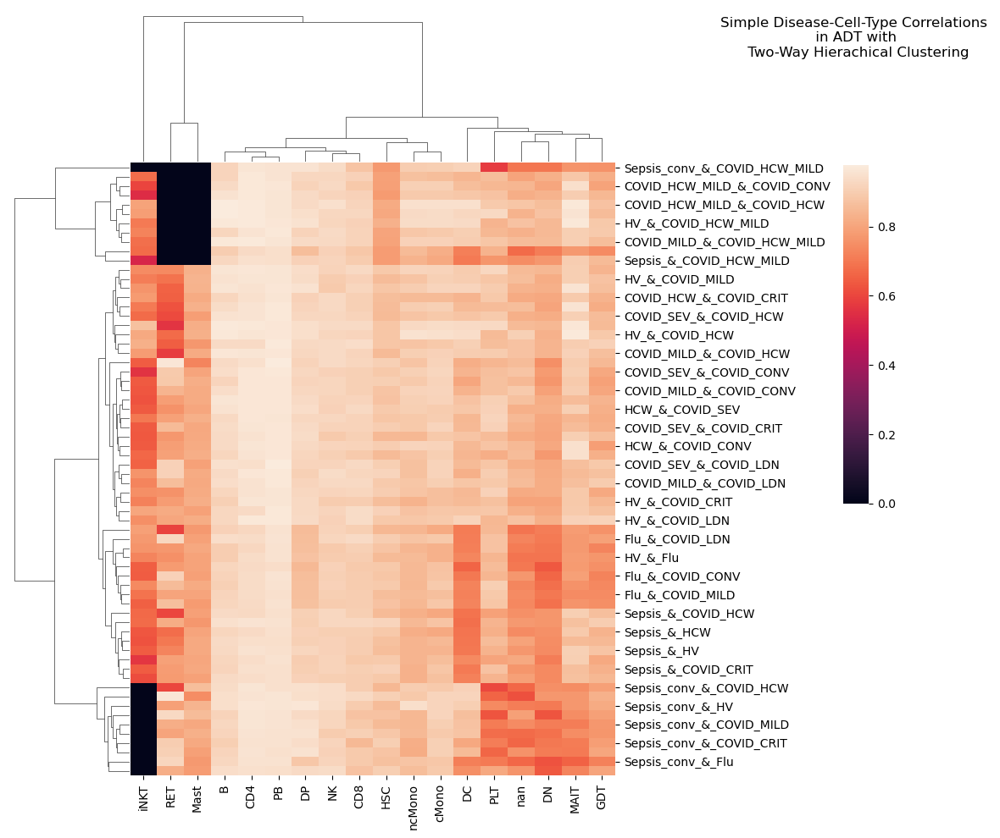

In [47]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations \n in ADT with \n Two-Way Hierachical Clustering", y = 1.3)

### FACS

#### Heatmaps

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations in Facs with \n Two-Way Hierachical Clustering')

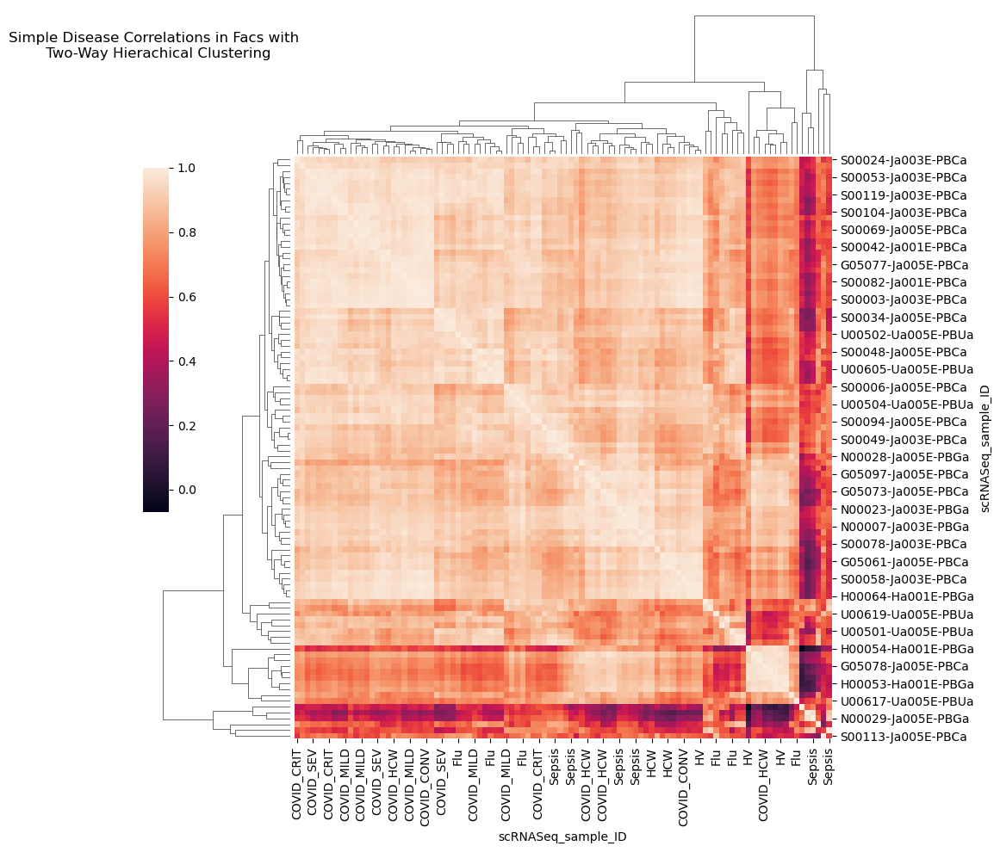

In [ ]:
sb.clustermap(corr_p_d_facs, cbar_pos=(0, .4, .03, .4))
plt.title("Simple Patient-Disease Correlations in Facs with \n Two-Way Hierachical Clustering", y = 1.3)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations in Facs with \n Two-Way Hierachical Clustering')

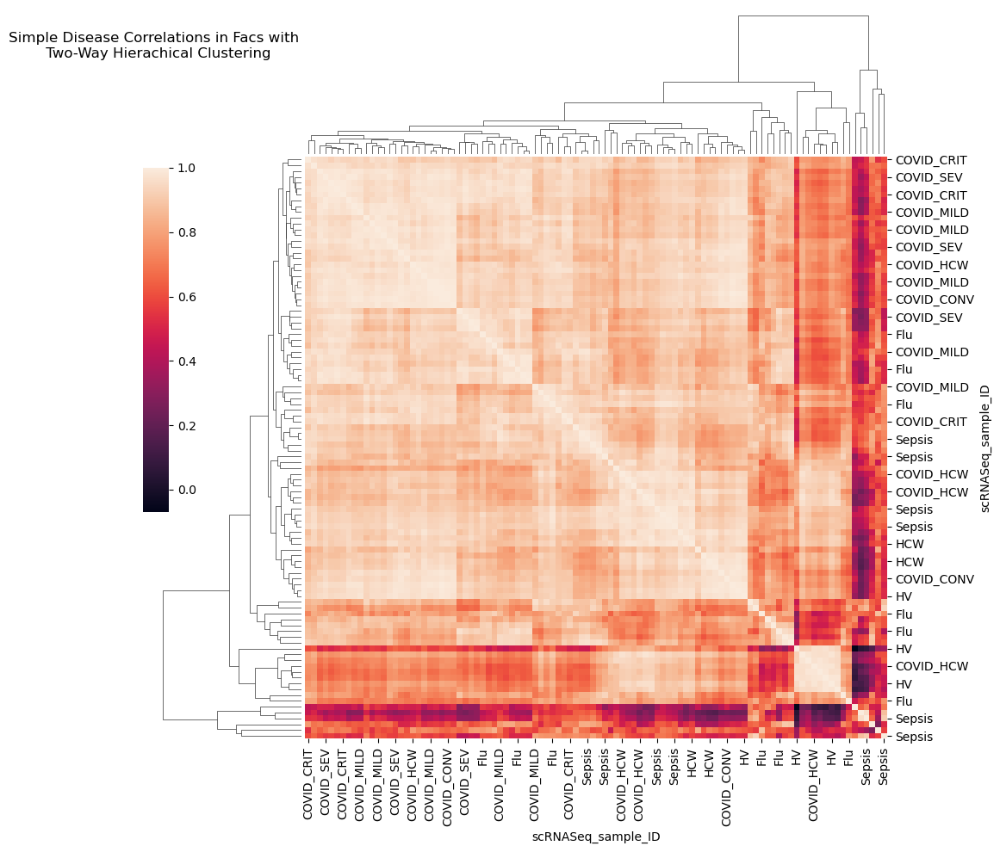

In [ ]:
corr_d_facs.sort_index(inplace=True)
corr_d_facs.sort_index(inplace=True, axis = 1)
sb.clustermap(corr_d_facs, cbar_pos=(0, .4, .03, .4))
plt.title("Simple Disease Correlations in Facs with \n Two-Way Hierachical Clustering", y = 1.3)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 734.4444444444445, 'Patients')

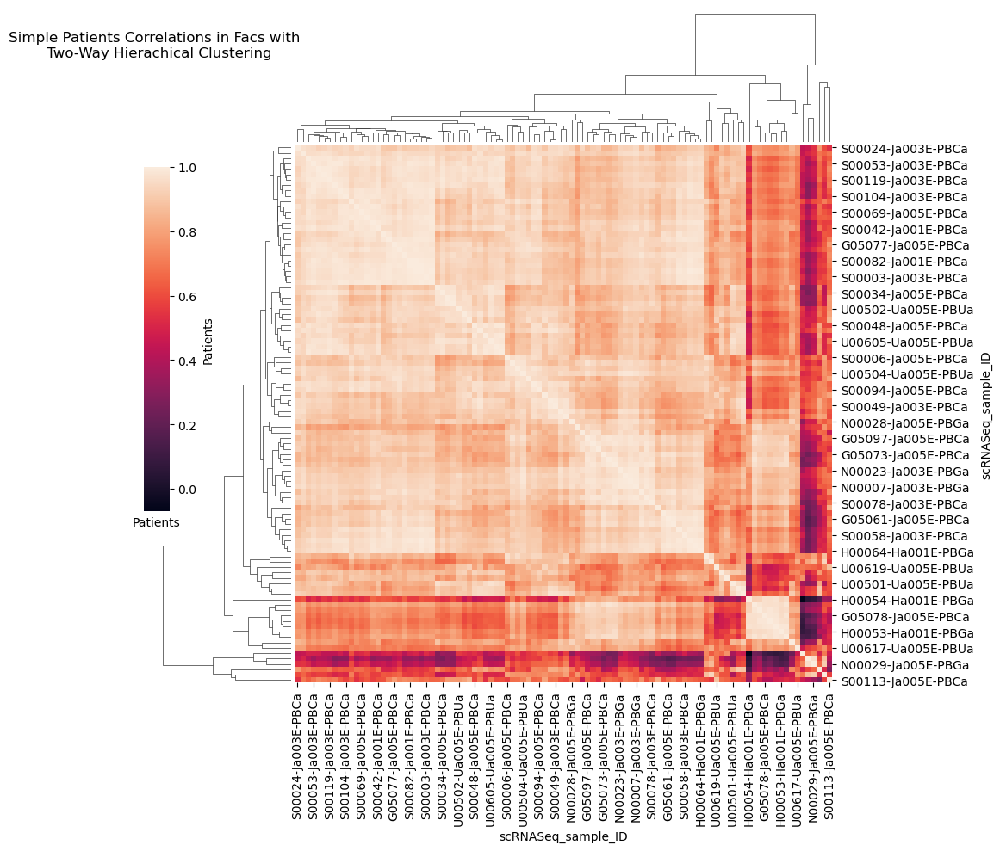

In [ ]:
sb.clustermap(corr_p_facs, cbar_pos=(0, .4, .03, .4))
plt.title("Simple Patients Correlations in Facs with \n Two-Way Hierachical Clustering", y = 1.3)
plt.ylabel("Patients")
plt.xlabel("Patients")

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 734.4444444444445, 'Patients')

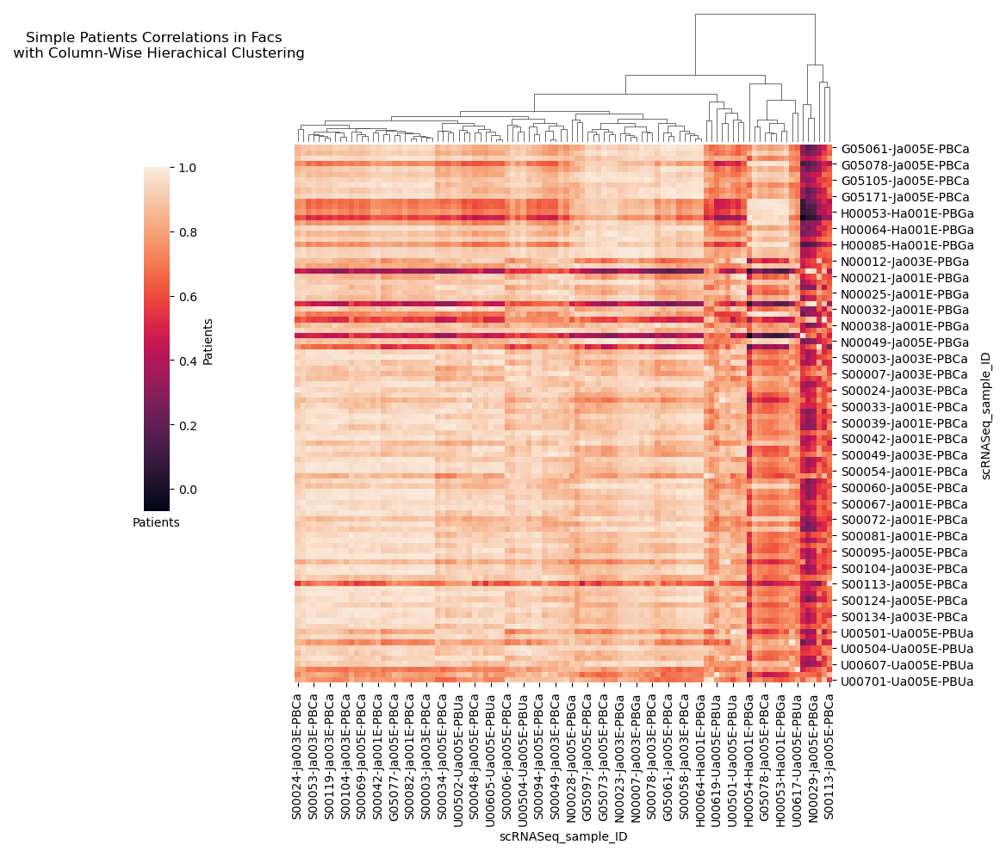

In [ ]:
sb.clustermap(corr_p_facs, cbar_pos=(0, .4, .03, .4), row_cluster=False,)
plt.title("Simple Patients Correlations in Facs \n with Column-Wise Hierachical Clustering" , y = 1.3)
plt.ylabel("Patients")
plt.xlabel("Patients")

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.5, 'Simple Patients Correlations in Facs\nwith Hierachical Clustering Based on\nCorrelation and no Normalization')

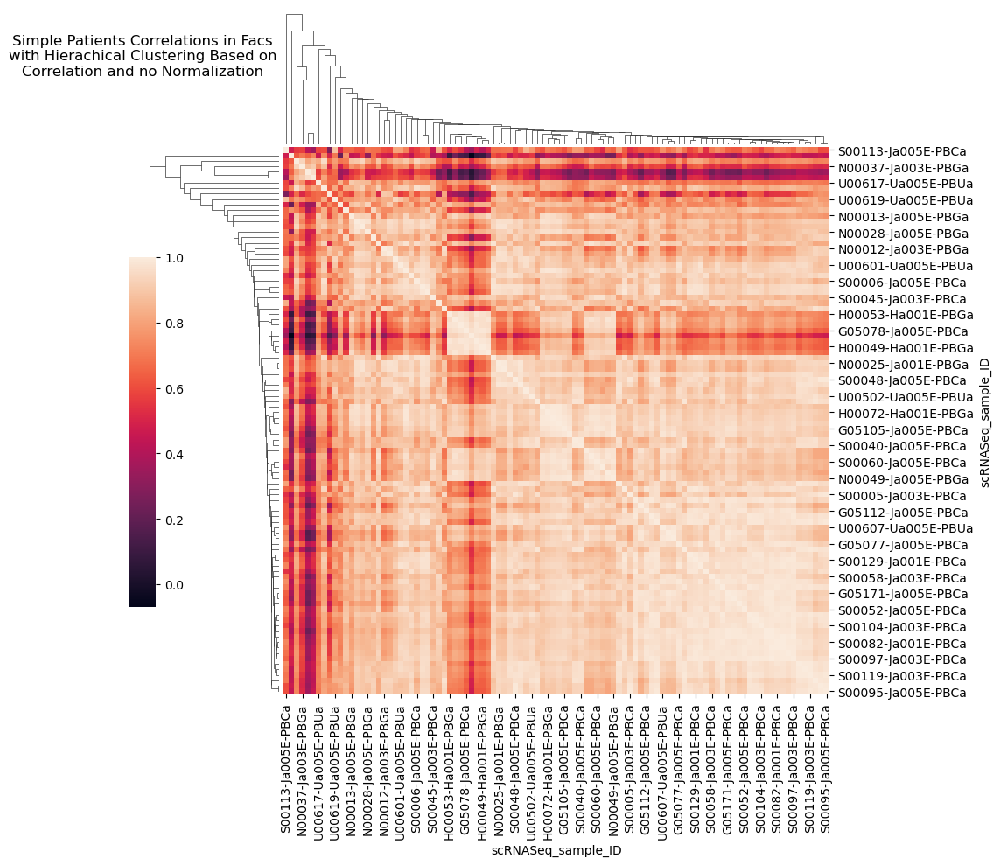

In [ ]:
sb.clustermap(corr_p_facs, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Patients Correlations in Facs" + "\n" + "with Hierachical Clustering Based on" + "\n" + "Correlation and no Normalization", y = 1.5)
plt.ylabel("Patients")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Patient Correlations with Diseases in Facs')

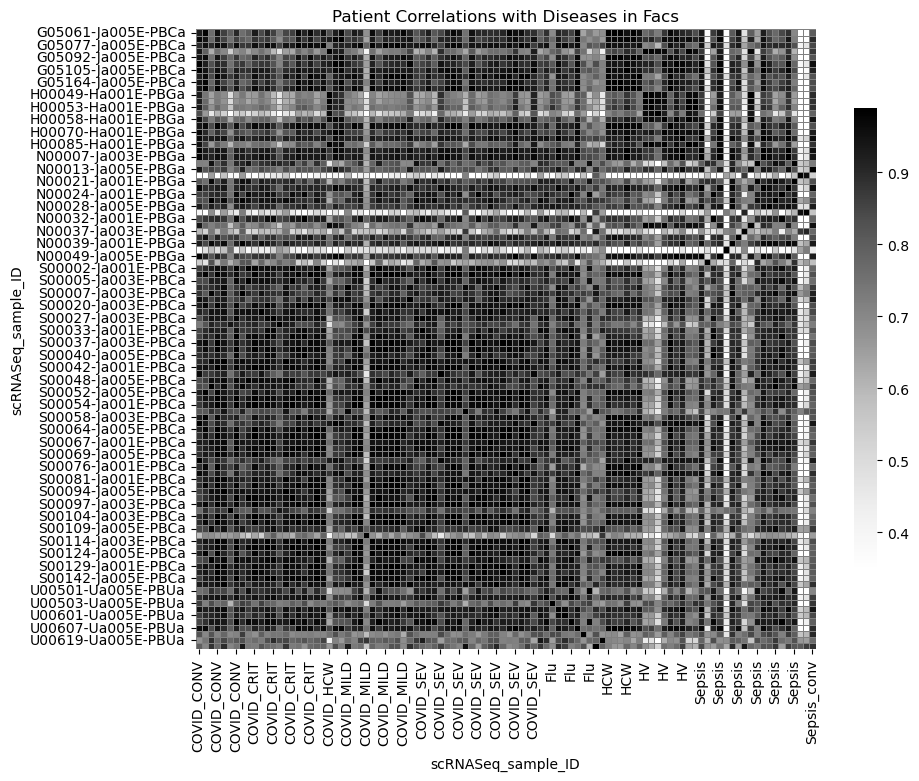

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
sb.heatmap(corr_p_d_facs, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6})
plt.title("Patient Correlations with Diseases in Facs")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 635.7222222222223, 'Patients')

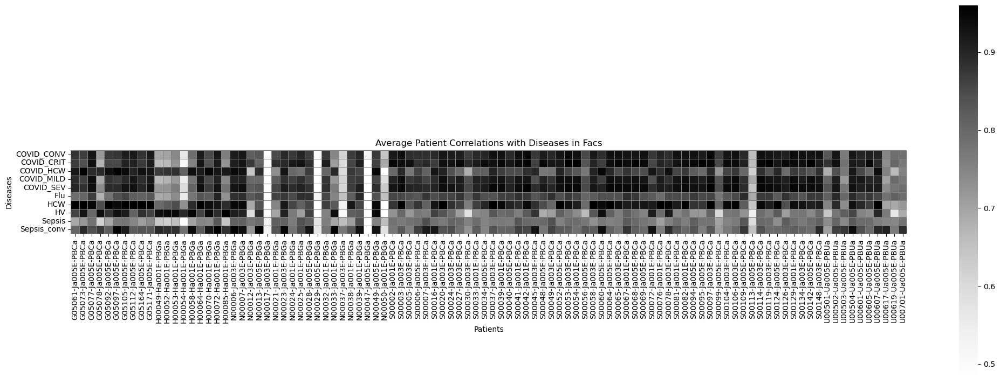

In [ ]:
fig,ax=plt.subplots(figsize=(25,15))
sb.heatmap(corr_p_d_facs.transpose().groupby("scRNASeq_sample_ID").mean(), cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in Facs")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 155.72222222222217, 'Patients')

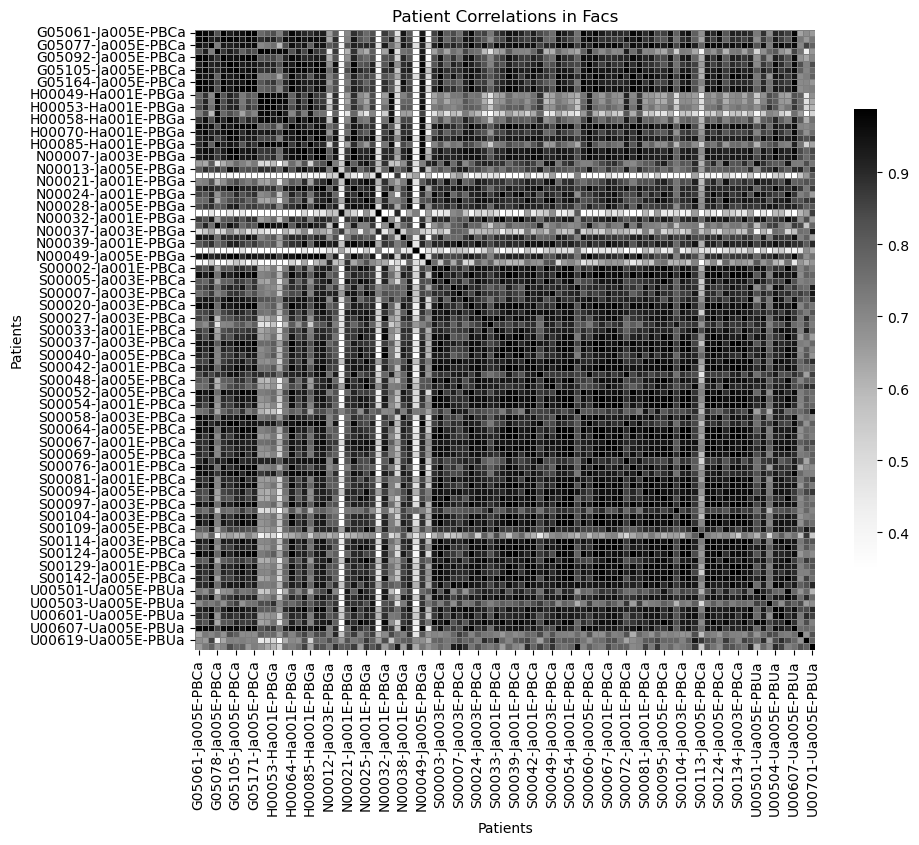

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
sb.heatmap(corr_p_facs, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6})
plt.title("Patient Correlations in Facs")
plt.ylabel("Patients")
plt.xlabel("Patients")

Text(0.5, 155.58159722222217, 'Diseases')

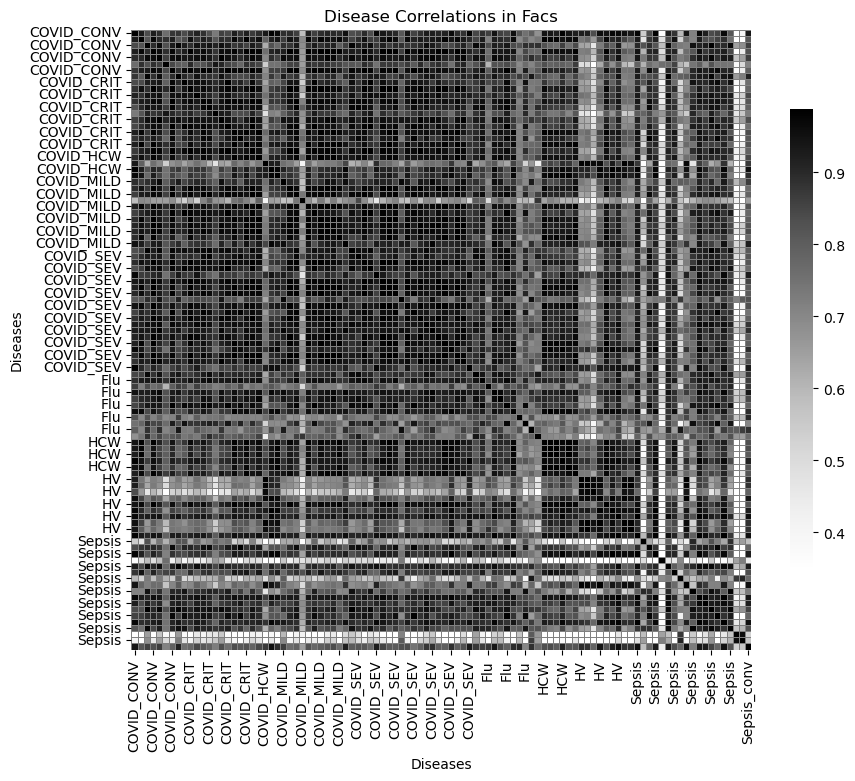

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))
sb.heatmap(corr_d_facs, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6})
plt.title("Disease Correlations in Facs")
plt.ylabel("Diseases")
plt.xlabel("Diseases")

#### Histograms

In [ ]:
HV_Flu = facs_disease_clusters_corr["inter_diseases"]["HV_&_Flu"].to_numpy().flatten()
COVID_CRIT_COVID_CONV = facs_disease_clusters_corr["inter_diseases"]["COVID_CRIT_&_COVID_CONV"].to_numpy().flatten()
COVID_HCW_COVID_CRIT = facs_disease_clusters_corr["inter_diseases"]["COVID_HCW_&_COVID_CRIT"].to_numpy().flatten()
Flu_COVID_HCW = facs_disease_clusters_corr["inter_diseases"]["Flu_&_COVID_HCW"].to_numpy().flatten()
COVID_SEV_COVID_HCW = facs_disease_clusters_corr["inter_diseases"]["COVID_SEV_&_COVID_HCW"].to_numpy().flatten()
HV_COVID_SEV = facs_disease_clusters_corr["inter_diseases"]["HV_&_COVID_SEV"].to_numpy().flatten()
Sepsis_conv_HCW = facs_disease_clusters_corr["inter_diseases"]["Sepsis_conv_&_HCW"].to_numpy().flatten()
Sepsis_conv_Sepsis = facs_disease_clusters_corr["inter_diseases"]["Sepsis_conv_&_Sepsis"].to_numpy().flatten()

HV = facs_disease_clusters_corr["intra_diseases"]["HV"].to_numpy().flatten()
Flu = facs_disease_clusters_corr["intra_diseases"]["Flu"].to_numpy().flatten()
COVID_SEV = facs_disease_clusters_corr["intra_diseases"]["COVID_SEV"].to_numpy().flatten()
COVID_CRIT = facs_disease_clusters_corr["intra_diseases"]["COVID_CRIT"].to_numpy().flatten()
COVID_CONV = facs_disease_clusters_corr["intra_diseases"]["COVID_CONV"].to_numpy().flatten()
COVID_HCW = facs_disease_clusters_corr["intra_diseases"]["COVID_HCW"].to_numpy().flatten()
Sepsis_conv = facs_disease_clusters_corr["intra_diseases"]["Sepsis_conv"]
Sepsis = facs_disease_clusters_corr["intra_diseases"]["Sepsis"].to_numpy().flatten()
HCW = facs_disease_clusters_corr["intra_diseases"]["HCW"].to_numpy().flatten()

Text(0.5, 1.0, 'Disease Counts in Facs')

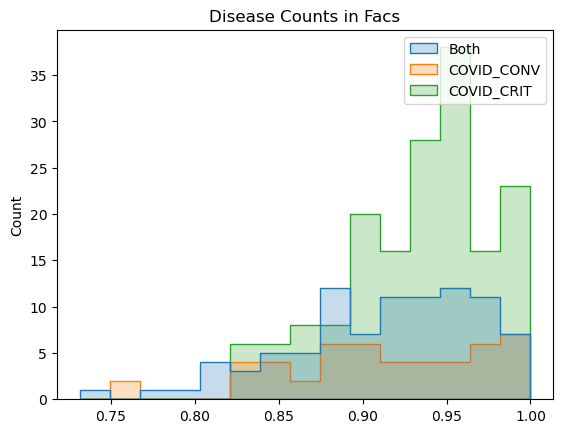

In [ ]:
sb.histplot(data={"Both": COVID_CRIT_COVID_CONV, "COVID_CONV": COVID_CONV, "COVID_CRIT": COVID_CRIT}, element="step",
    stat="count", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

Text(0.5, 1.0, 'Disease Counts in Facs')

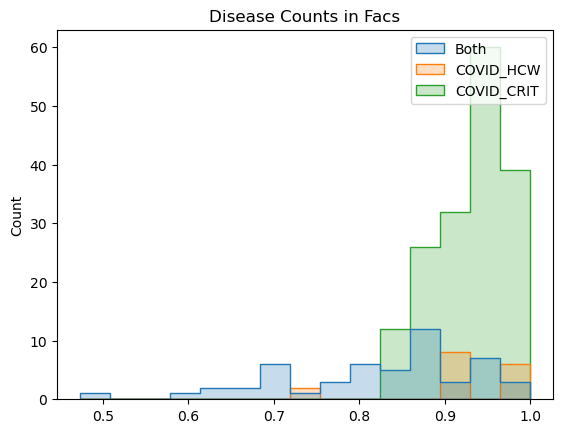

In [ ]:
sb.histplot(data={"Both": COVID_HCW_COVID_CRIT, "COVID_HCW": COVID_HCW, "COVID_CRIT": COVID_CRIT}, element="step",
    stat="count", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

In [ ]:
sb.histplot(data={"Both": Flu_COVID_HCW, "COVID_HCW": COVID_HCW, "Flu": Flu}, element="step",
    stat="count", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

Text(0.5, 1.0, 'Disease Counts in Facs')

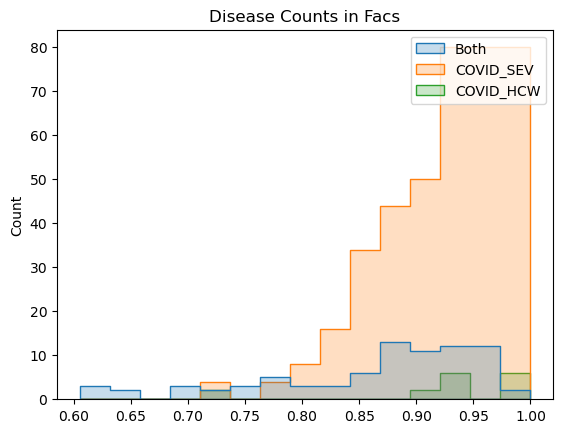

In [ ]:
sb.histplot(data={"Both": COVID_SEV_COVID_HCW, "COVID_SEV": COVID_SEV, "COVID_HCW": COVID_HCW}, element="step",
    stat="count", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

Text(0.5, 1.0, 'Disease Counts in Facs')

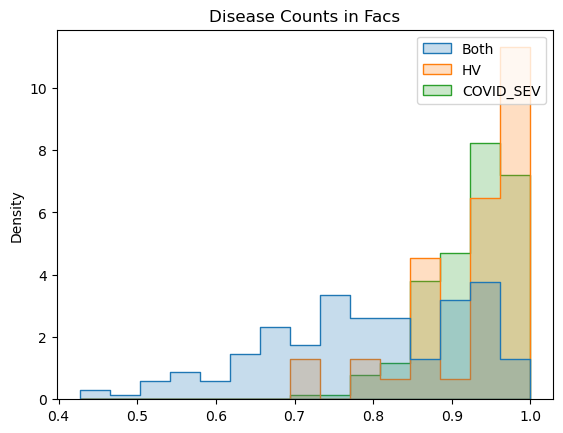

In [ ]:
sb.histplot(data={"Both": HV_COVID_SEV, "HV": HV, "COVID_SEV": COVID_SEV}, element="step",
    stat="density", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

Text(0.5, 1.0, 'Disease Counts in Facs')

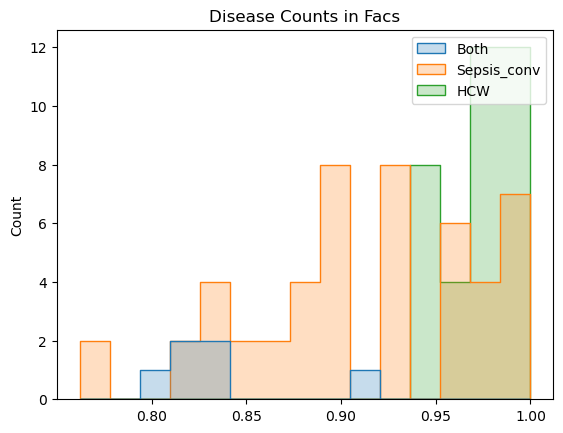

In [ ]:
sb.histplot(data={"Both": Sepsis_conv_HCW, "Sepsis_conv": COVID_CONV, "HCW": HCW}, element="step",
    stat="count", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

Text(0.5, 1.0, 'Disease Counts in Facs')

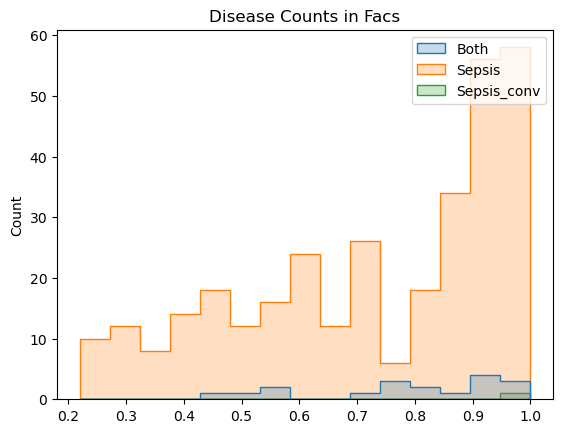

In [ ]:
sb.histplot(data={"Both": Sepsis_conv_Sepsis, "Sepsis": Sepsis, "Sepsis_conv": Sepsis_conv}, element="step",
    stat="count", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

Text(0.5, 1.0, 'Disease Counts in Facs')

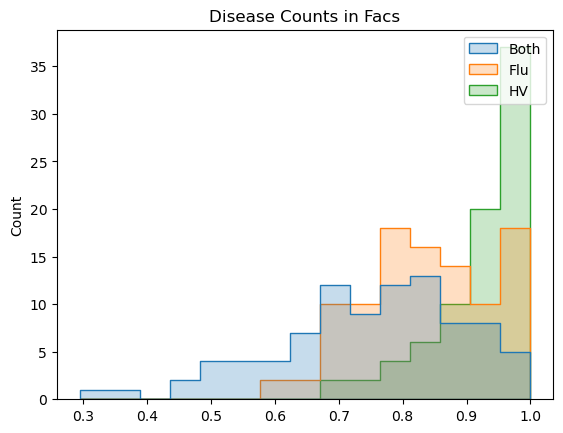

In [ ]:
sb.histplot(data={"Both": HV_Flu, "Flu": Flu, "HV": HV}, element="step",
    stat="count", common_norm=False, bins = 15)
plt.title("Disease Counts in Facs")

<Axes: ylabel='Density'>

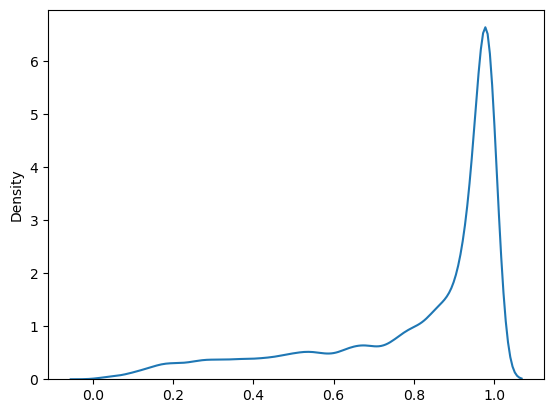

In [ ]:
sb.kdeplot(corr_p_luminex.to_numpy().flatten()) 

### bulkRNA

#### Heatmaps

In [78]:
diseases = list(bulkRNA_disease_clusters_corr[list(bulkRNA_disease_clusters_corr.keys())[0]]["all"].index.unique())
for i in range(1, len(list(bulkRNA_disease_clusters_corr.keys()))):
    key = list(bulkRNA_disease_clusters_corr.keys())[i]
    diseases = diseases + list((bulkRNA_disease_clusters_corr[key]["all"].index.unique()))
diseases = list(set(diseases))

disease_pairs = list(bulkRNA_disease_clusters_corr[list(bulkRNA_disease_clusters_corr.keys())[0]]["inter_diseases"].keys())
for i in range(1, len(list(bulkRNA_disease_clusters_corr.keys()))):
    key = list(bulkRNA_disease_clusters_corr.keys())[i]
    disease_pairs = disease_pairs + list((bulkRNA_disease_clusters_corr[key]["inter_diseases"].keys()))
disease_pairs = list(set(disease_pairs))

Text(0.5, 23.52222222222222, 'Module')

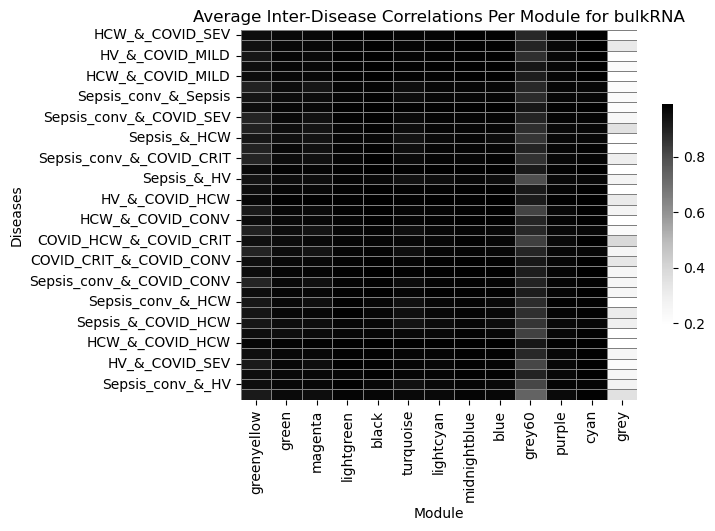

In [79]:
# Avergae Correlation of the Patients of two different diseases
module_inter_disease_avg = {ct:[0] * len(disease_pairs) for ct in bulkRNA_disease_clusters_corr.keys() }

for m in bulkRNA_disease_clusters_corr.keys():
    for i, pair in enumerate(disease_pairs):
        module_inter_disease_avg[m][i] = bulkRNA_disease_clusters_corr[m]["inter_diseases"][pair].mean().mean()
        
df = pd.DataFrame(data = module_inter_disease_avg, index = disease_pairs)

sb.heatmap(df, cmap ='Greys',  robust = True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Inter-Disease Correlations Per Module for bulkRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")


Text(0.5, 23.52222222222222, 'Module')

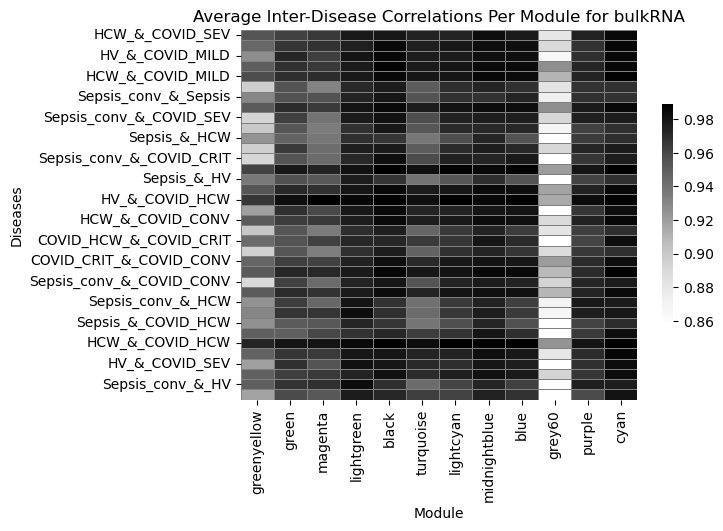

In [80]:
cols = [c for c in df.columns if not c == "grey"] # Remove the noise

sb.heatmap(df[cols], cmap ='Greys',  robust = True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Inter-Disease Correlations Per Module for bulkRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")

Text(0.5, 1.3, 'Simple Disease-Module Correlations \n in bulkRNA with \n Two-Way Hierachical Clustering')

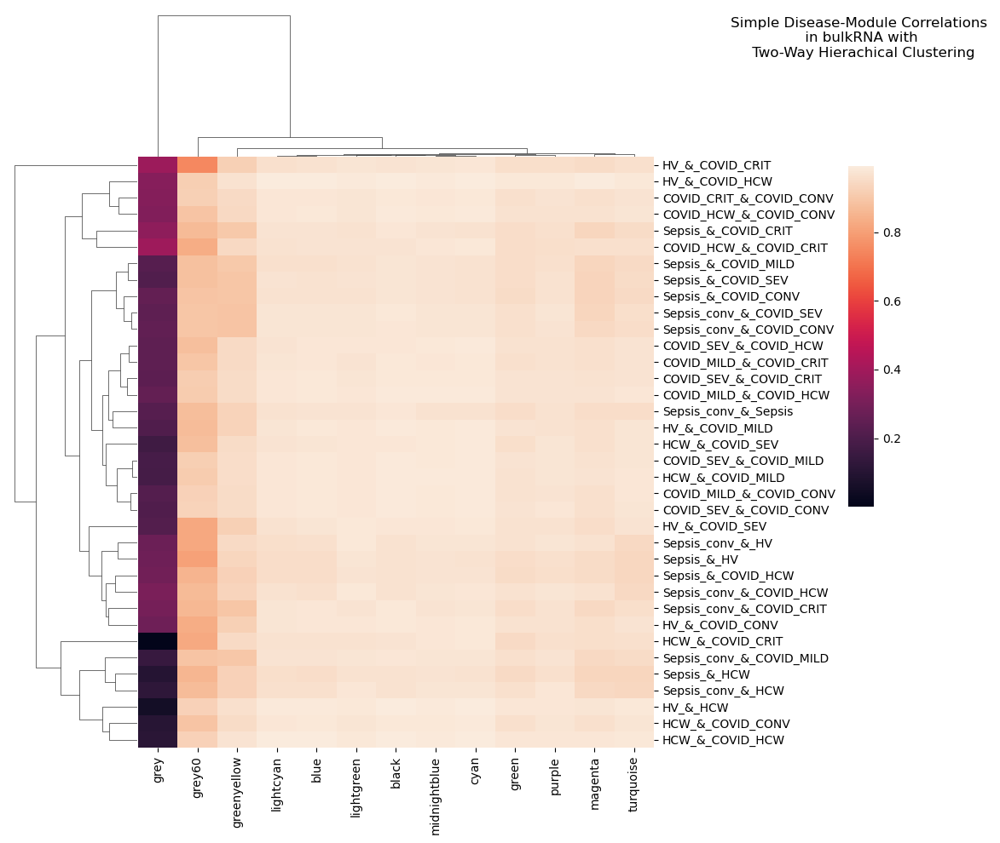

In [ ]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Module Correlations \n in bulkRNA with \n Two-Way Hierachical Clustering", y = 1.3)

Text(0.5, 70.96837606837603, 'Module')

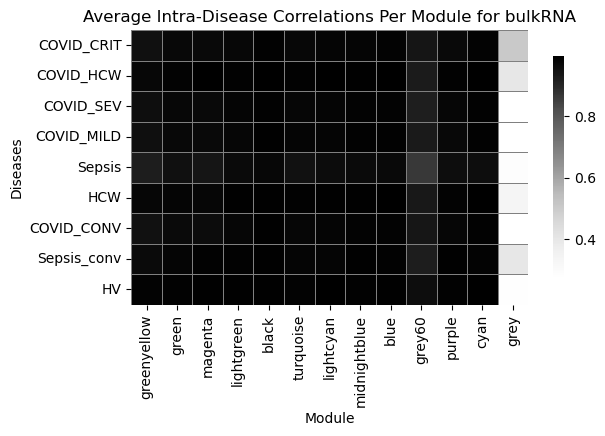

In [81]:
# All Cell Types and Diseases: Average Correlation between Patients of the Same Disease
module_intra_disease_avg = {m:[0] * len(diseases) for m in bulkRNA_disease_clusters_corr.keys() }

for m in bulkRNA_disease_clusters_corr.keys():
    for i, disease in enumerate(diseases):
        module_intra_disease_avg[m][i] = bulkRNA_disease_clusters_corr[m]["intra_diseases"][disease].mean().mean()
        
df = pd.DataFrame(data = module_intra_disease_avg, index = diseases)

sb.heatmap(df, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Intra-Disease Correlations Per Module for bulkRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")


Text(0.5, 23.52222222222222, 'Module')

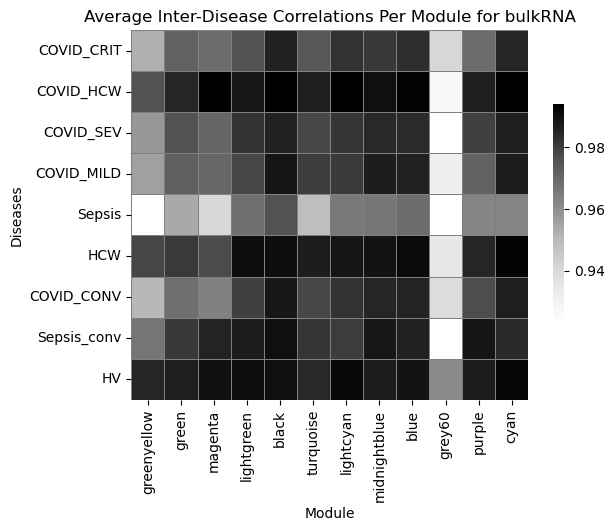

In [82]:
cols = [c for c in df.columns if not c == "grey"] # Remove the noise

sb.heatmap(df[cols], cmap ='Greys',  robust = True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Inter-Disease Correlations Per Module for bulkRNA")

plt.ylabel("Diseases")
plt.xlabel("Module")

Text(0.5, 1.5, 'Simple Disease-Module Correlations in bulkRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization')

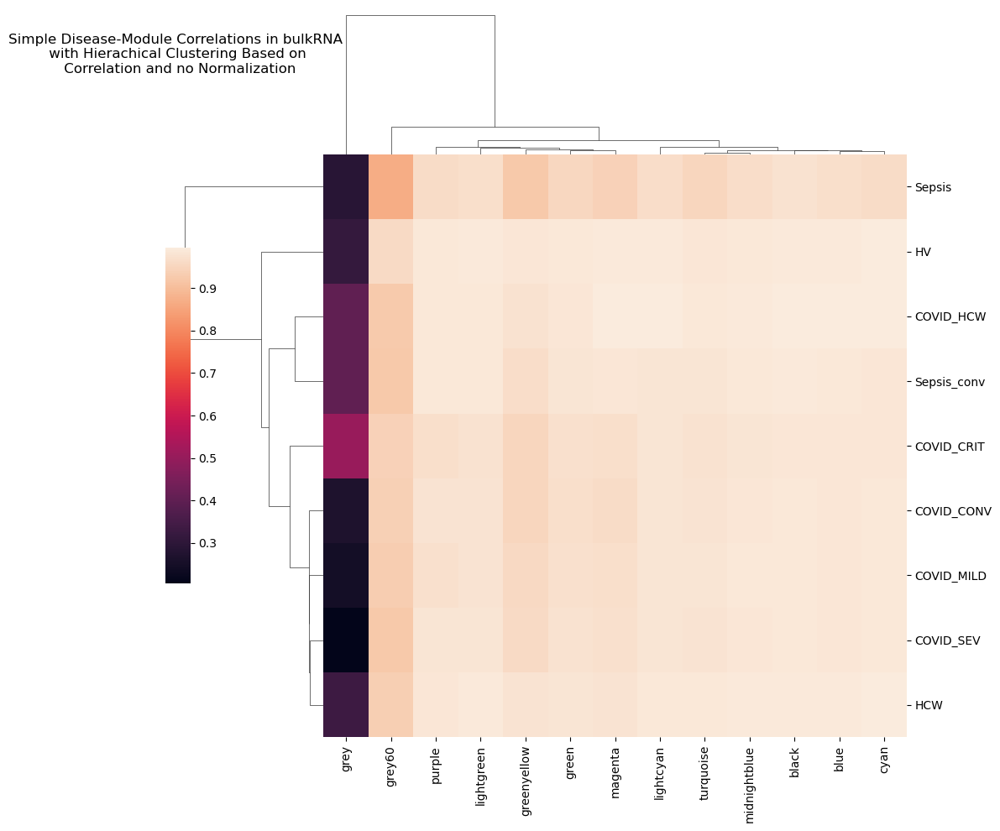

In [ ]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Module Correlations in bulkRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)

Text(0.5, 1.3, 'Simple Disease-Module Correlations \n in bulkRNA with \n Two-Way Hierachical Clustering')

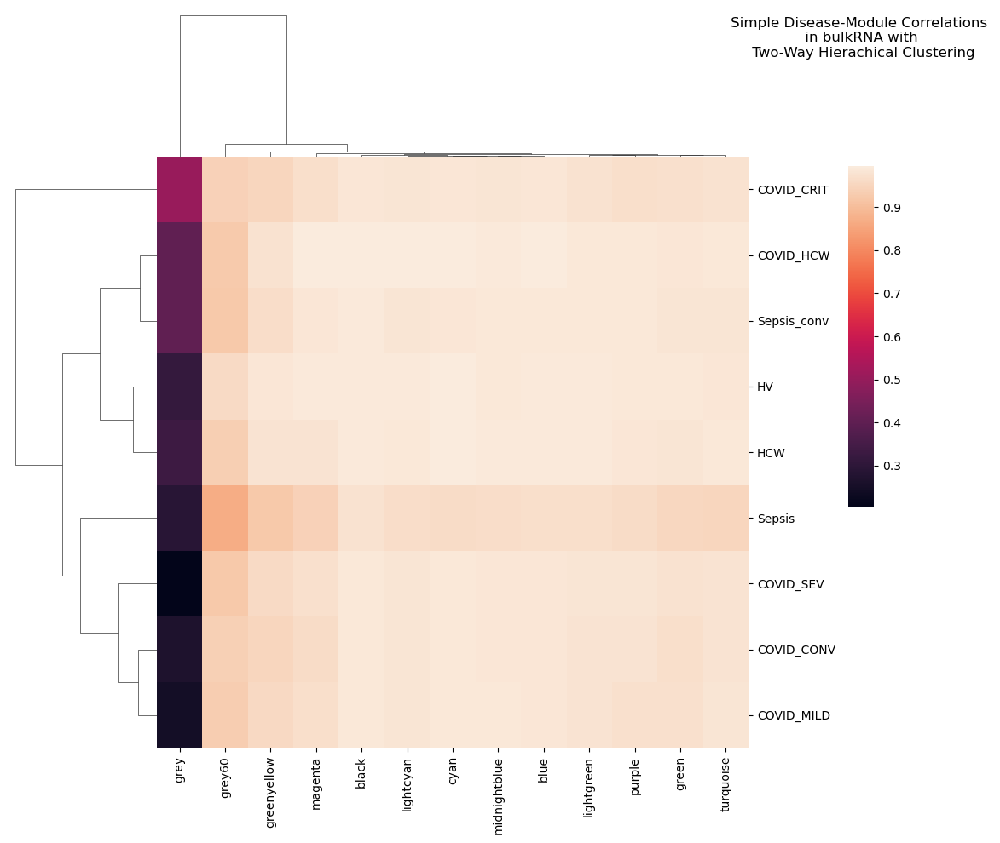

In [ ]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Module Correlations \n in bulkRNA with \n Two-Way Hierachical Clustering", y = 1.3)

Text(0.5, 1.5, 'Simple Disease-Module Correlations in bulkRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization')

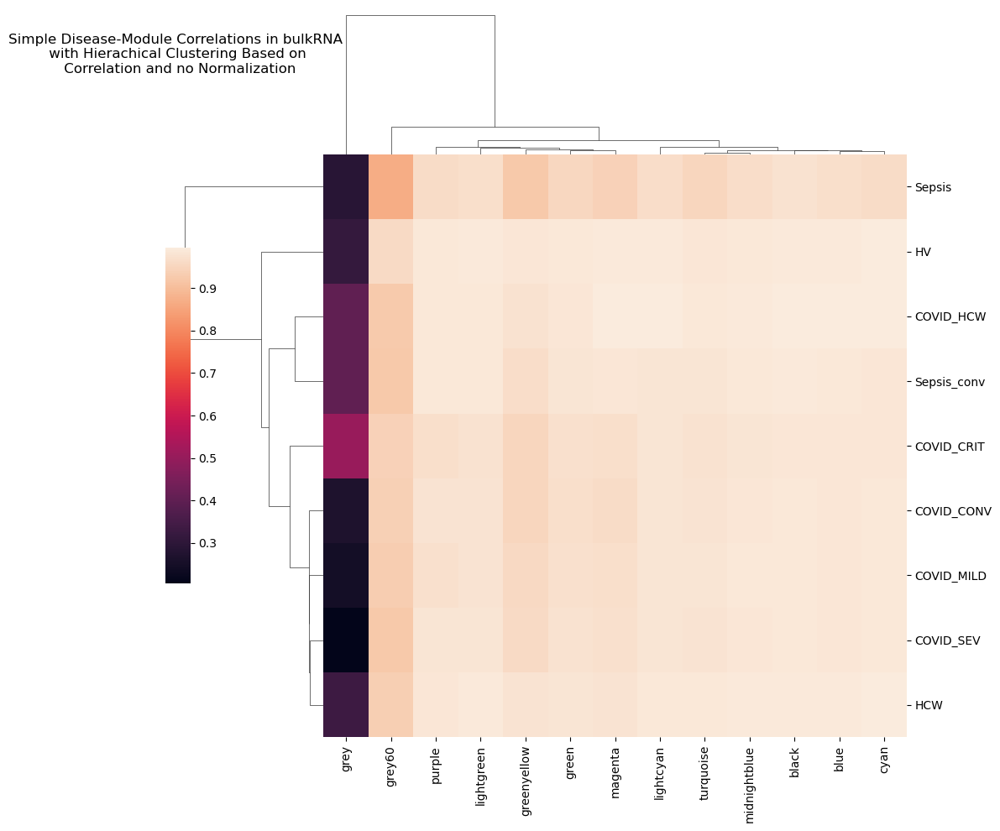

In [ ]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Module Correlations in bulkRNA \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)

<Axes: >

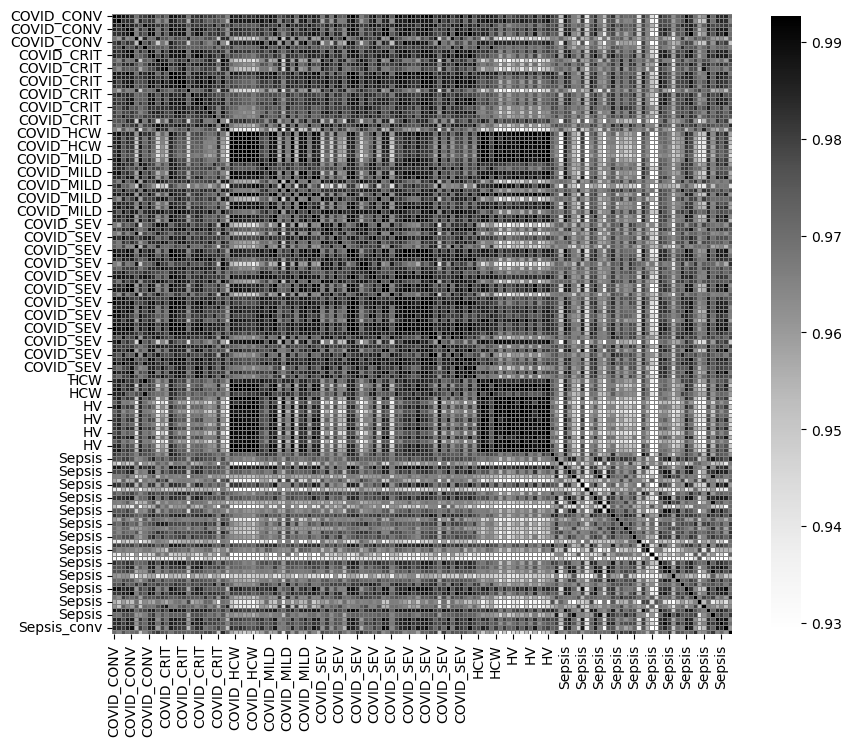

In [ ]:
# lightcyan
fig,ax=plt.subplots(figsize=(10,10))
sb.heatmap(bulkRNA_disease_clusters_corr["lightcyan"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})

<Axes: >

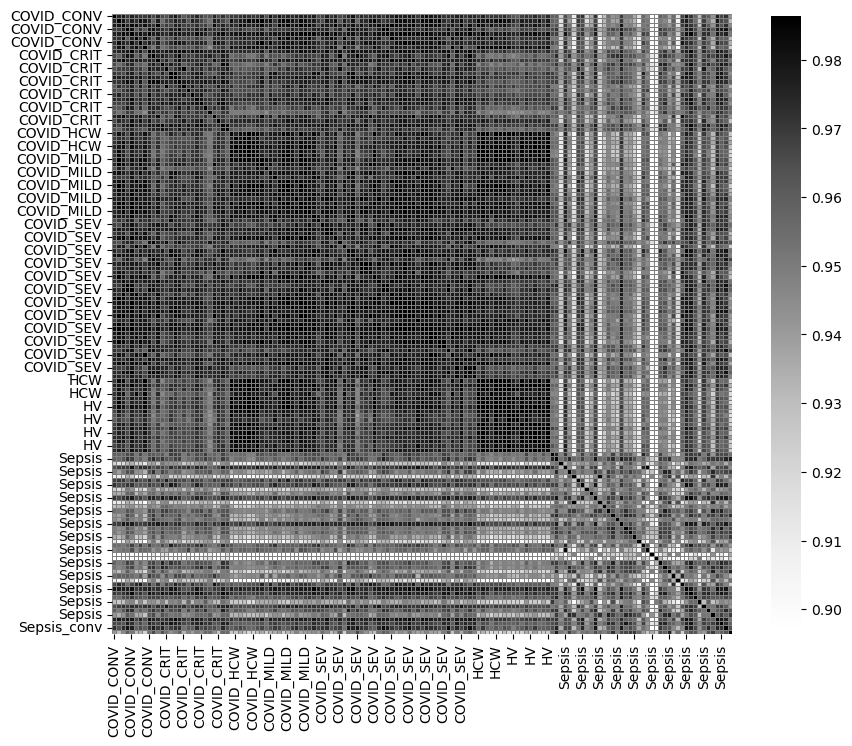

In [ ]:
# turquoise
fig,ax=plt.subplots(figsize=(10,10))
sb.heatmap(bulkRNA_disease_clusters_corr["turquoise"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})

<Axes: >

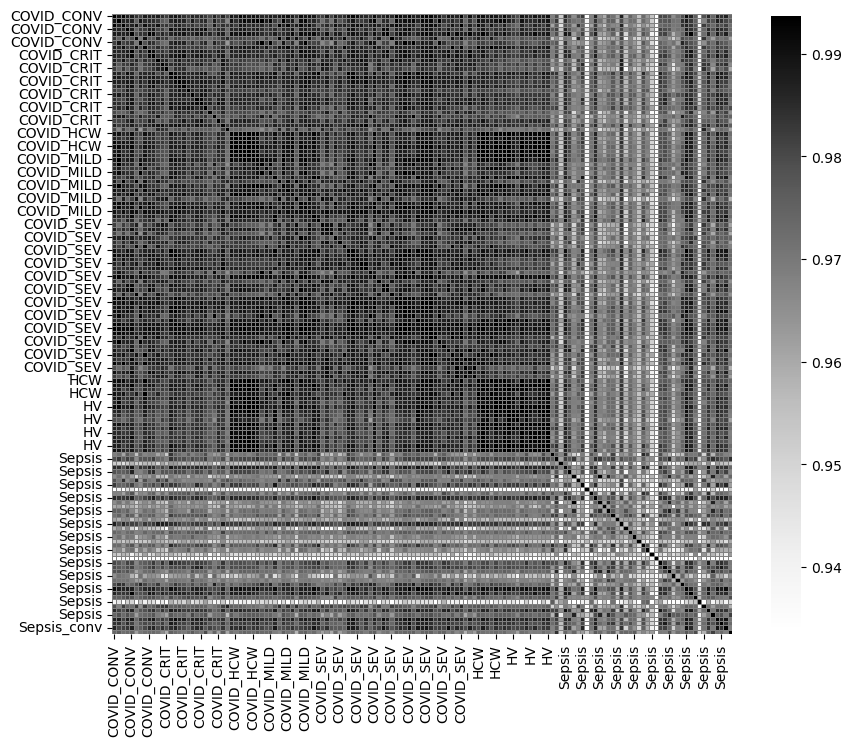

In [ ]:
# cyan
fig,ax=plt.subplots(figsize=(10,10))
sb.heatmap(bulkRNA_disease_clusters_corr["cyan"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})

Text(0.5, 1.0, 'Disease-Disease Correlation between Patients Based on bulkRNA Modality and the grey Module')

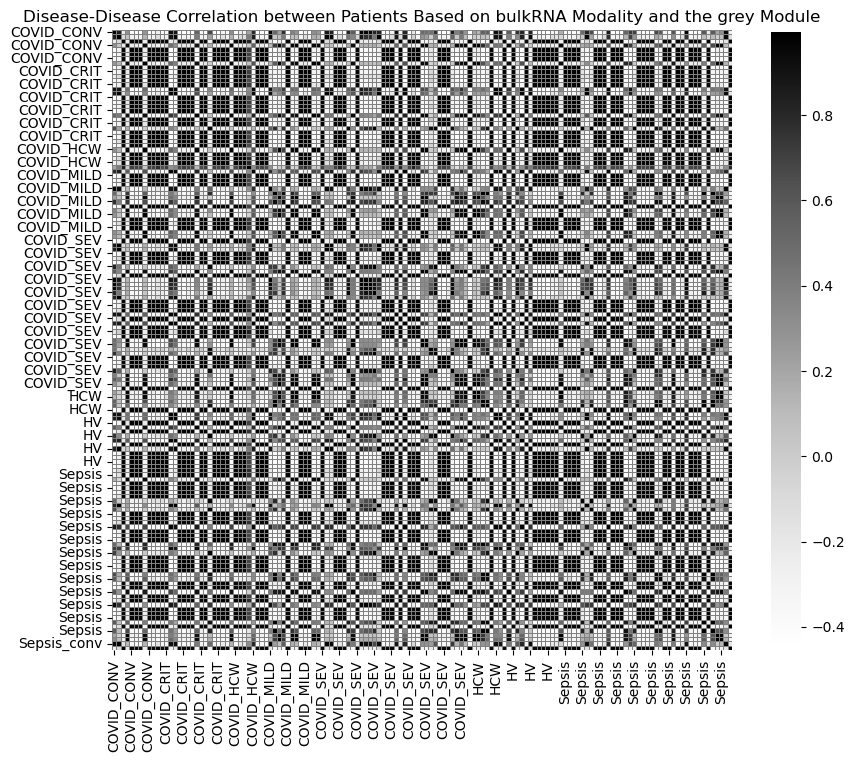

In [ ]:
# noise
fig,ax=plt.subplots(figsize=(10,10))
sb.heatmap(bulkRNA_disease_clusters_corr["grey"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Disease-Disease Correlation between Patients Based on bulkRNA Modality and the grey Module")

#### Densities

In [ ]:
# grey
Sepsis_HV = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['Sepsis_&_HV'].to_numpy().flatten()
COVID_MILD_COVID_CONV = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['COVID_MILD_&_COVID_CONV'].to_numpy().flatten()
Sepsis_COVID_SEV = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['Sepsis_&_COVID_SEV'].to_numpy().flatten()
HV_COVID_SEV = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['HV_&_COVID_SEV'].to_numpy().flatten()
HCW_COVID_HCW = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['HCW_&_COVID_HCW'].to_numpy().flatten()
HCW_COVID_CRIT = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['HCW_&_COVID_CRIT'].to_numpy().flatten()
Sepsis_conv_HV = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['Sepsis_conv_&_HV'].to_numpy().flatten()
COVID_SEV_COVID_CRIT = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['COVID_SEV_&_COVID_CRIT'].to_numpy().flatten()
HV_COVID_HCW = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['HV_&_COVID_HCW'].to_numpy().flatten()
Sepsis_conv_COVID_CRIT = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['Sepsis_conv_&_COVID_CRIT'].to_numpy().flatten()
COVID_CRIT_COVID_CONV = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['COVID_CRIT_&_COVID_CONV'].to_numpy().flatten()
COVID_MILD_COVID_CRIT = bulkRNA_disease_clusters_corr["grey"]["inter_diseases"]['COVID_MILD_&_COVID_CRIT'].to_numpy().flatten()

Sepsis_conv = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['Sepsis_conv'].to_numpy().flatten()
Sepsis = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['Sepsis'].to_numpy().flatten()
HV = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['HV'].to_numpy().flatten()
HCW = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['HCW'].to_numpy().flatten()
COVID_MILD = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['COVID_MILD'].to_numpy().flatten()
COVID_CONV = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['COVID_CONV'].to_numpy().flatten()
COVID_SEV = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['COVID_SEV'].to_numpy().flatten()
COVID_HCW = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['COVID_HCW'].to_numpy().flatten()
COVID_CRIT = bulkRNA_disease_clusters_corr["grey"]["intra_diseases"]['COVID_CRIT'].to_numpy().flatten()

<Axes: ylabel='Density'>

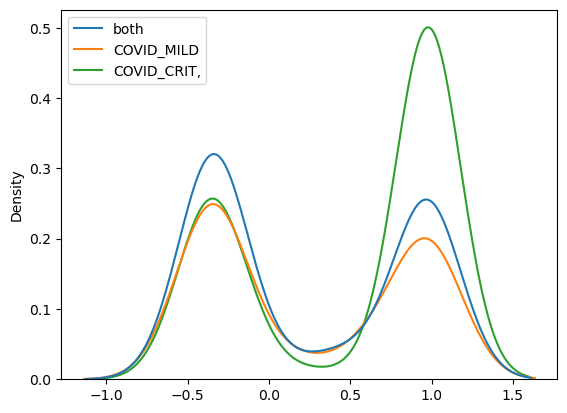

In [ ]:
sb.kdeplot(data = {"both":  COVID_MILD_COVID_CRIT, "COVID_MILD": COVID_MILD, "COVID_CRIT,": COVID_CRIT,})

<Axes: ylabel='Density'>

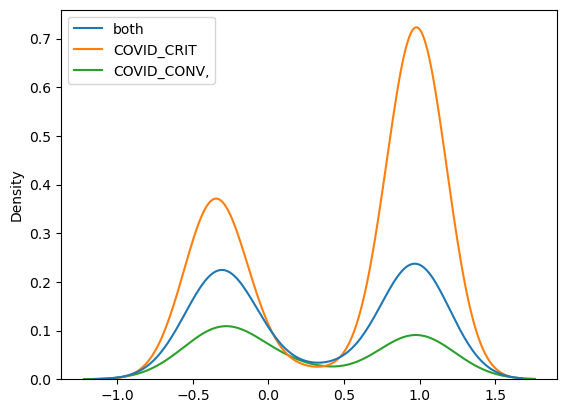

In [ ]:
sb.kdeplot(data = {"both":  COVID_CRIT_COVID_CONV, "COVID_CRIT": COVID_CRIT, "COVID_CONV,": COVID_CONV,})

<Axes: ylabel='Density'>

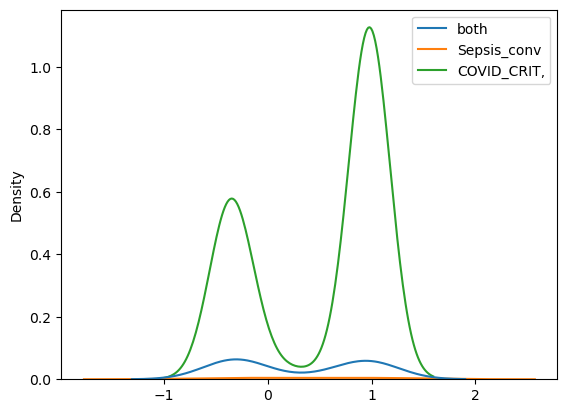

In [ ]:
sb.kdeplot(data = {"both":  Sepsis_conv_COVID_CRIT, "Sepsis_conv": Sepsis_conv, "COVID_CRIT,": COVID_CRIT,})

<Axes: ylabel='Density'>

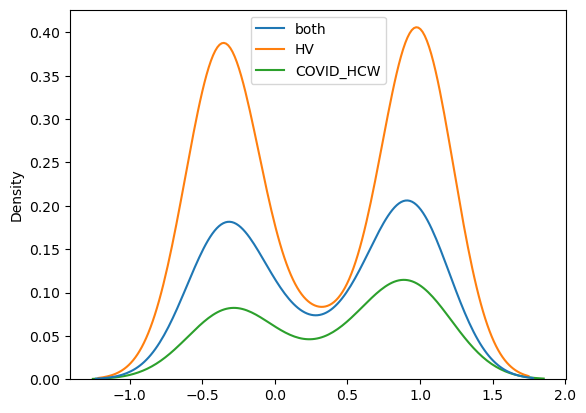

In [ ]:
sb.kdeplot(data = {"both":  HV_COVID_HCW, "HV": HV, "COVID_HCW": COVID_HCW})

<Axes: ylabel='Density'>

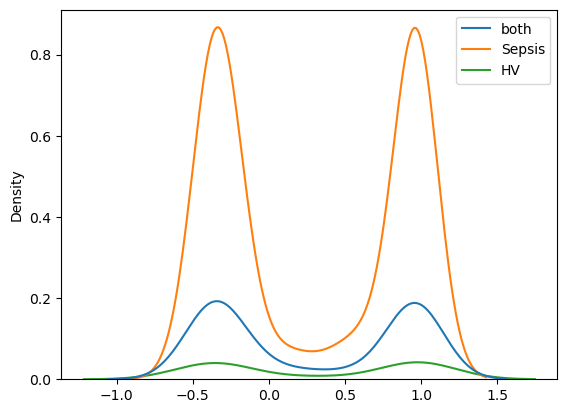

In [ ]:
sb.kdeplot(data = {"both": Sepsis_HV, "Sepsis": Sepsis, "HV": HV})

In [ ]:
# cyan 
Sepsis_HV = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['Sepsis_&_HV'].to_numpy().flatten()
COVID_MILD_COVID_CONV = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['COVID_MILD_&_COVID_CONV'].to_numpy().flatten()
Sepsis_COVID_SEV = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['Sepsis_&_COVID_SEV'].to_numpy().flatten()
HV_COVID_SEV = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['HV_&_COVID_SEV'].to_numpy().flatten()
HCW_COVID_HCW = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['HCW_&_COVID_HCW'].to_numpy().flatten()
HCW_COVID_CRIT = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['HCW_&_COVID_CRIT'].to_numpy().flatten()
Sepsis_conv_HV = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['Sepsis_conv_&_HV'].to_numpy().flatten()
COVID_SEV_COVID_CRIT = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['COVID_SEV_&_COVID_CRIT'].to_numpy().flatten()
HV_COVID_HCW = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['HV_&_COVID_HCW'].to_numpy().flatten()
Sepsis_conv_COVID_CRIT = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['Sepsis_conv_&_COVID_CRIT'].to_numpy().flatten()
COVID_CRIT_COVID_CONV = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['COVID_CRIT_&_COVID_CONV'].to_numpy().flatten()
COVID_MILD_COVID_CRIT = bulkRNA_disease_clusters_corr["cyan"]["inter_diseases"]['COVID_MILD_&_COVID_CRIT'].to_numpy().flatten()

Sepsis_conv = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['Sepsis_conv'].to_numpy().flatten()
Sepsis = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['Sepsis'].to_numpy().flatten()
HV = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['HV'].to_numpy().flatten()
HCW = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['HCW'].to_numpy().flatten()
COVID_MILD = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['COVID_MILD'].to_numpy().flatten()
COVID_CONV = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['COVID_CONV'].to_numpy().flatten()
COVID_SEV = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['COVID_SEV'].to_numpy().flatten()
COVID_HCW = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['COVID_HCW'].to_numpy().flatten()
COVID_CRIT = bulkRNA_disease_clusters_corr["cyan"]["intra_diseases"]['COVID_CRIT'].to_numpy().flatten()

<Axes: ylabel='Density'>

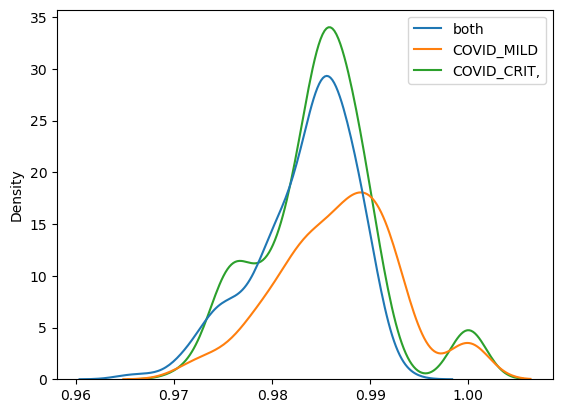

In [ ]:
sb.kdeplot(data = {"both":  COVID_MILD_COVID_CRIT, "COVID_MILD": COVID_MILD, "COVID_CRIT,": COVID_CRIT,})

<Axes: ylabel='Density'>

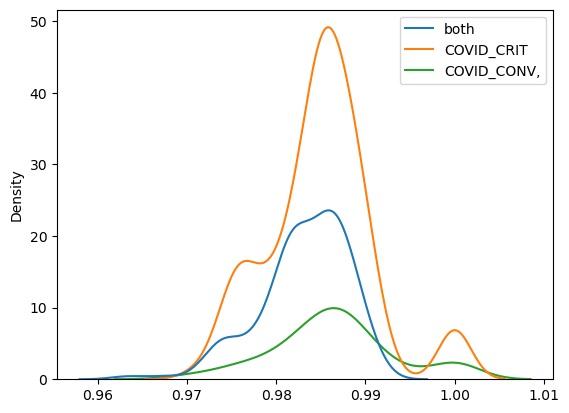

In [ ]:
sb.kdeplot(data = {"both":  COVID_CRIT_COVID_CONV, "COVID_CRIT": COVID_CRIT, "COVID_CONV,": COVID_CONV,})

<Axes: ylabel='Density'>

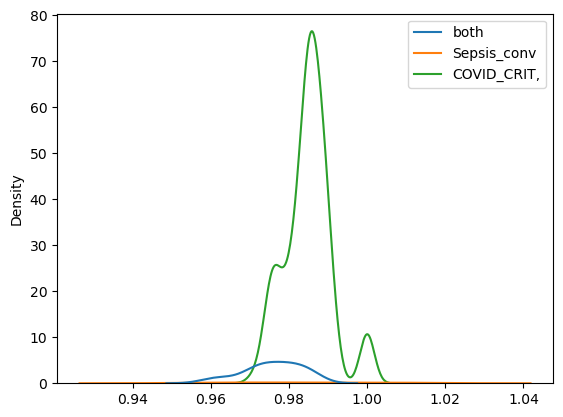

In [ ]:
sb.kdeplot(data = {"both":  Sepsis_conv_COVID_CRIT, "Sepsis_conv": Sepsis_conv, "COVID_CRIT,": COVID_CRIT,})

In [ ]:
# Black
Sepsis_HV = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['Sepsis_&_HV'].to_numpy().flatten()
COVID_MILD_COVID_CONV = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['COVID_MILD_&_COVID_CONV'].to_numpy().flatten()
Sepsis_COVID_SEV = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['Sepsis_&_COVID_SEV'].to_numpy().flatten()
HV_COVID_SEV = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['HV_&_COVID_SEV'].to_numpy().flatten()
HCW_COVID_HCW = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['HCW_&_COVID_HCW'].to_numpy().flatten()
HCW_COVID_CRIT = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['HCW_&_COVID_CRIT'].to_numpy().flatten()
Sepsis_conv_HV = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['Sepsis_conv_&_HV'].to_numpy().flatten()
COVID_SEV_COVID_CRIT = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['COVID_SEV_&_COVID_CRIT'].to_numpy().flatten()
HV_COVID_HCW = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['HV_&_COVID_HCW'].to_numpy().flatten()
Sepsis_conv_COVID_CRIT = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['Sepsis_conv_&_COVID_CRIT'].to_numpy().flatten()
COVID_CRIT_COVID_CONV = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['COVID_CRIT_&_COVID_CONV'].to_numpy().flatten()
COVID_MILD_COVID_CRIT = bulkRNA_disease_clusters_corr["black"]["inter_diseases"]['COVID_MILD_&_COVID_CRIT'].to_numpy().flatten()

Sepsis_conv = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['Sepsis_conv'].to_numpy().flatten()
Sepsis = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['Sepsis'].to_numpy().flatten()
HV = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['HV'].to_numpy().flatten()
HCW = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['HCW'].to_numpy().flatten()
COVID_MILD = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['COVID_MILD'].to_numpy().flatten()
COVID_CONV = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['COVID_CONV'].to_numpy().flatten()
COVID_SEV = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['COVID_SEV'].to_numpy().flatten()
COVID_HCW = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['COVID_HCW'].to_numpy().flatten()
COVID_CRIT = bulkRNA_disease_clusters_corr["black"]["intra_diseases"]['COVID_CRIT'].to_numpy().flatten()

<Axes: ylabel='Density'>

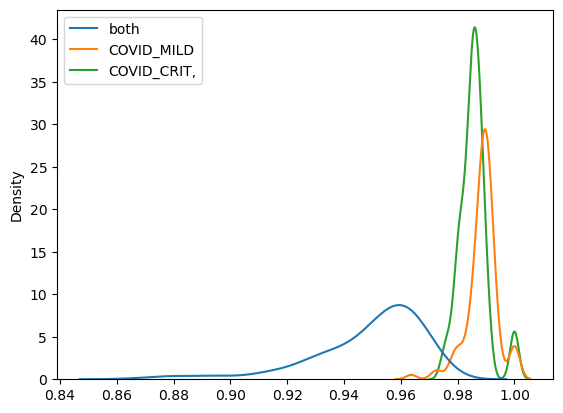

In [ ]:
sb.kdeplot(data = {"both":  COVID_MILD_COVID_CRIT, "COVID_MILD": COVID_MILD, "COVID_CRIT,": COVID_CRIT,})

<Axes: ylabel='Density'>

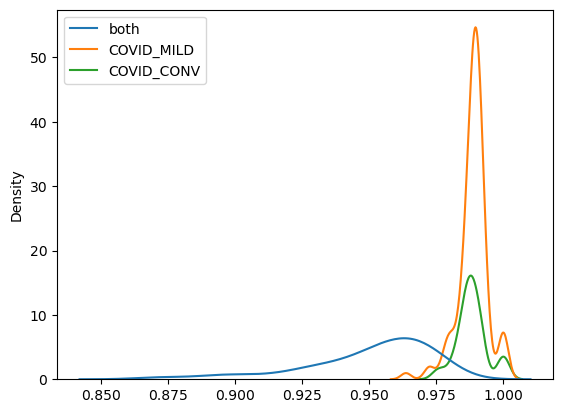

In [ ]:
sb.kdeplot(data = {"both": COVID_MILD_COVID_CONV, "COVID_MILD": COVID_MILD, "COVID_CONV": COVID_CONV})

<Axes: ylabel='Density'>

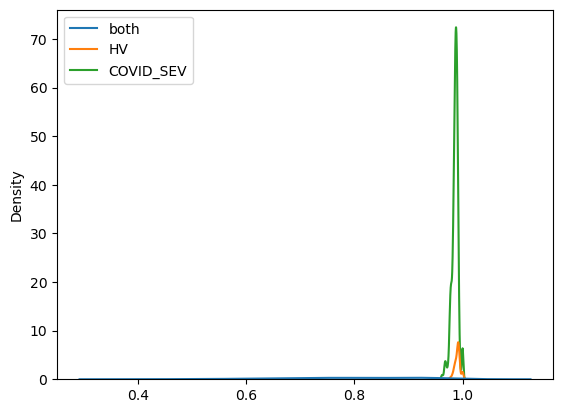

In [ ]:
sb.kdeplot(data = {"both": HV_COVID_SEV, "HV": HV, "COVID_SEV": COVID_SEV})

<Axes: ylabel='Density'>

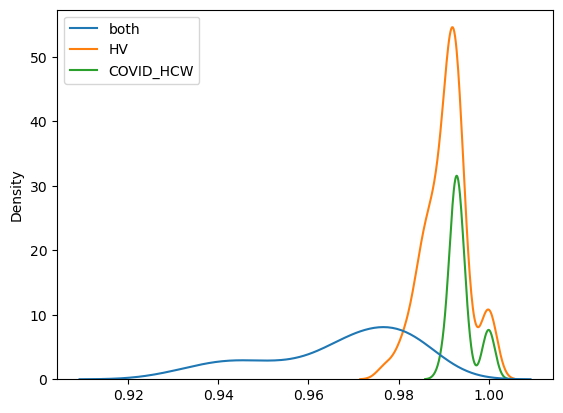

In [ ]:
sb.kdeplot(data = {"both":  HV_COVID_HCW, "HV": HV, "COVID_HCW": COVID_HCW})

### Luminex

#### Heatmaps

Text(0.5, 80.5815972222222, 'Patients')

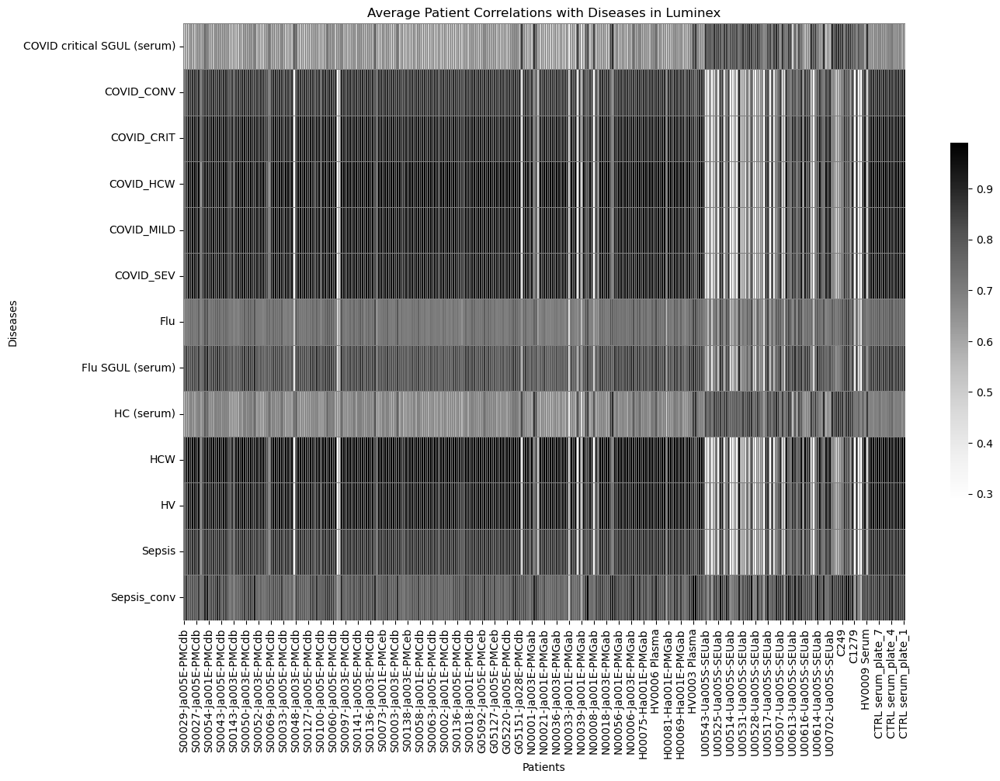

In [ ]:
fig,ax=plt.subplots(figsize=(15,10))
sb.heatmap(corr_p_d_luminex.transpose().groupby(corr_p_d_luminex.transpose().index).mean(), cmap ='Greys',  robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in Luminex")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 248.08159722222211, 'Diseases')

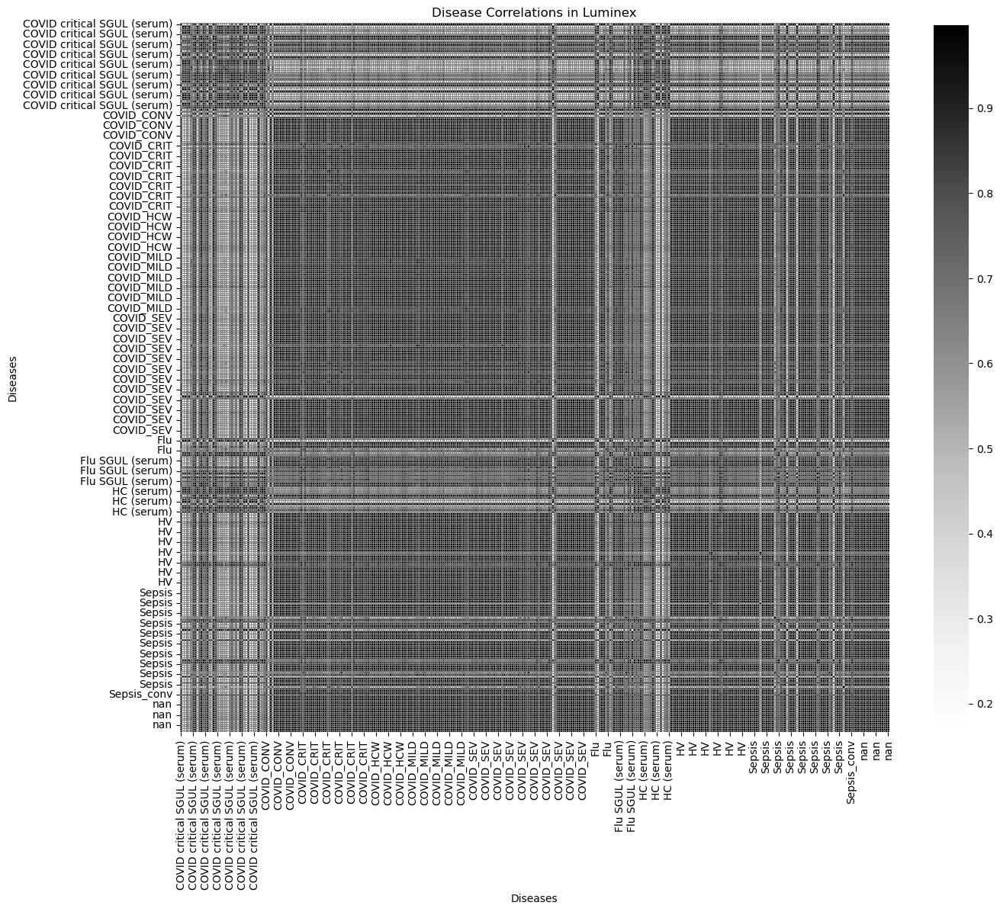

In [ ]:
fig,ax=plt.subplots(figsize=(15,15))
sb.heatmap(corr_d_luminex, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Disease Correlations in Luminex")
plt.ylabel("Diseases")
plt.xlabel("Diseases")

Text(0.5, 248.08159722222211, 'Patients')

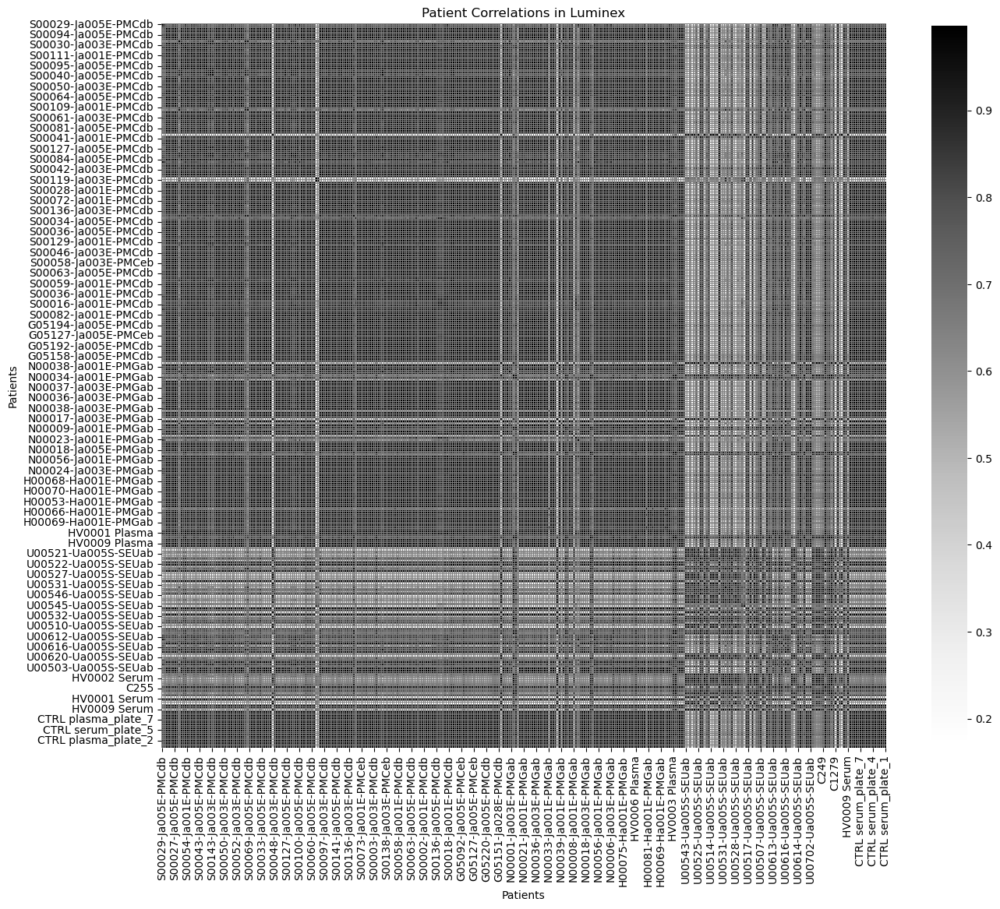

In [ ]:
fig,ax=plt.subplots(figsize=(15,15))
sb.heatmap(corr_p_luminex, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Patient Correlations in Luminex")
plt.ylabel("Patients")
plt.xlabel("Patients")

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Patient-Disease Correlations in Luminex with \n Two-Way Hierachical Clustering')

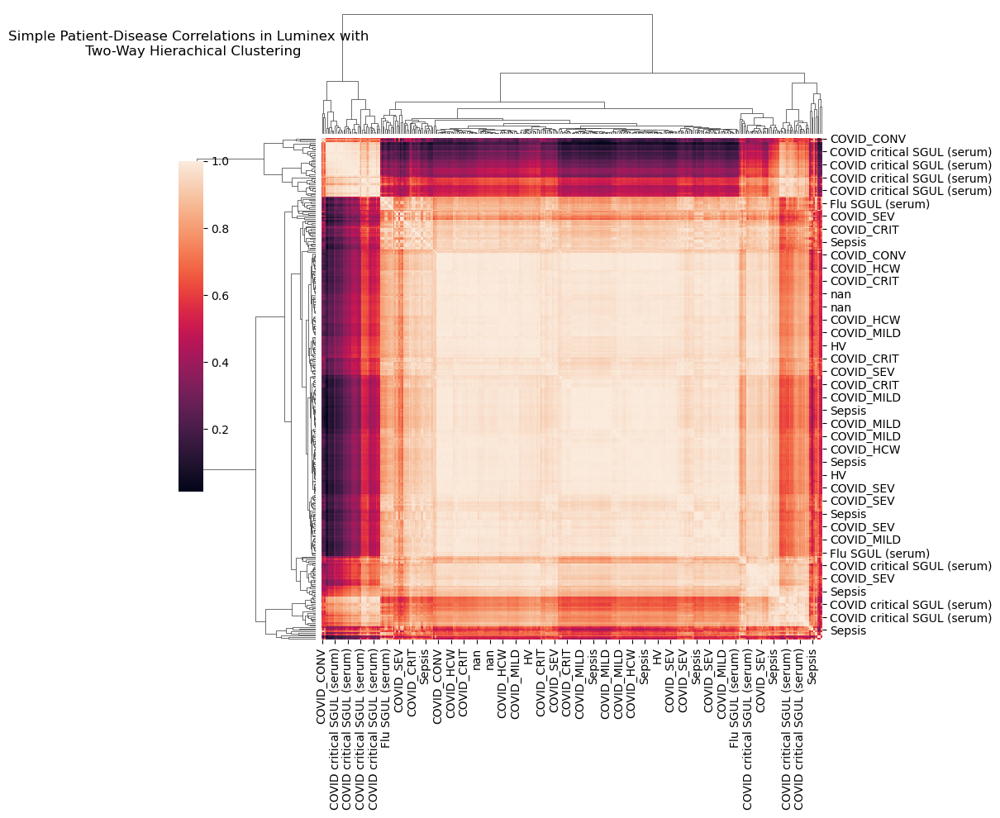

In [ ]:
sb.clustermap(corr_d_luminex, cbar_pos=(0, .4, .03, .4))
plt.title("Simple Patient-Disease Correlations in Luminex with \n Two-Way Hierachical Clustering", y = 1.3)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 734.4444444444445, 'Patients')

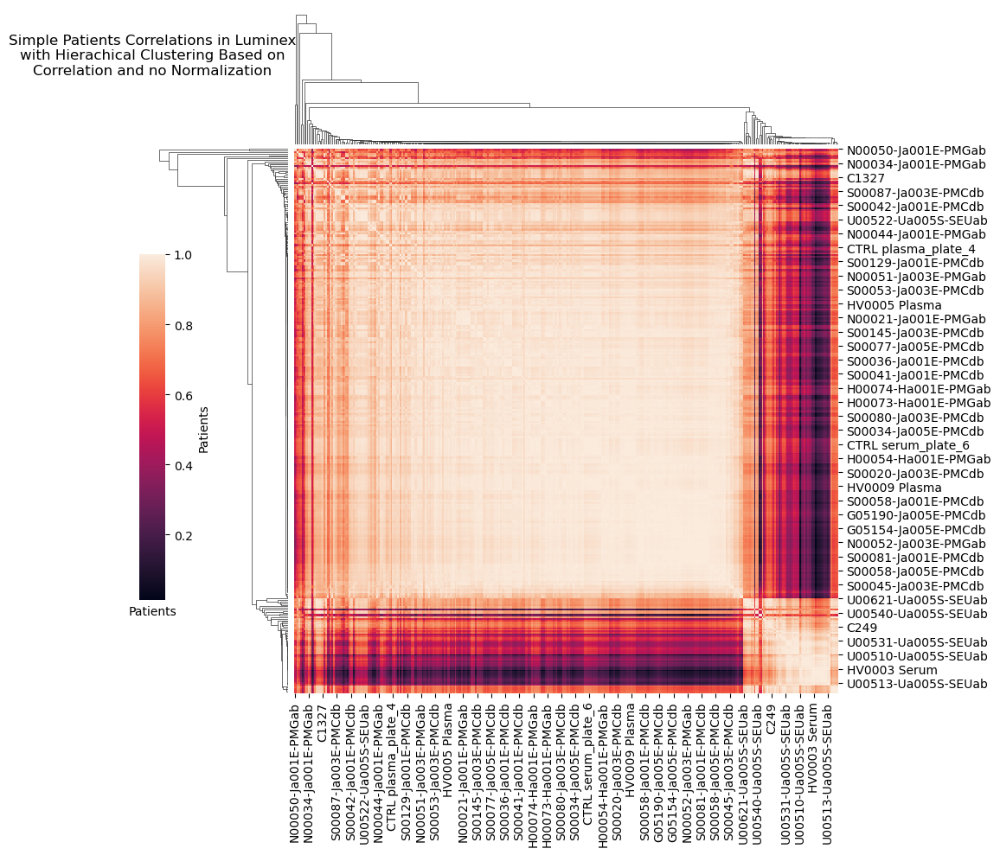

In [ ]:
sb.clustermap(corr_p_luminex, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Patients Correlations in Luminex" + "\n" + "with Hierachical Clustering Based on" + "\n" + "Correlation and no Normalization", y = 1.5)
plt.ylabel("Patients")
plt.xlabel("Patients")

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 734.4444444444445, 'Patients')

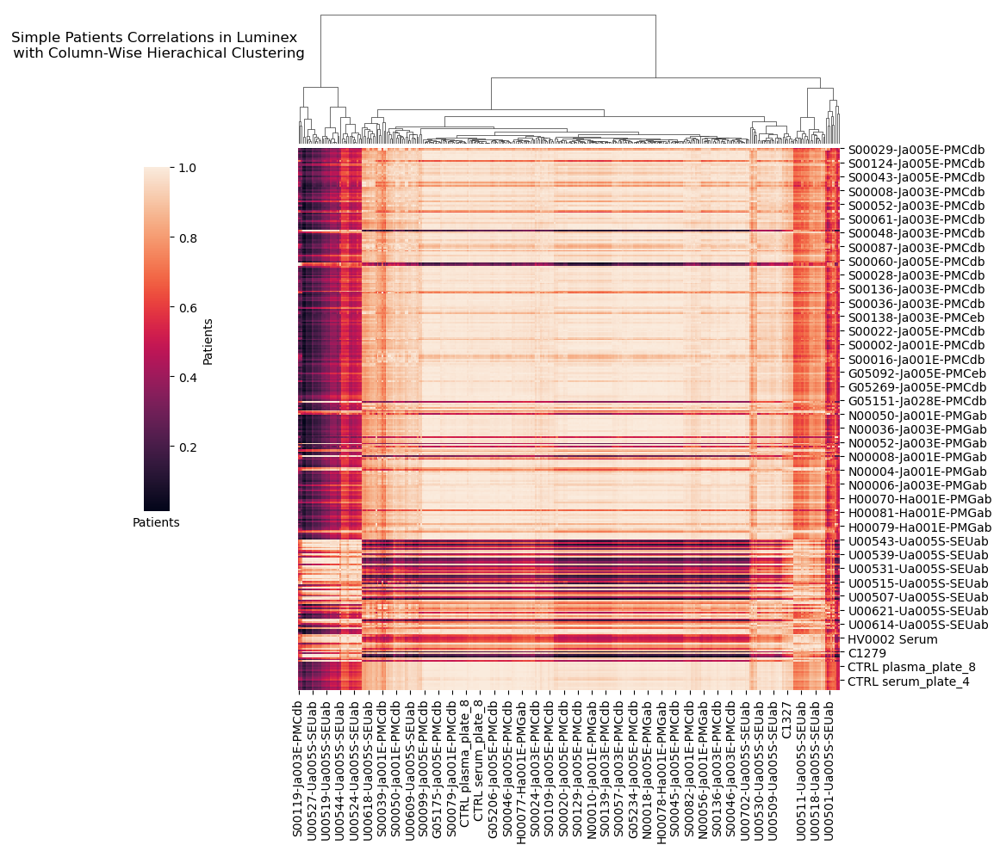

In [ ]:
sb.clustermap(corr_p_luminex, cbar_pos=(0, .4, .03, .4), row_cluster=False,)
plt.title("Simple Patients Correlations in Luminex \n with Column-Wise Hierachical Clustering" , y = 1.3)
plt.ylabel("Patients")
plt.xlabel("Patients")

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Patients Correlations in Luminex with \n Two-Way Hierachical Clustering')

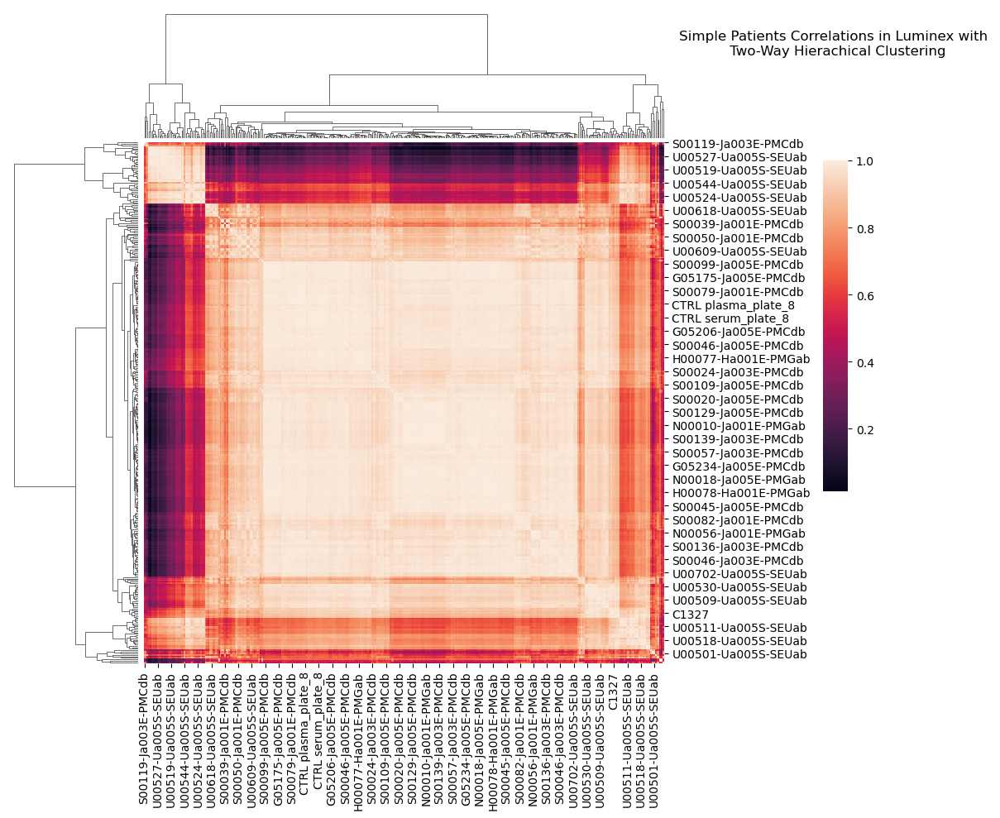

In [ ]:
sb.clustermap(corr_p_luminex, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Patients Correlations in Luminex with \n Two-Way Hierachical Clustering", y = 1.3)


### CyTOF

#### Heatmaps

In [ ]:
diseases = list(cytof_disease_clusters_corr[list(cytof_disease_clusters_corr.keys())[0]]["all"].index.unique())
for i in range(1, len(list(cytof_disease_clusters_corr.keys()))):
    key = list(cytof_disease_clusters_corr.keys())[i]
    diseases = diseases + list((cytof_disease_clusters_corr[key]["all"].index.unique()))
diseases = list(set(diseases))

disease_pairs = list(cytof_disease_clusters_corr[list(cytof_disease_clusters_corr.keys())[0]]["inter_diseases"].keys())
for i in range(1, len(list(cytof_disease_clusters_corr.keys()))):
    key = list(cytof_disease_clusters_corr.keys())[i]
    disease_pairs = disease_pairs + list((cytof_disease_clusters_corr[key]["inter_diseases"].keys()))
disease_pairs = list(set(disease_pairs))

Text(0.5, 86.2299145299145, 'Cell Types')

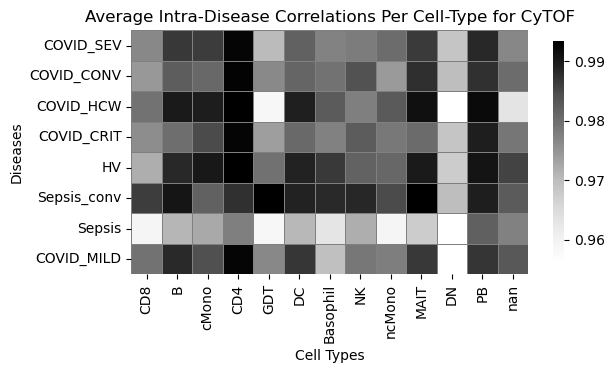

In [ ]:
# All Cell Types and Diseases: Average Correlation between Patients of the Same Disease
cell_type_intra_disease_avg = {ct:[0] * len(diseases) for ct in cytof_disease_clusters_corr.keys() }

for ct in cytof_disease_clusters_corr.keys():
    for i, disease in enumerate(diseases):
        cell_type_intra_disease_avg[ct][i] = cytof_disease_clusters_corr[ct]["intra_diseases"][disease].mean().mean()
        
df = pd.DataFrame(data =cell_type_intra_disease_avg, index = diseases)

sb.heatmap(df, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Intra-Disease Correlations Per Cell-Type for CyTOF")

plt.ylabel("Diseases")
plt.xlabel("Cell Types")


Text(0.5, 1.5, 'Simple Disease-Cell-Type Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization')

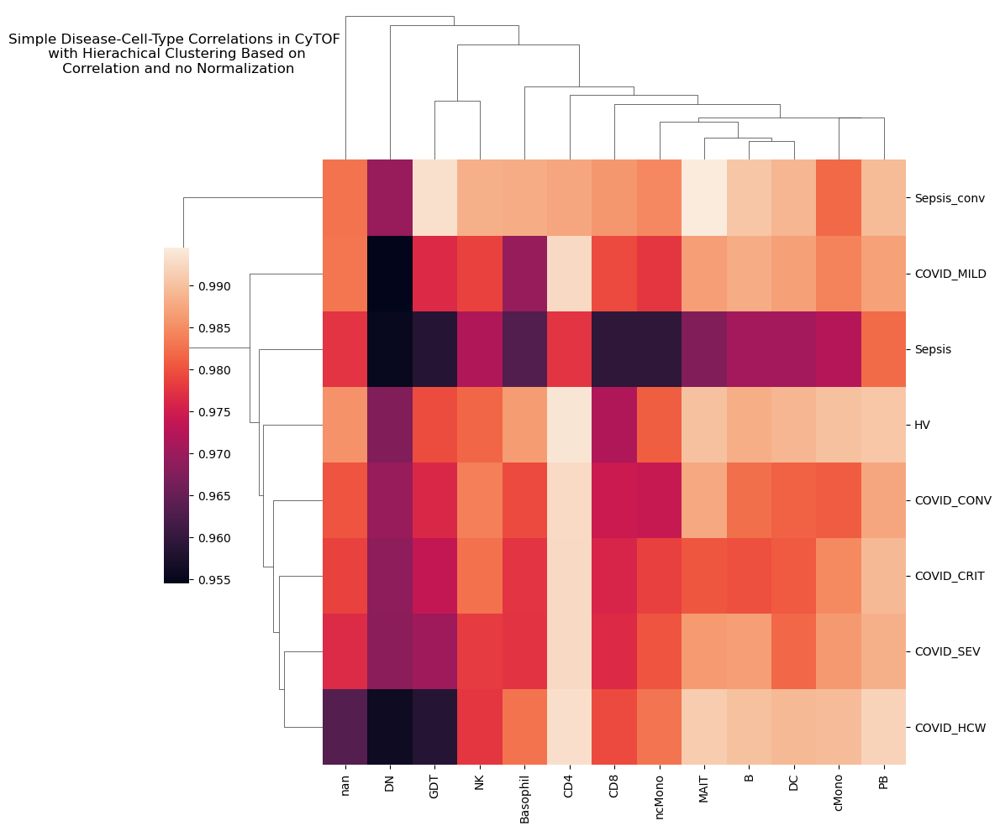

In [ ]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)

Text(0.5, 1.3, 'Simple Disease-Cell-Type Correlations \n in CyTOF with \n Two-Way Hierachical Clustering')

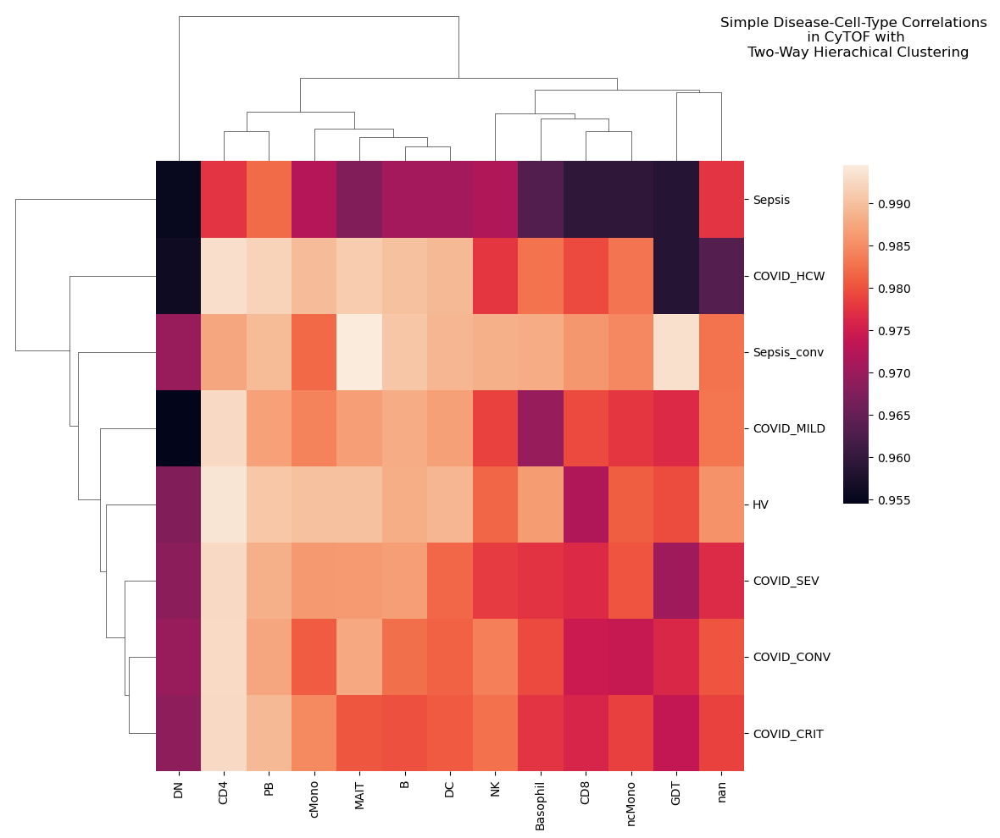

In [ ]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations \n in CyTOF with \n Two-Way Hierachical Clustering", y = 1.3)

Text(0.5, 23.52222222222222, 'Cell Types')

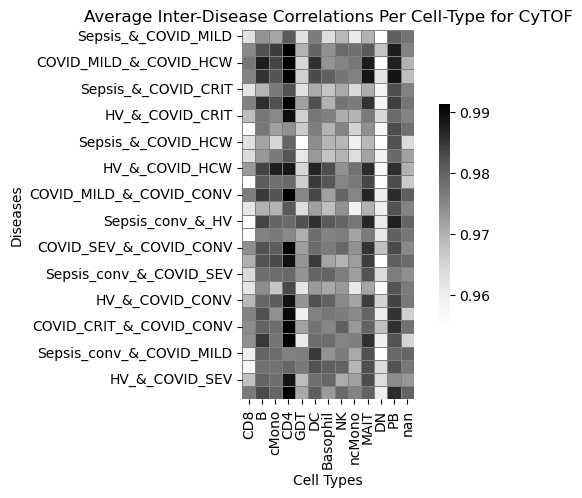

In [ ]:
# Avergae Correlation of the Patients of two different diseases
cell_type_inter_disease_avg = {ct:[0] * len(disease_pairs) for ct in cytof_disease_clusters_corr.keys() }

for ct in cytof_disease_clusters_corr.keys():
    for i, pair in enumerate(disease_pairs):
        cell_type_inter_disease_avg[ct][i] = cytof_disease_clusters_corr[ct]["inter_diseases"][pair].mean().mean()
        
df = pd.DataFrame(data =cell_type_inter_disease_avg, index = disease_pairs)

sb.heatmap(df, cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey", cbar_kws={"shrink": 0.6})
plt.title("Average Inter-Disease Correlations Per Cell-Type for CyTOF")
plt.ylabel("Diseases")
plt.xlabel("Cell Types")

Text(0.5, 1.5, 'Simple Disease-Cell-Type Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization')

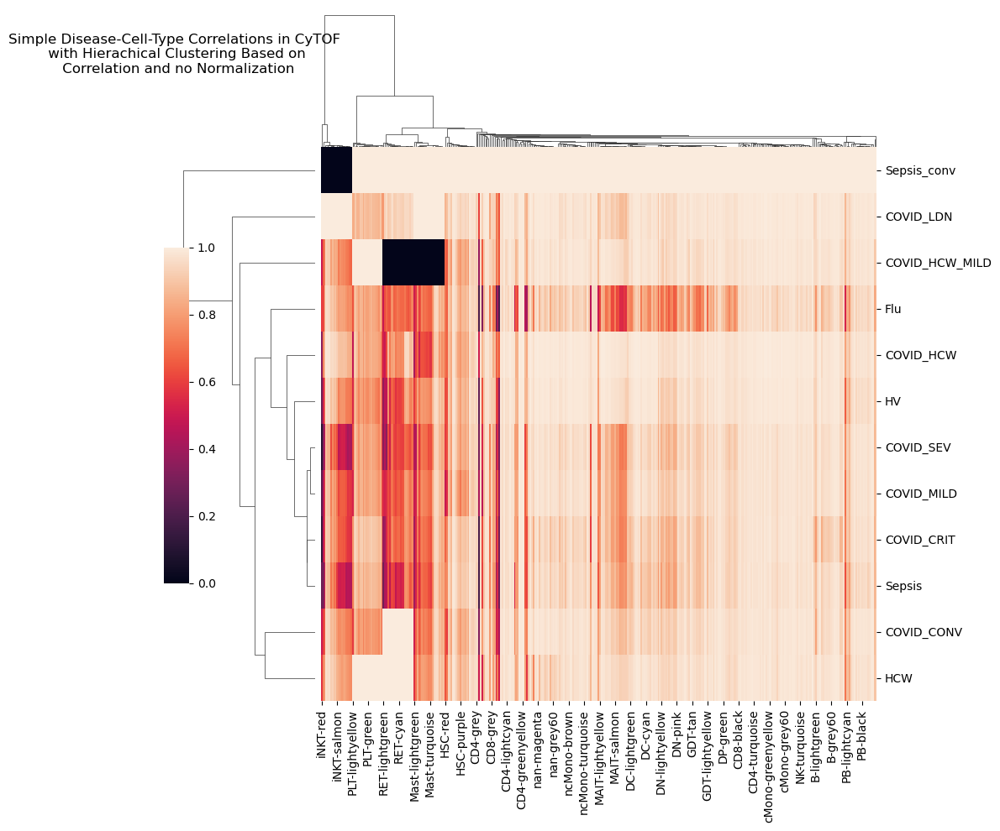

In [ ]:
sb.clustermap(df, metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization", y = 1.5)


Text(0.5, 1.3, 'Simple Disease-Cell-Type Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering')

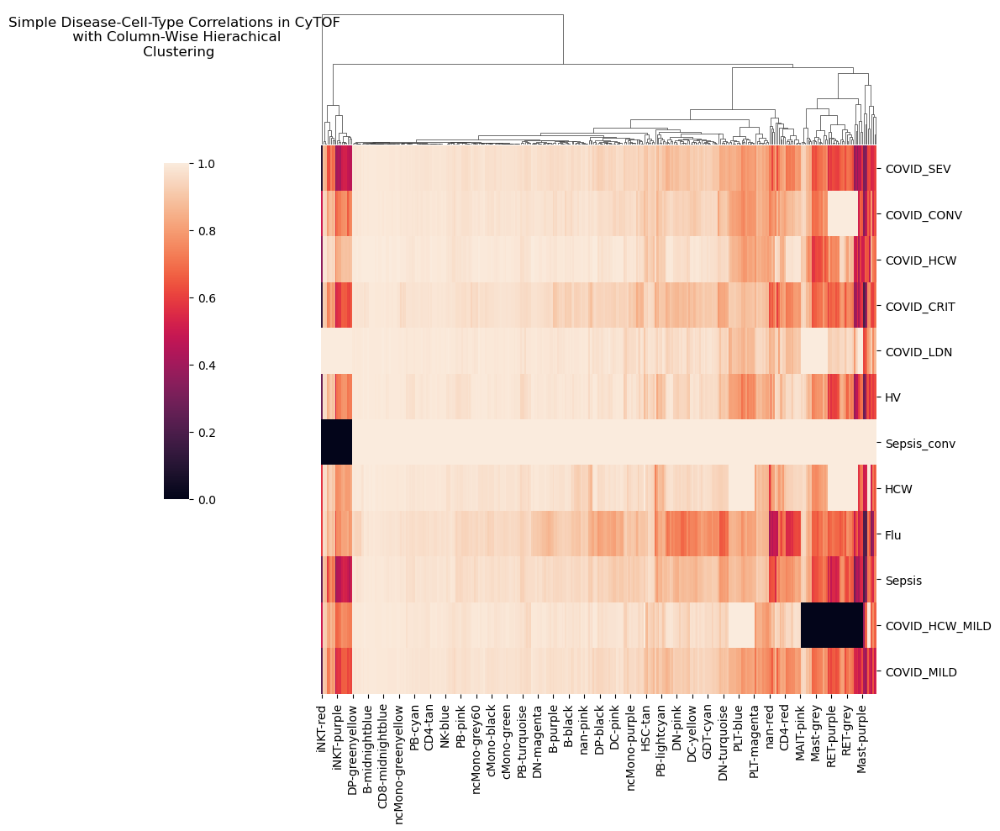

In [ ]:
sb.clustermap(df, cbar_pos=(0, .4, .03, .4), row_cluster=False,)
plt.title("Simple Disease-Cell-Type Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering" , y = 1.3)


Text(0.5, 1.3, 'Simple Disease-Cell-Type Correlations \n in CyTOF with \n Two-Way Hierachical Clustering')

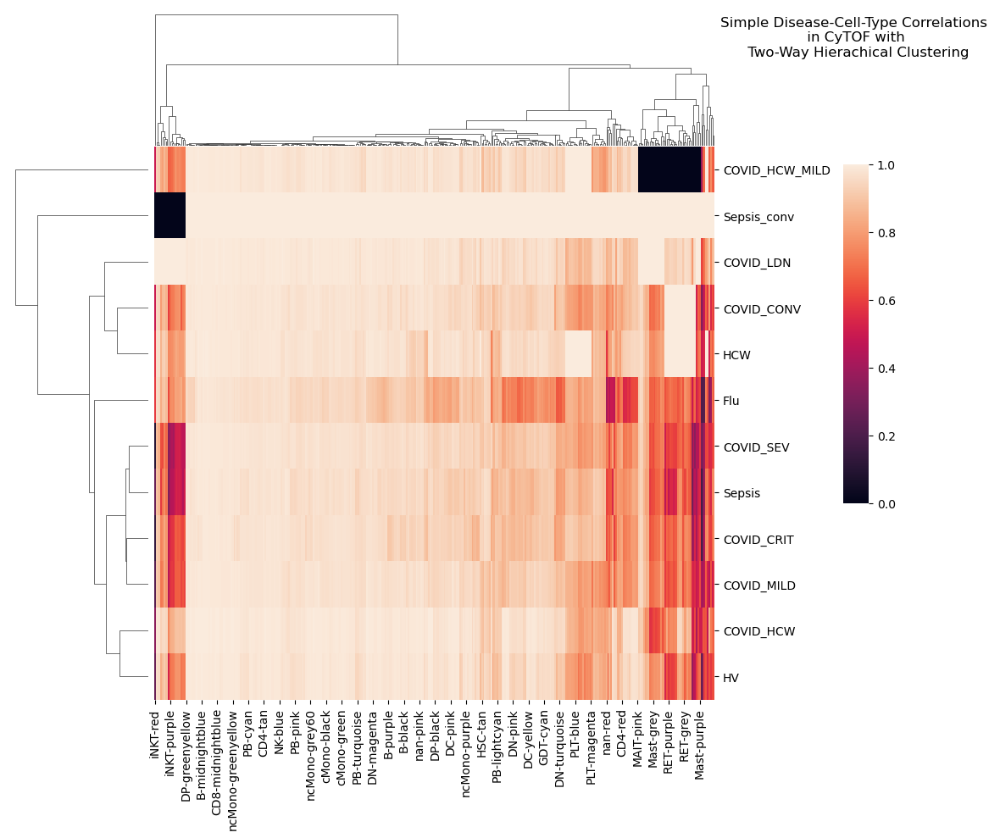

In [ ]:
sb.clustermap(df, cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease-Cell-Type Correlations \n in CyTOF with \n Two-Way Hierachical Clustering", y = 1.3)

##### CD8

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations \n in CyTOF with \n Two-Way Hierachical Clustering for CD8')

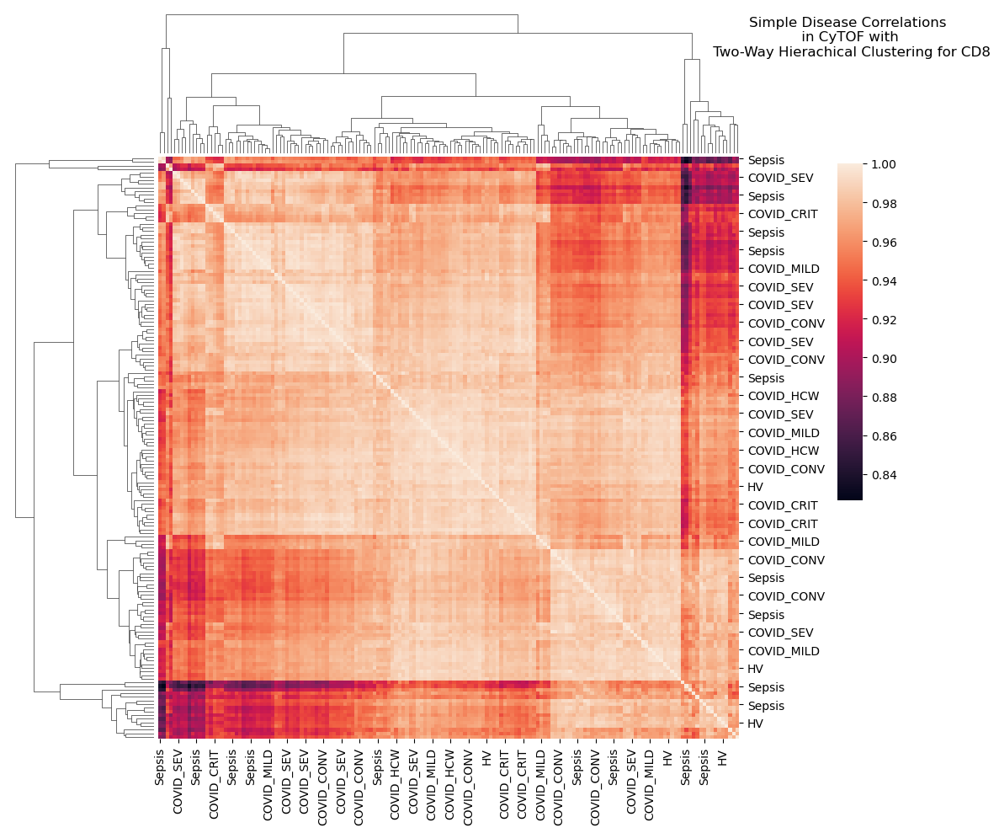

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["CD8"]["all"], cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease Correlations \n in CyTOF with \n Two-Way Hierachical Clustering for CD8", y = 1.3)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering for CD8')

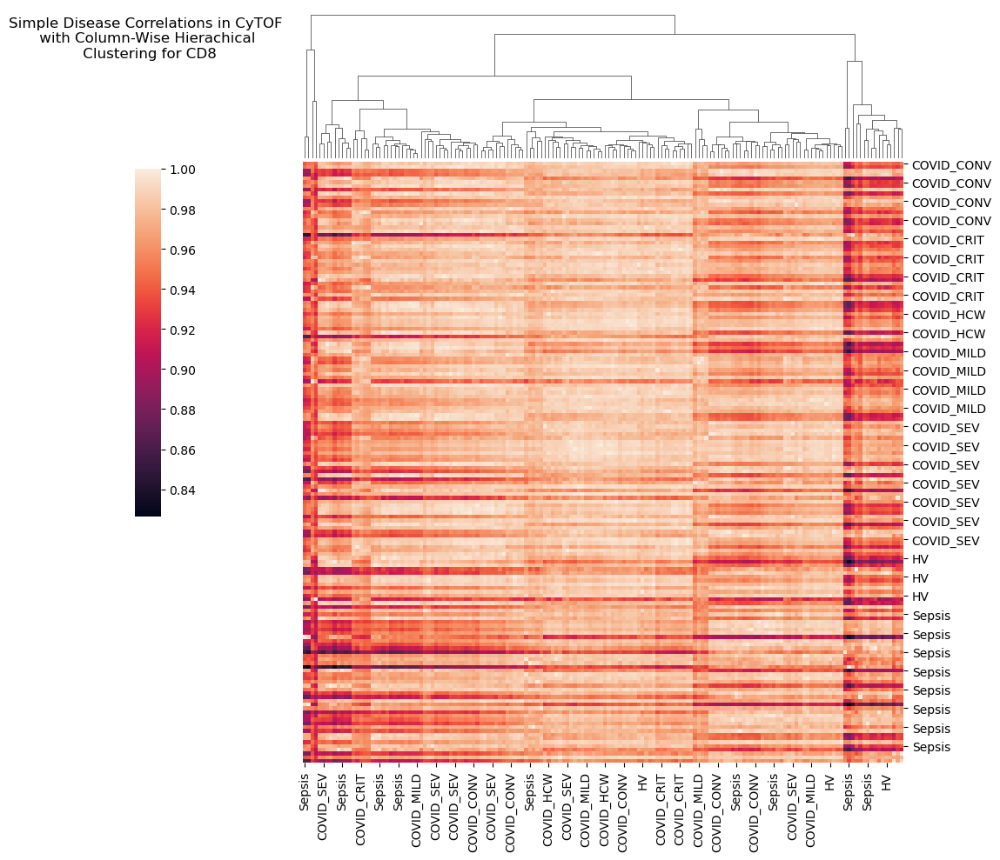

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["CD8"]["all"], cbar_pos=(0, .4, .03, .4), row_cluster=False,)
plt.title("Simple Disease Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering for CD8" , y = 1.3)


/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.5, 'Simple Disease Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization for CD8')

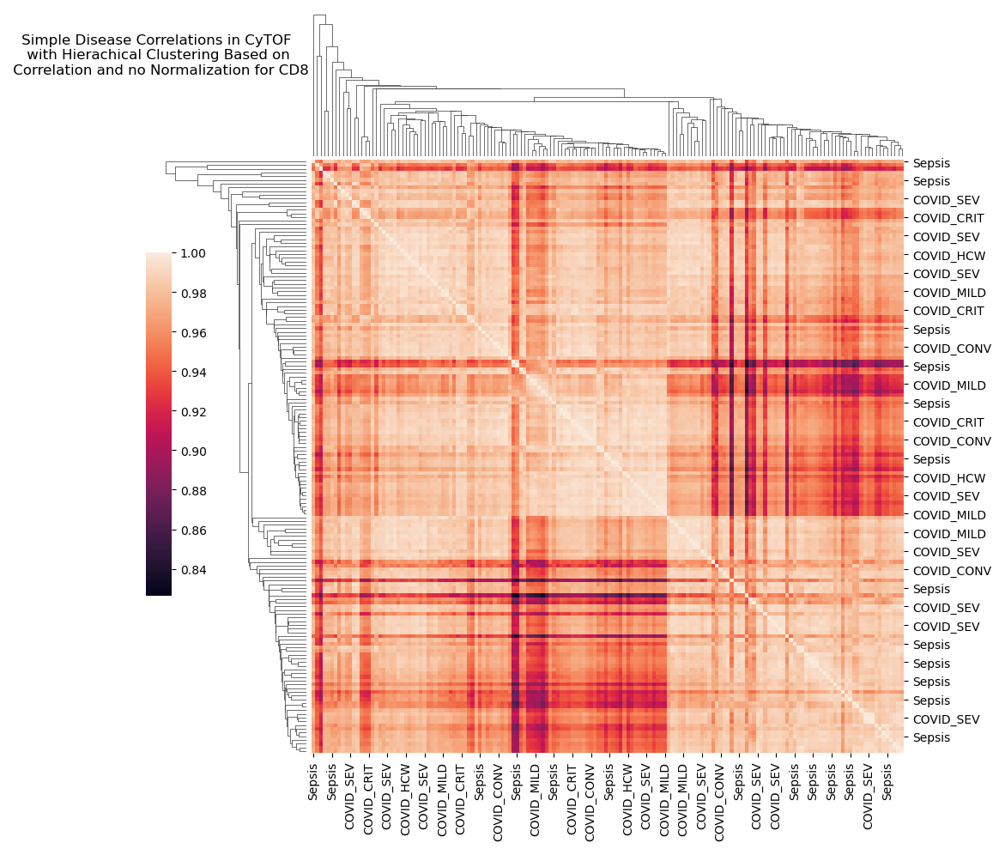

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["CD8"]["all"], metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization for CD8", y = 1.5)

In [70]:
corr_p_d_cytof["CD8"].sort_index(inplace = True)
corr_p_d_cytof["CD8"]

,COVID_CONV,COVID_CONV,COVID_CONV,COVID_CONV,COVID_CONV,COVID_CONV,COVID_CONV,COVID_CONV,COVID_CONV,COVID_CONV,...,Sepsis,Sepsis,Sepsis,Sepsis,Sepsis,Sepsis,Sepsis,Sepsis_conv,Sepsis_conv,Sepsis_conv
G05064-Ja005E-CYCa,0.976947,0.989229,0.933966,0.934380,0.985432,0.981212,0.991002,0.926616,0.994258,0.964363,...,0.952657,0.930567,0.980992,0.983560,0.949502,0.977704,0.975461,0.910301,0.964098,0.902119
G05073-Ja005E-CYCa,0.992834,0.989261,0.979845,0.981648,0.964266,0.985491,0.984793,0.975960,0.982373,0.993919,...,0.980444,0.978804,0.972472,0.972616,0.987090,0.979927,0.955581,0.962083,0.990661,0.957070
G05077-Ja005E-CYCa,0.994409,0.988866,0.979907,0.980362,0.964260,0.988729,0.984509,0.977370,0.982996,0.994618,...,0.984804,0.975267,0.977440,0.977347,0.988249,0.984918,0.960853,0.962116,0.992392,0.953432
G05078-Ja005E-CYCa,0.983080,0.995741,0.943039,0.943438,0.988553,0.988261,0.996191,0.941348,0.995443,0.975706,...,0.966014,0.939567,0.987222,0.984340,0.958303,0.979441,0.978789,0.922381,0.970088,0.913983
G05097-Ja005E-CYCa,0.949763,0.933060,0.985799,0.989861,0.895803,0.929332,0.927805,0.984923,0.920016,0.962880,...,0.950932,0.987354,0.913865,0.921092,0.981208,0.929697,0.893925,0.965496,0.973761,0.974330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
S00129-Ja001E-CYCa,0.985705,0.995594,0.950975,0.945668,0.990232,0.990783,0.996026,0.944789,0.995072,0.978202,...,0.969374,0.943439,0.989789,0.983668,0.961527,0.980549,0.981903,0.927365,0.970401,0.914756
S00129-Ja005E-CYCa,0.983880,0.993607,0.945350,0.945014,0.988298,0.988053,0.994734,0.938477,0.995212,0.974934,...,0.966820,0.938191,0.986407,0.982712,0.956720,0.982102,0.978802,0.921372,0.969147,0.908023
S00134-Ja003E-CYCa,0.996352,0.993412,0.968564,0.964790,0.971166,0.995086,0.988182,0.962803,0.986422,0.992045,...,0.979541,0.962093,0.981162,0.979069,0.980732,0.988210,0.963378,0.948038,0.983949,0.937808
S00142-Ja005E-CYCa,0.990808,0.990815,0.981003,0.978327,0.970362,0.991474,0.989054,0.978451,0.982809,0.992288,...,0.982453,0.974173,0.978116,0.977575,0.988126,0.981478,0.963609,0.962289,0.990416,0.955179


Text(0.5, 25.722222222222214, 'Patients')

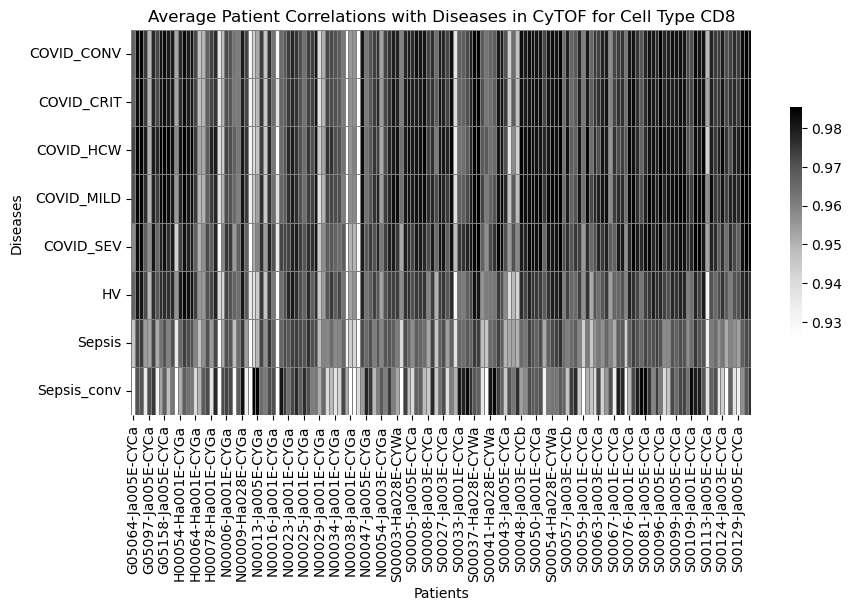

In [71]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["CD8"].transpose().groupby(corr_p_d_cytof["CD8"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type CD8")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type CD8 Disease Correlations in CyTOF')

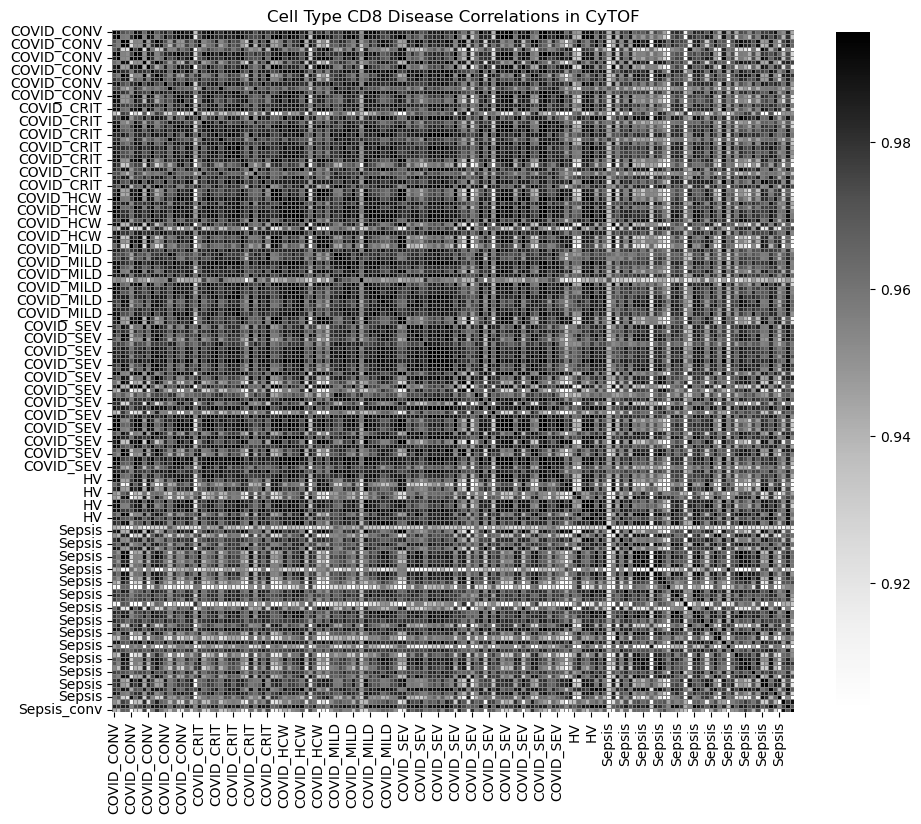

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["CD8"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type CD8 Disease Correlations in CyTOF")

Text(0.5, 1.0, 'Cell Type CD8 Patient Correlations in CyTOF')

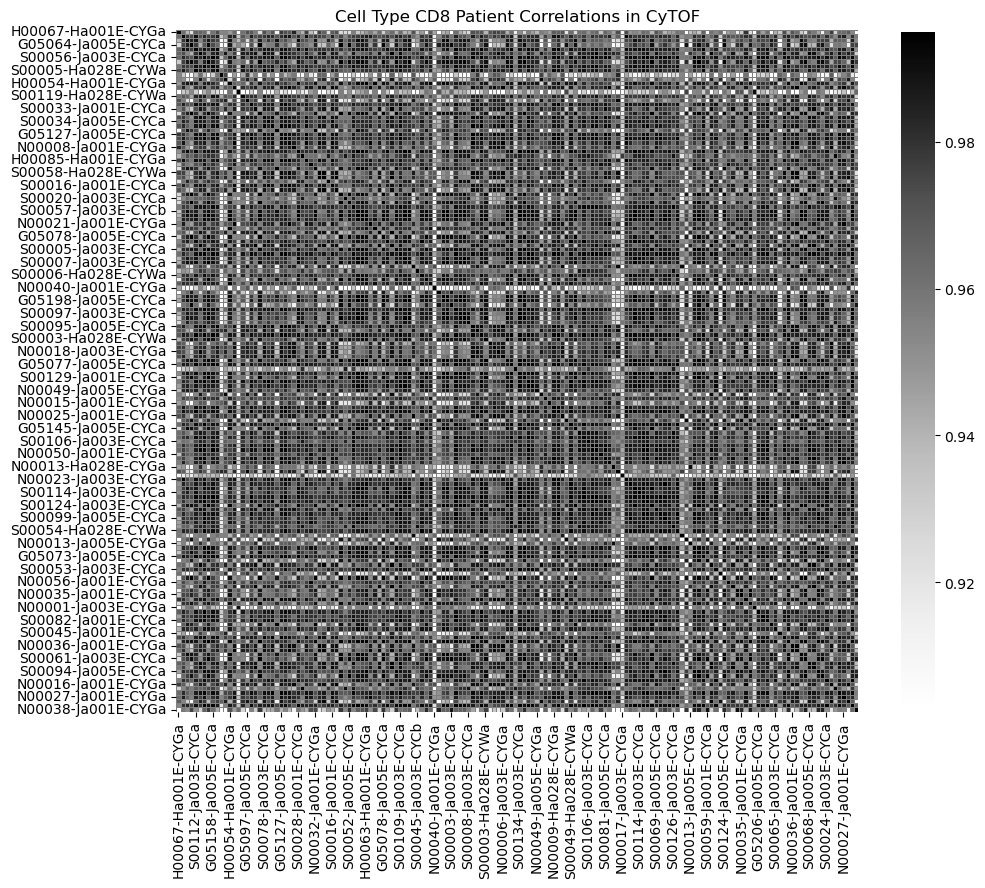

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(corr_p_cytof["CD8"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type CD8 Patient Correlations in CyTOF")

##### B

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.5, 'Simple Disease Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization for B')

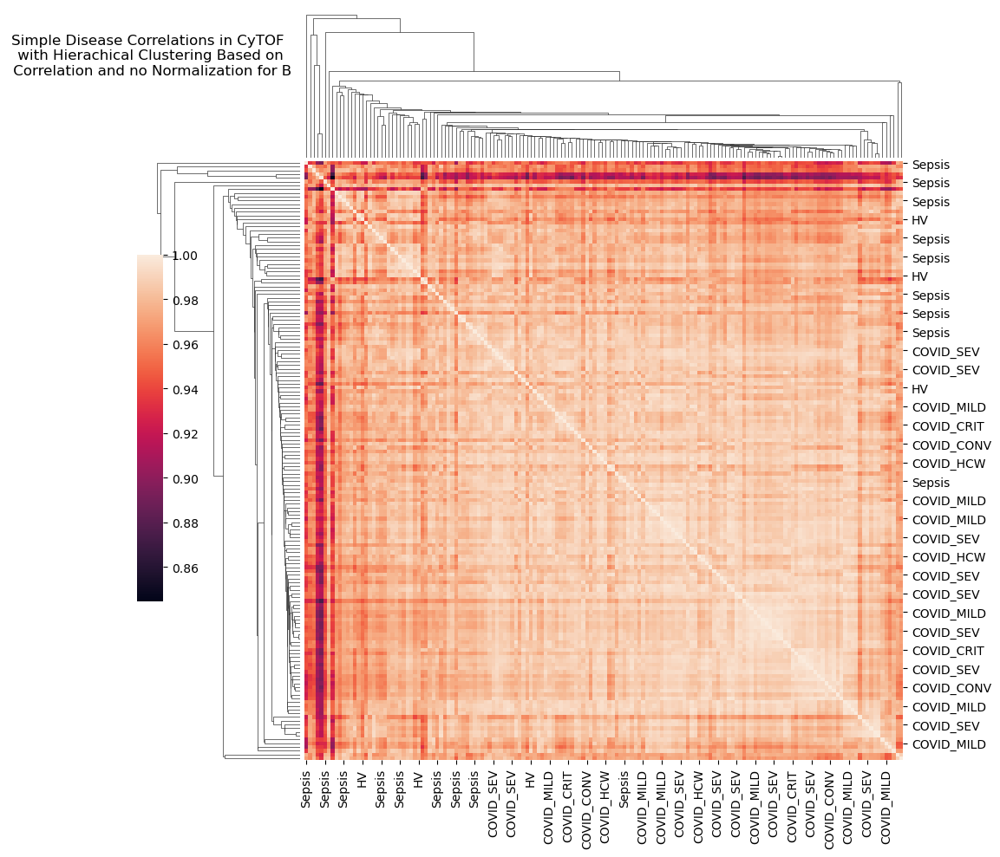

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["B"]["all"], metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization for B", y = 1.5)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering for B')

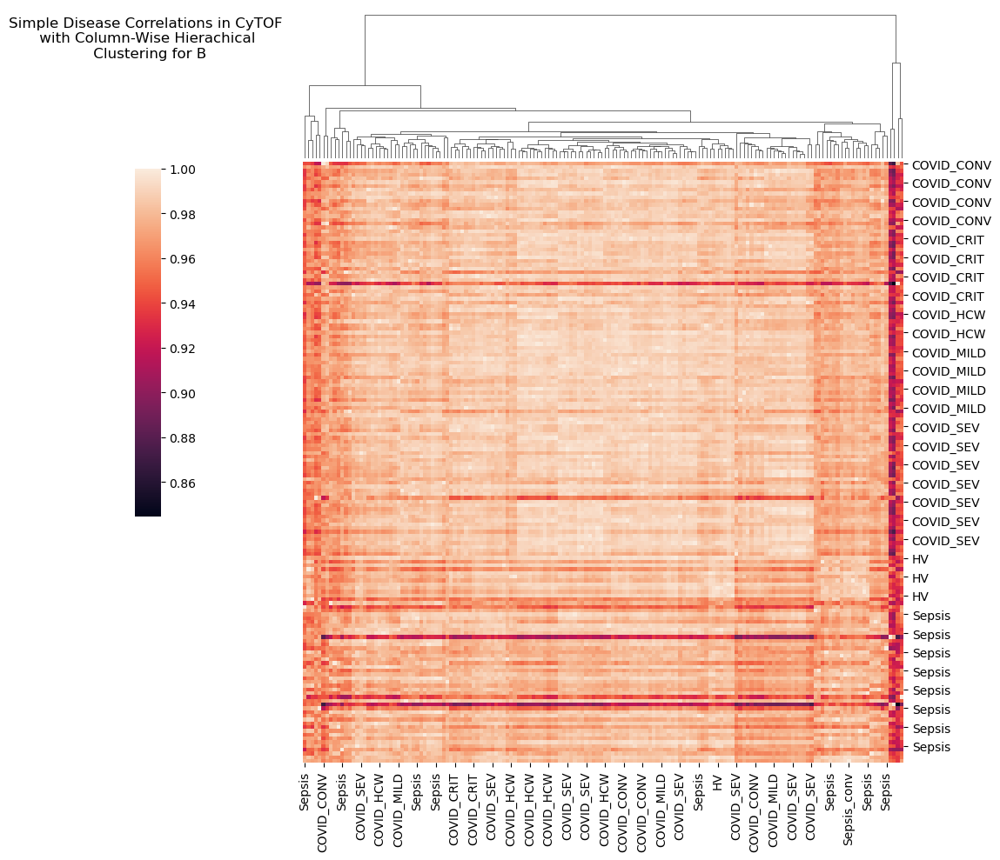

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["B"]["all"], cbar_pos=(0, .4, .03, .4), row_cluster=False,)
plt.title("Simple Disease Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering for B" , y = 1.3)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations \n in CyTOF with \n Two-Way Hierachical Clustering for B')

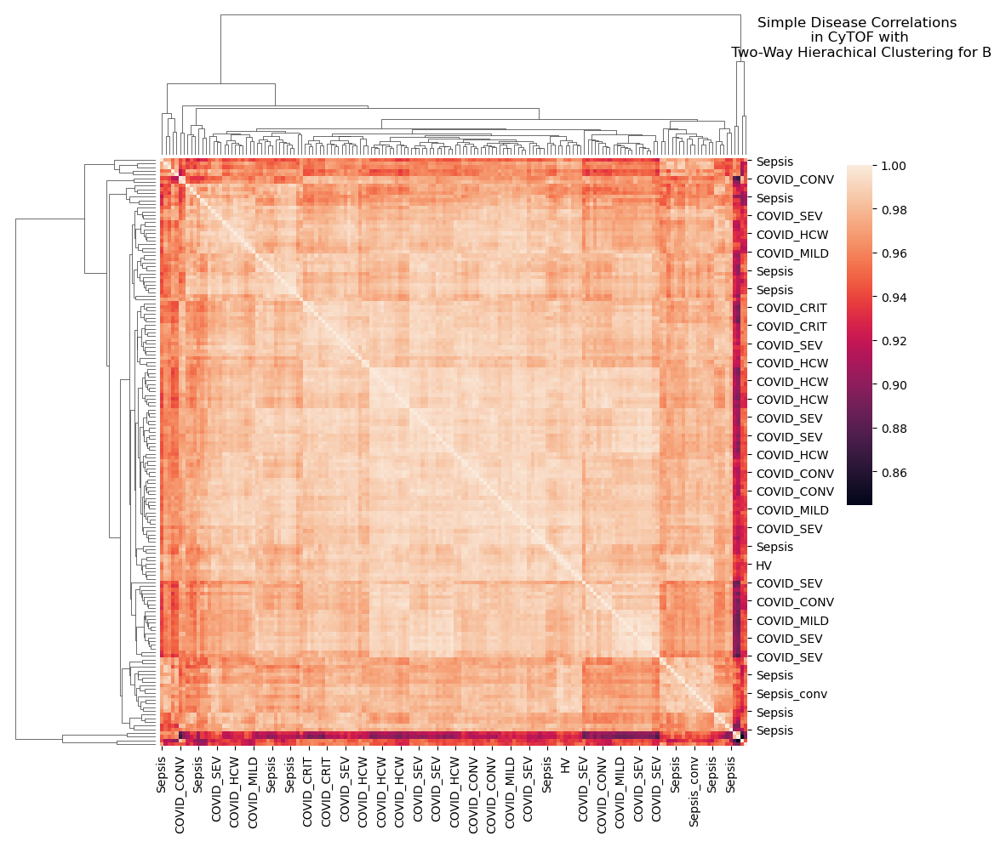

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["B"]["all"], cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease Correlations \n in CyTOF with \n Two-Way Hierachical Clustering for B", y = 1.3)

Text(0.5, 25.722222222222214, 'Patients')

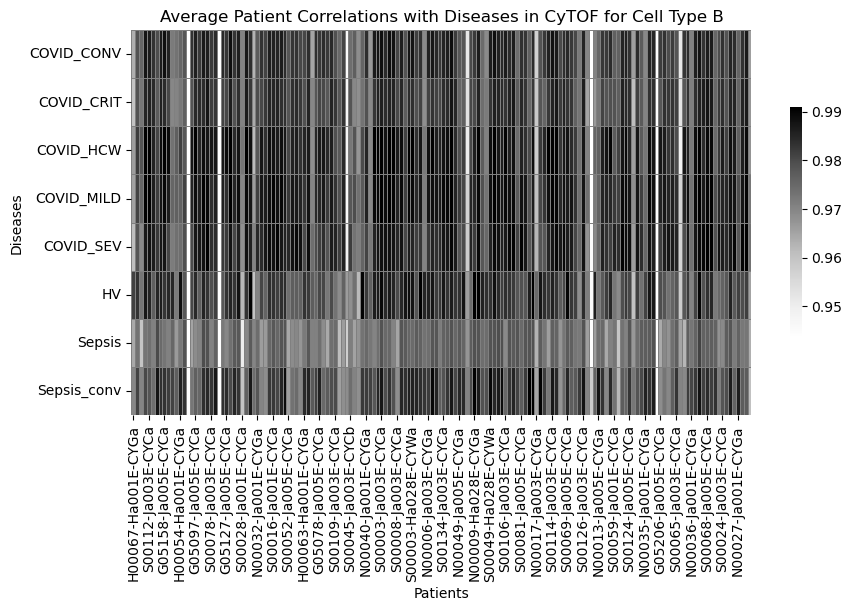

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["B"].transpose().groupby(corr_p_d_cytof["B"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type B")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type B Disease Correlations in CyTOF')

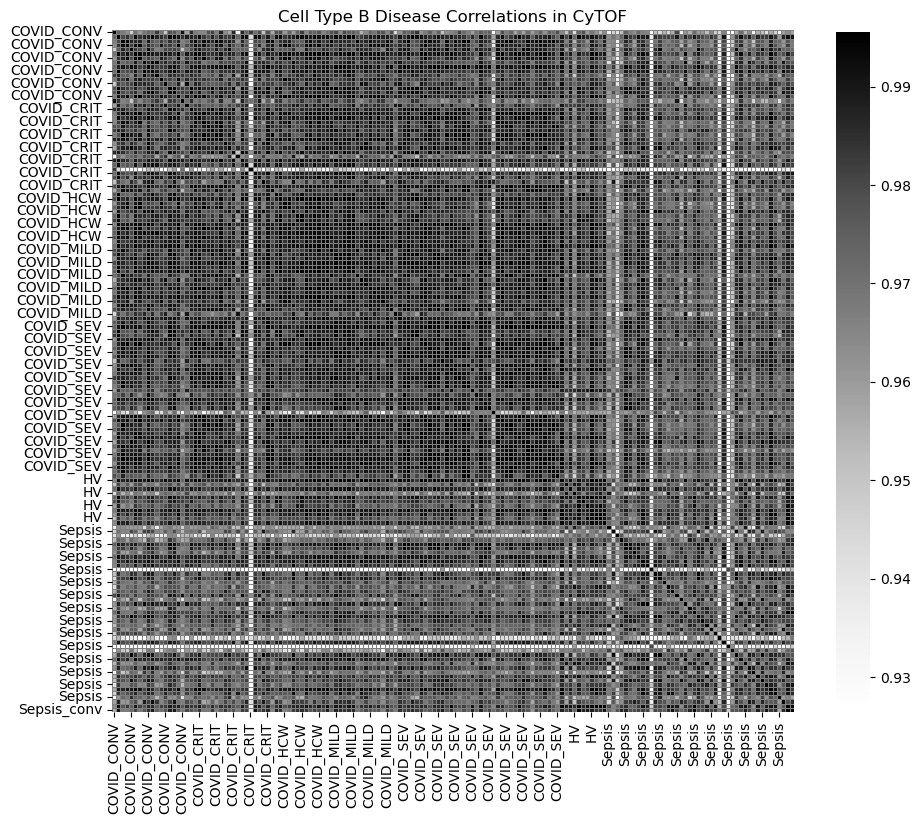

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["B"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type B Disease Correlations in CyTOF")

##### cMono

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.5, 'Simple Disease Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization for cMono')

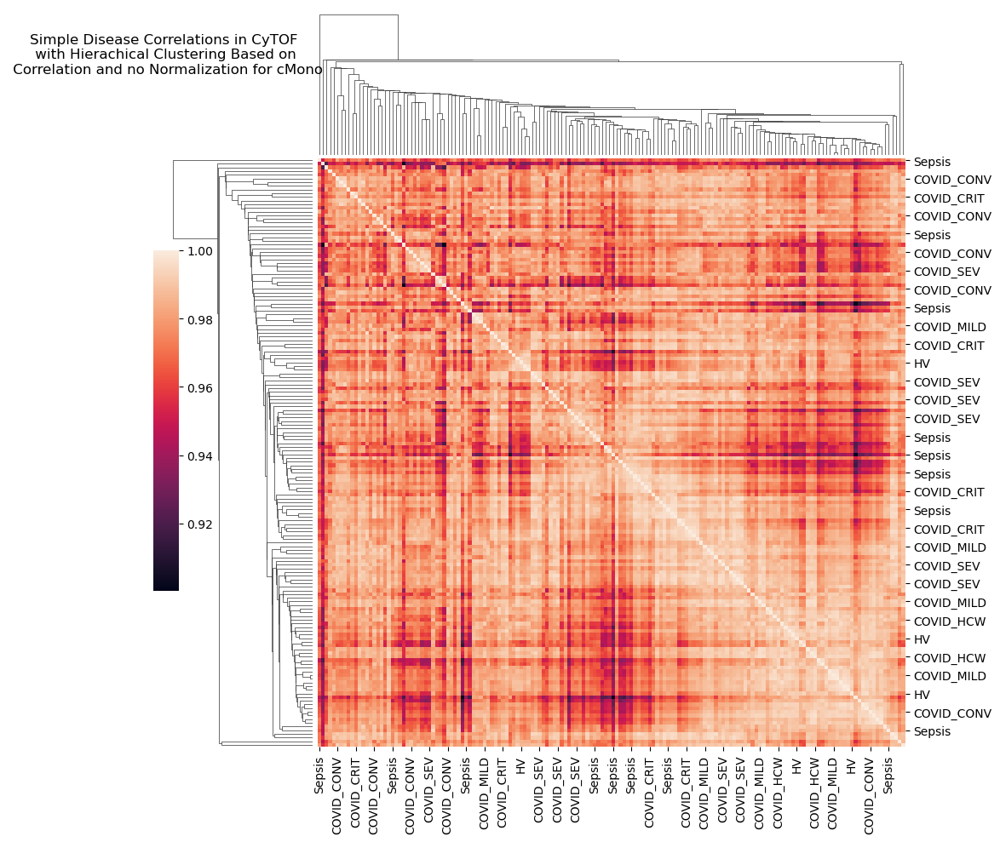

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["cMono"]["all"], metric="correlation", method="single", cbar_pos=(0, .3, .03, .4))
plt.title("Simple Disease Correlations in CyTOF \n with Hierachical Clustering Based on \n Correlation and no Normalization for cMono", y = 1.5)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering for cMono')

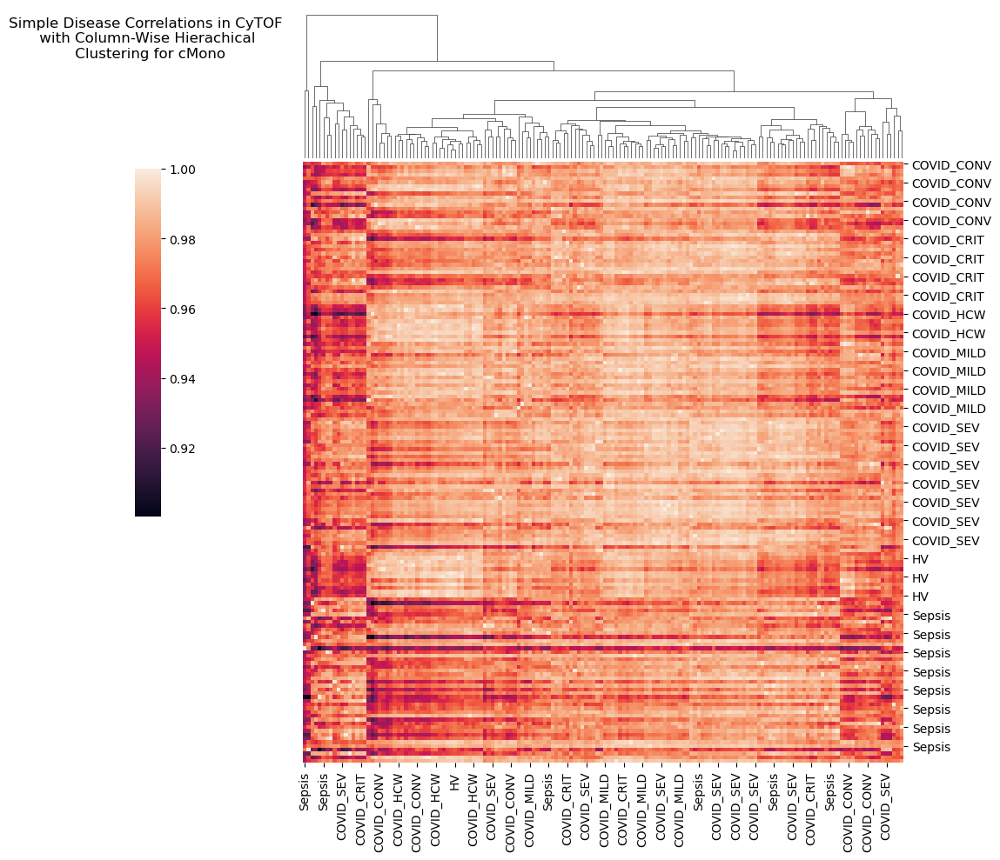

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["cMono"]["all"], cbar_pos=(0, .4, .03, .4), row_cluster=False,)
plt.title("Simple Disease Correlations in CyTOF \n with Column-Wise Hierachical \n Clustering for cMono" , y = 1.3)

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


Text(0.5, 1.3, 'Simple Disease Correlations \n in CyTOF with \n Two-Way Hierachical Clustering for cMono')

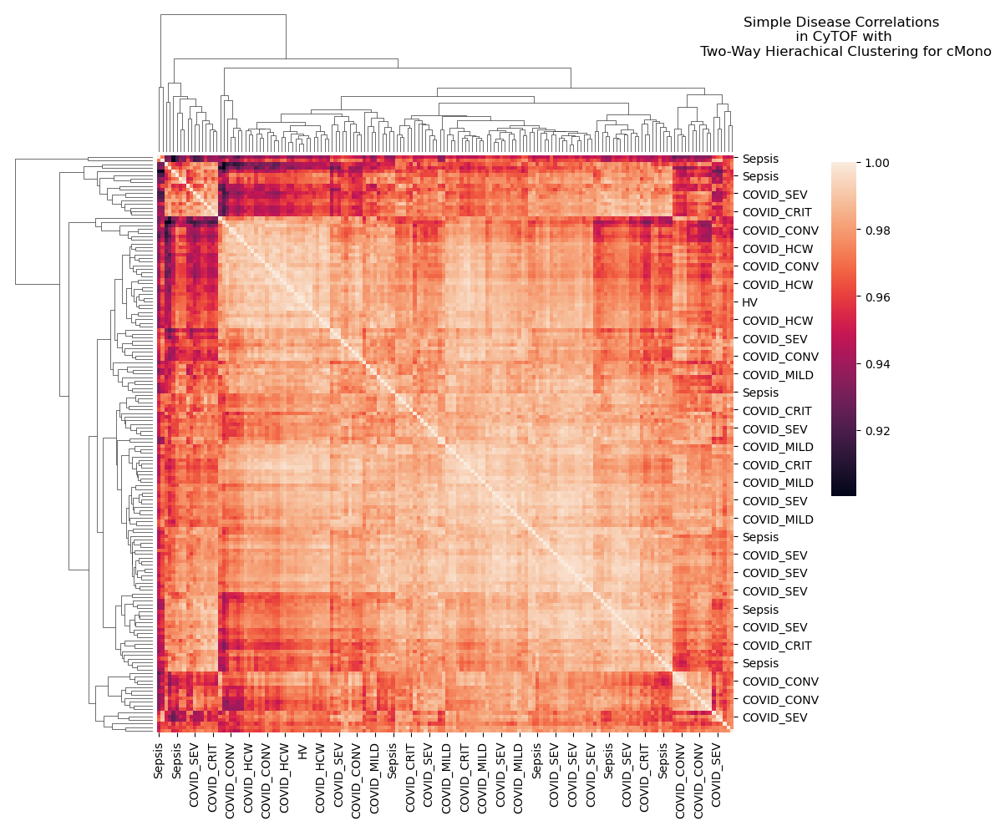

In [ ]:
sb.clustermap(cytof_disease_clusters_corr["cMono"]["all"], cbar_pos=(1, .4, .03, .4))
plt.title("Simple Disease Correlations \n in CyTOF with \n Two-Way Hierachical Clustering for cMono", y = 1.3)

Text(0.5, 25.722222222222214, 'Patients')

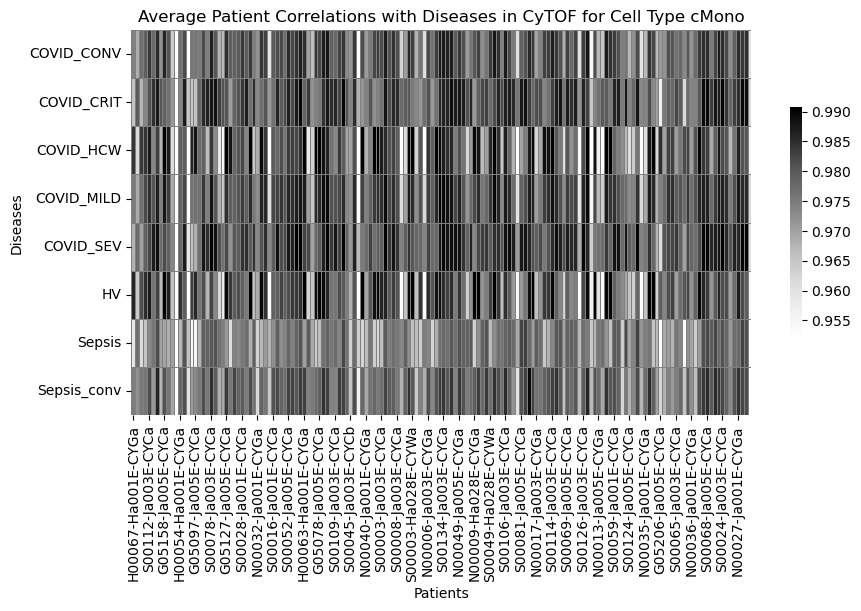

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["cMono"].transpose().groupby(corr_p_d_cytof["cMono"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type cMono")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type cMono Disease Correlations in CyTOF')

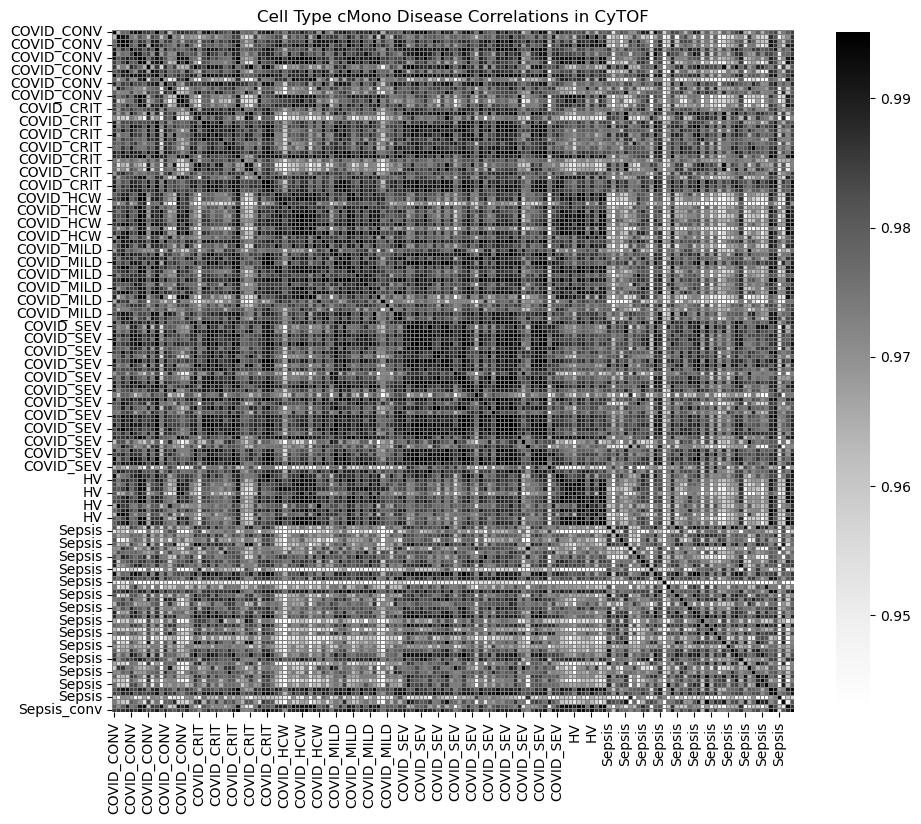

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["cMono"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type cMono Disease Correlations in CyTOF")

##### CD4

Text(0.5, 25.722222222222214, 'Patients')

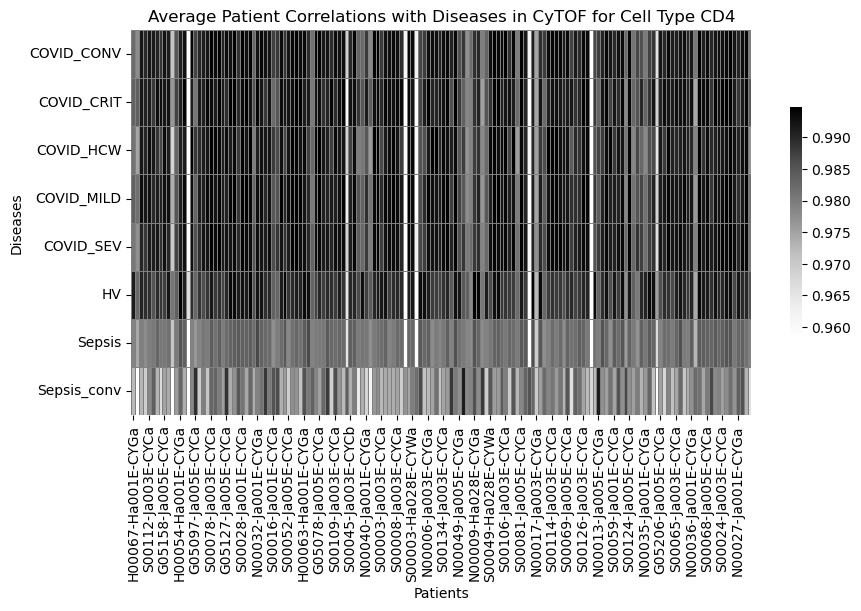

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["CD4"].transpose().groupby(corr_p_d_cytof["CD4"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type CD4")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type CD4 Disease Correlations in CyTOF')

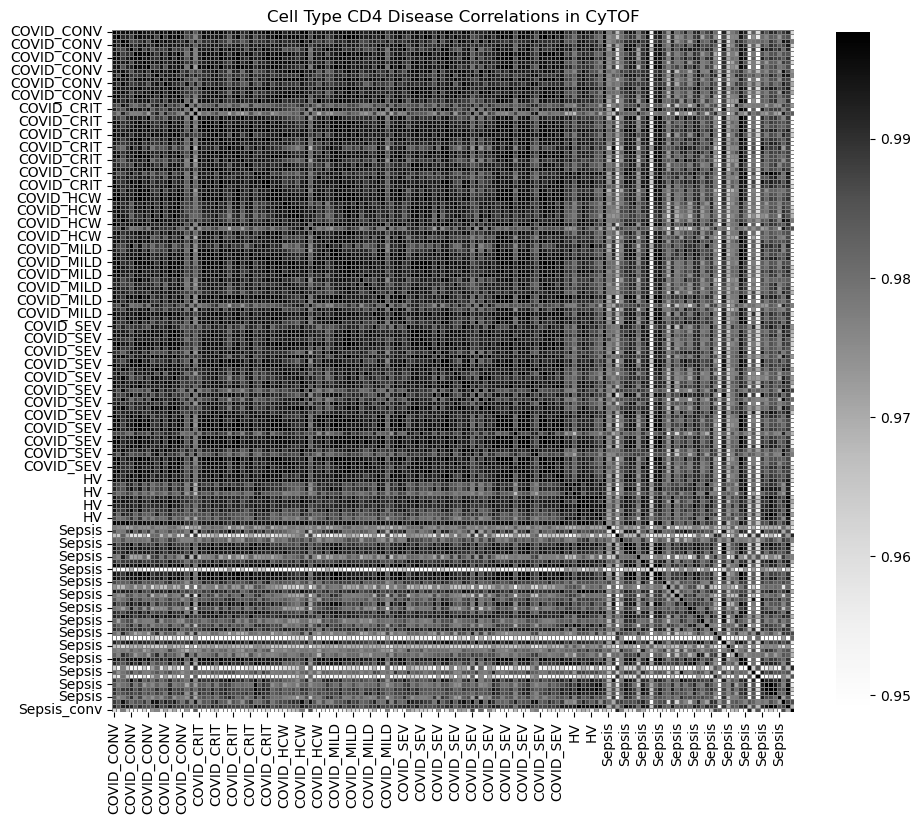

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["CD4"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type CD4 Disease Correlations in CyTOF")

##### GDT

Text(0.5, 25.722222222222214, 'Patients')

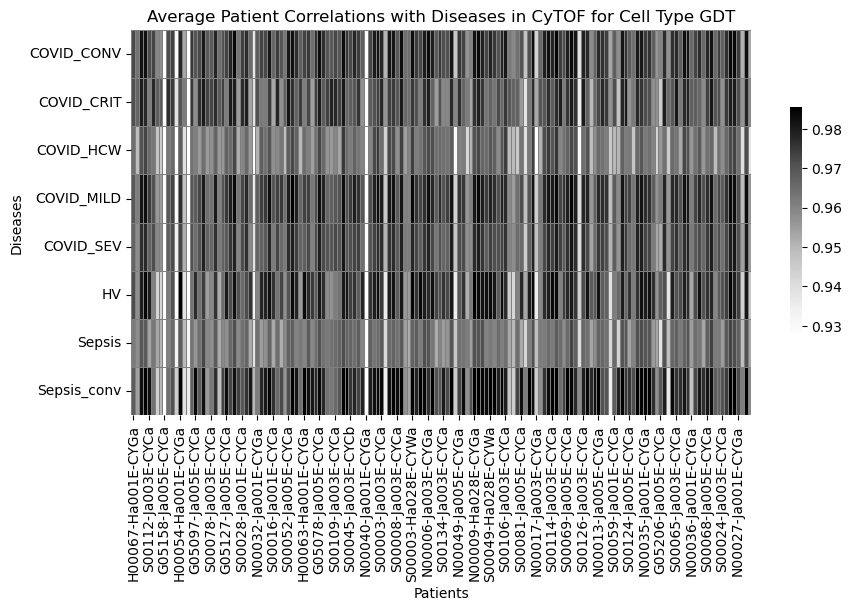

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["GDT"].transpose().groupby(corr_p_d_cytof["GDT"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type GDT")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type GDT Disease Correlations in CyTOF')

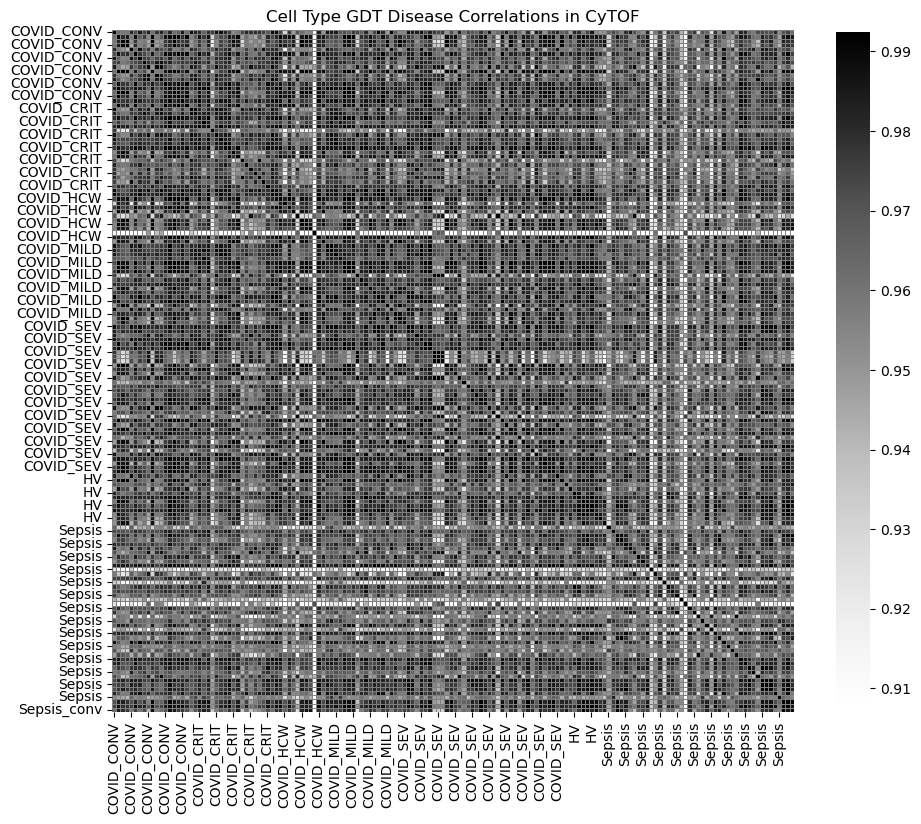

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["GDT"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type GDT Disease Correlations in CyTOF")

##### DC

Text(0.5, 25.722222222222214, 'Patients')

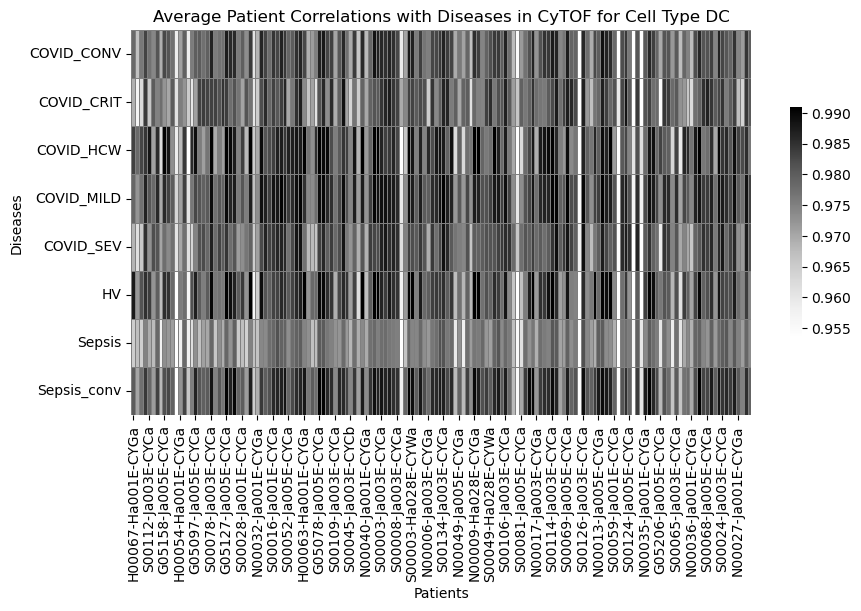

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["DC"].transpose().groupby(corr_p_d_cytof["DC"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type DC")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type DC Disease Correlations in CyTOF')

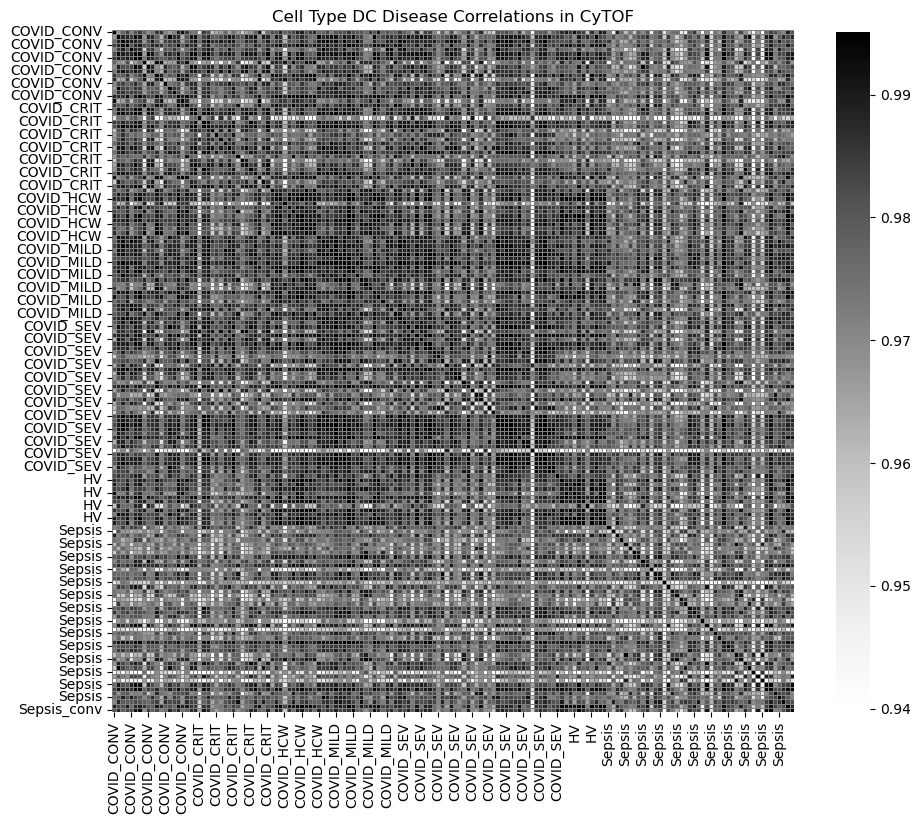

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["DC"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type DC Disease Correlations in CyTOF")

##### Basophil

Text(0.5, 25.722222222222214, 'Patients')

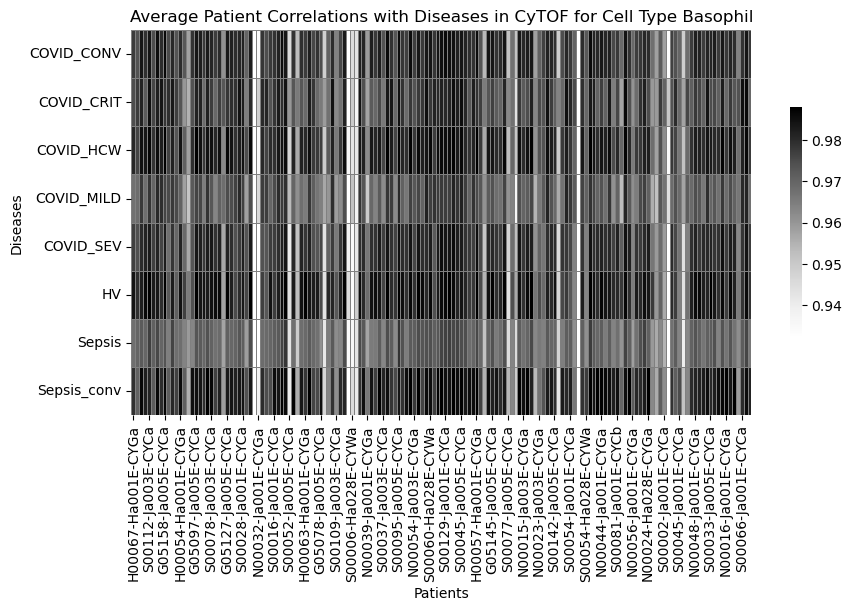

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["Basophil"].transpose().groupby(corr_p_d_cytof["Basophil"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type Basophil")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type Basophil Disease Correlations in CyTOF')

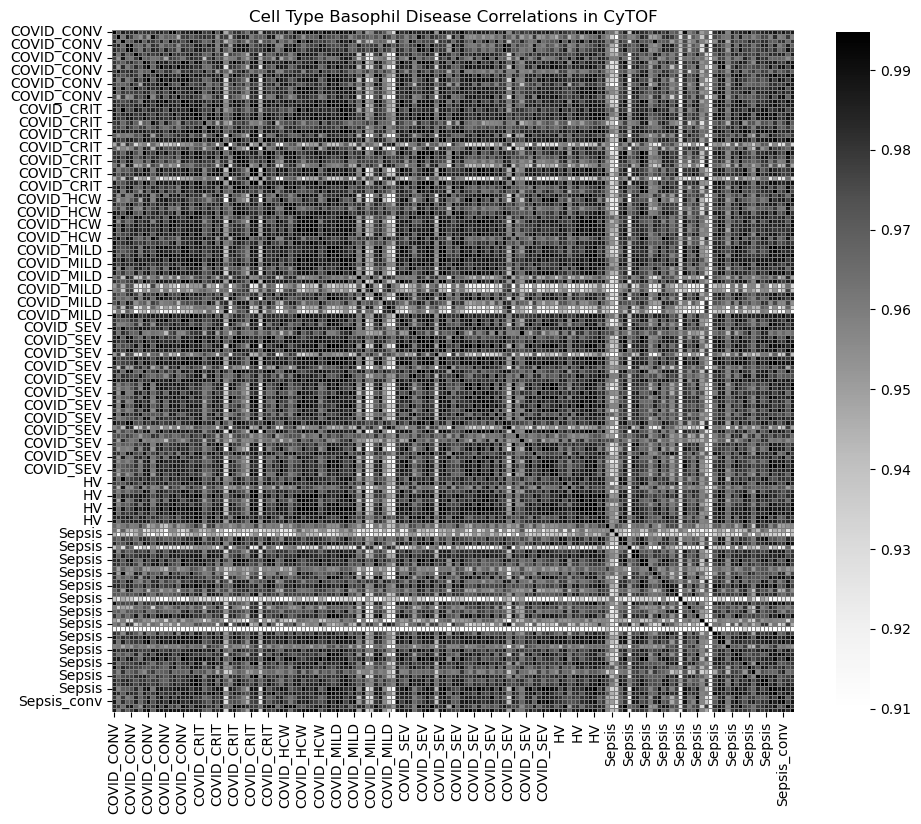

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["Basophil"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type Basophil Disease Correlations in CyTOF")

##### ncMono

Text(0.5, 25.722222222222214, 'Patients')

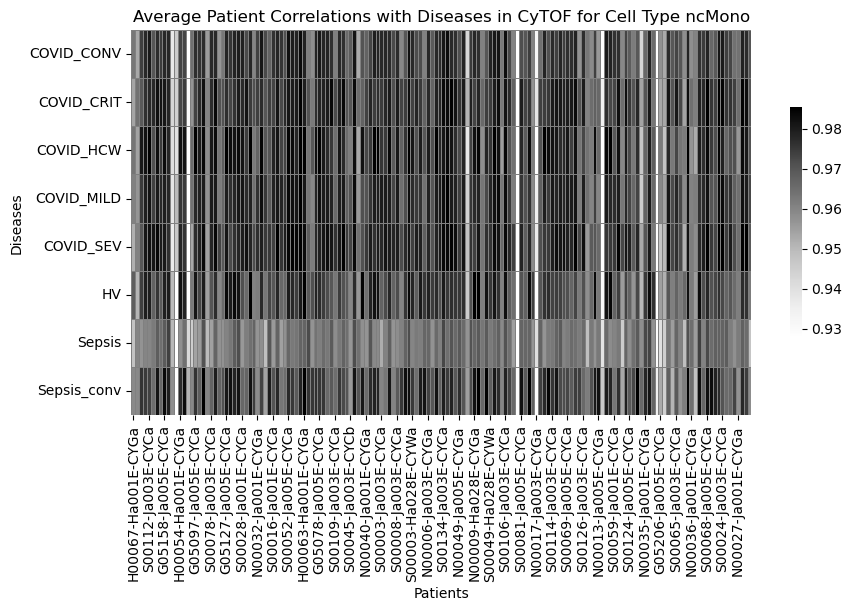

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["ncMono"].transpose().groupby(corr_p_d_cytof["ncMono"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type ncMono")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type ncMono Disease Correlations in CyTOF')

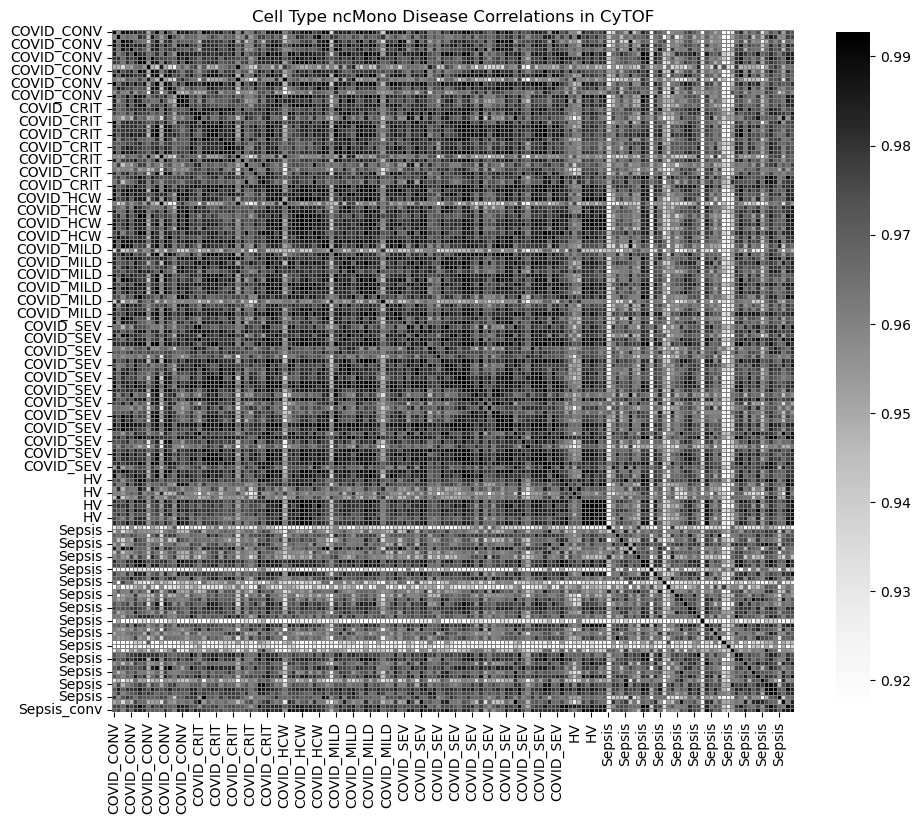

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["ncMono"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type ncMono Disease Correlations in CyTOF")

##### NK

Text(0.5, 25.722222222222214, 'Patients')

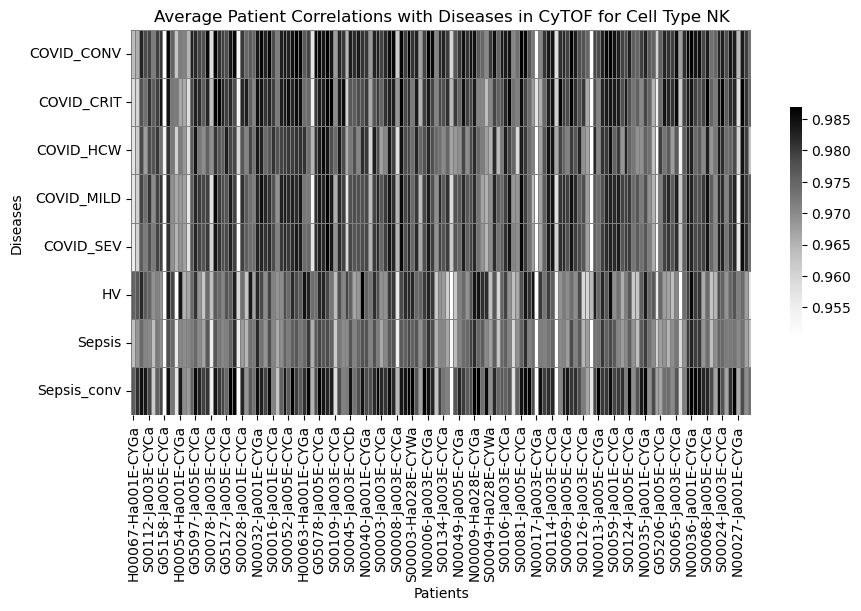

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["NK"].transpose().groupby(corr_p_d_cytof["NK"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type NK")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type NK Disease Correlations in CyTOF')

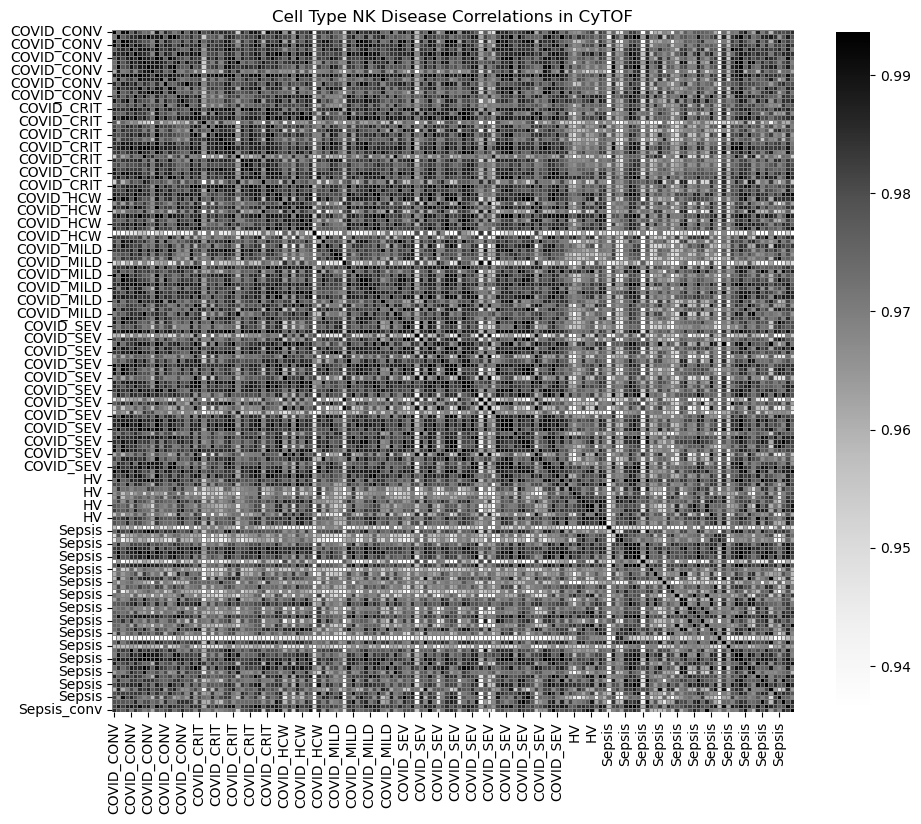

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["NK"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type NK Disease Correlations in CyTOF")

##### MAIT

Text(0.5, 25.722222222222214, 'Patients')

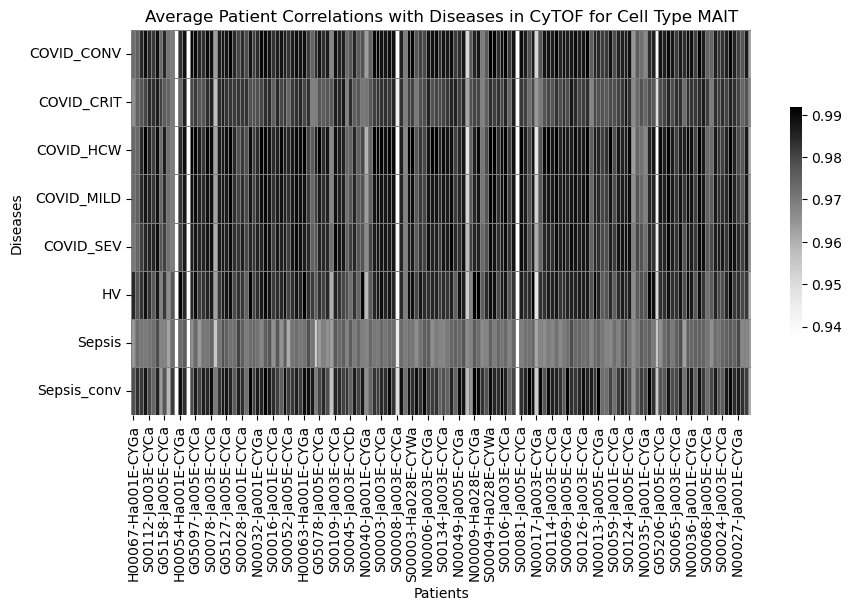

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["MAIT"].transpose().groupby(corr_p_d_cytof["MAIT"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type MAIT")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type MAIT Disease Correlations in CyTOF')

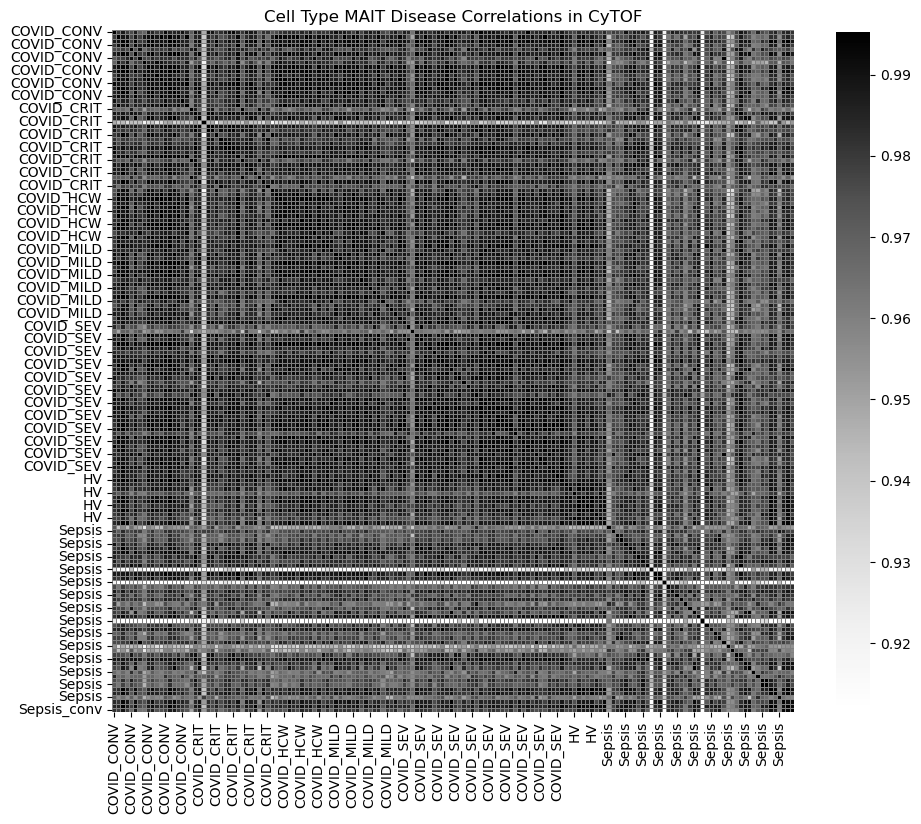

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["MAIT"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type MAIT Disease Correlations in CyTOF")

##### DN

Text(0.5, 25.722222222222214, 'Patients')

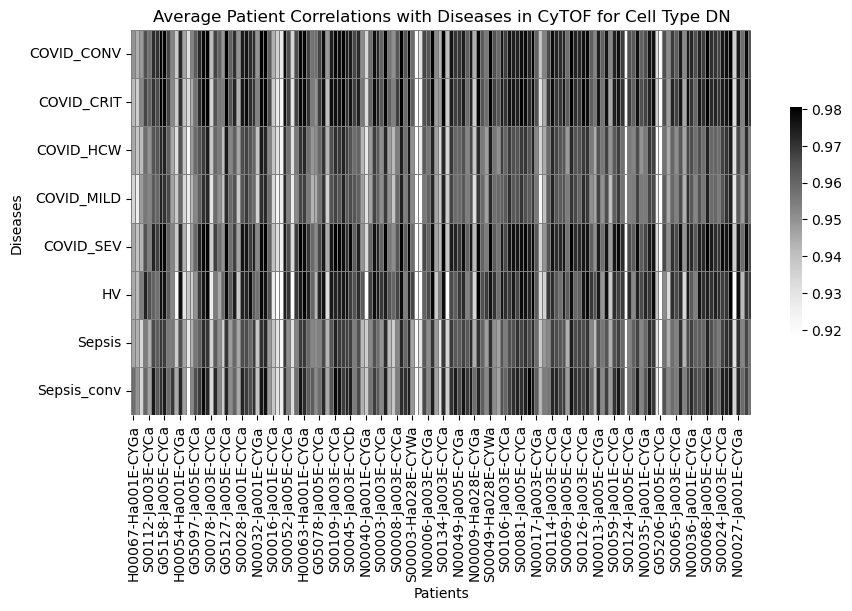

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["DN"].transpose().groupby(corr_p_d_cytof["DN"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type DN")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type DN Disease Correlations in CyTOF')

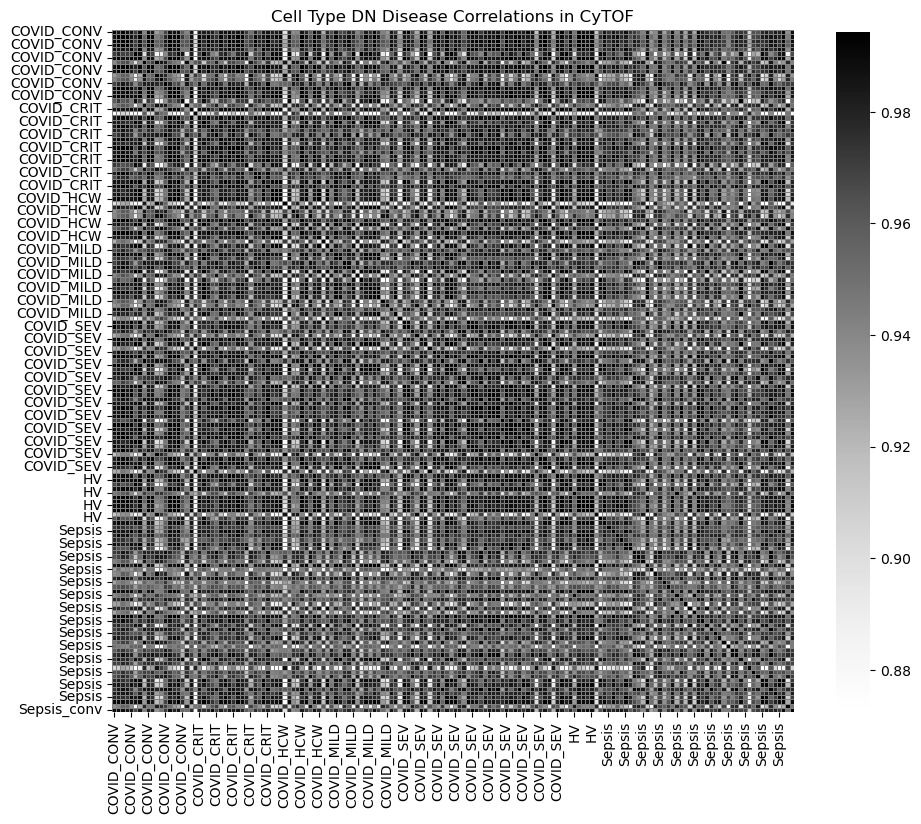

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["DN"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type DN Disease Correlations in CyTOF")

##### PB

Text(0.5, 25.722222222222214, 'Patients')

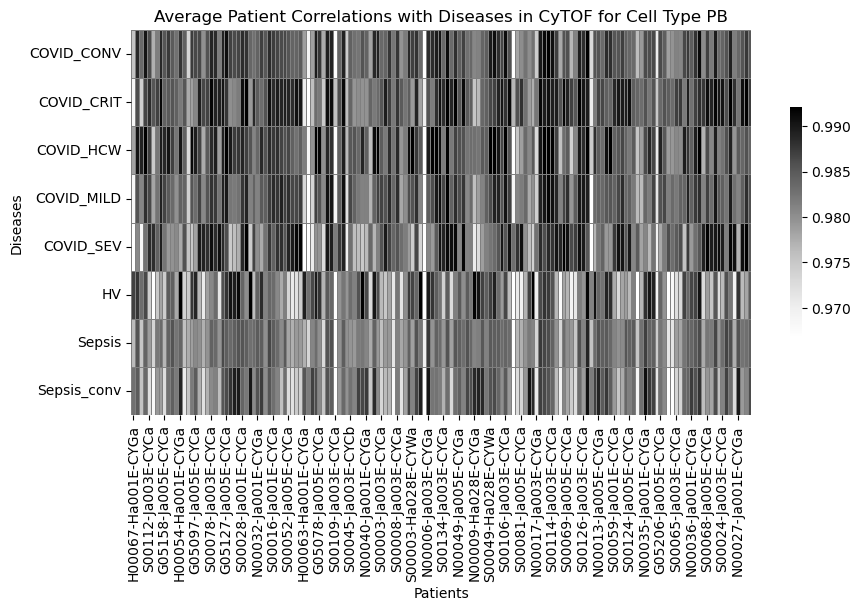

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["PB"].transpose().groupby(corr_p_d_cytof["PB"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type PB")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type PB Disease Correlations in CyTOF')

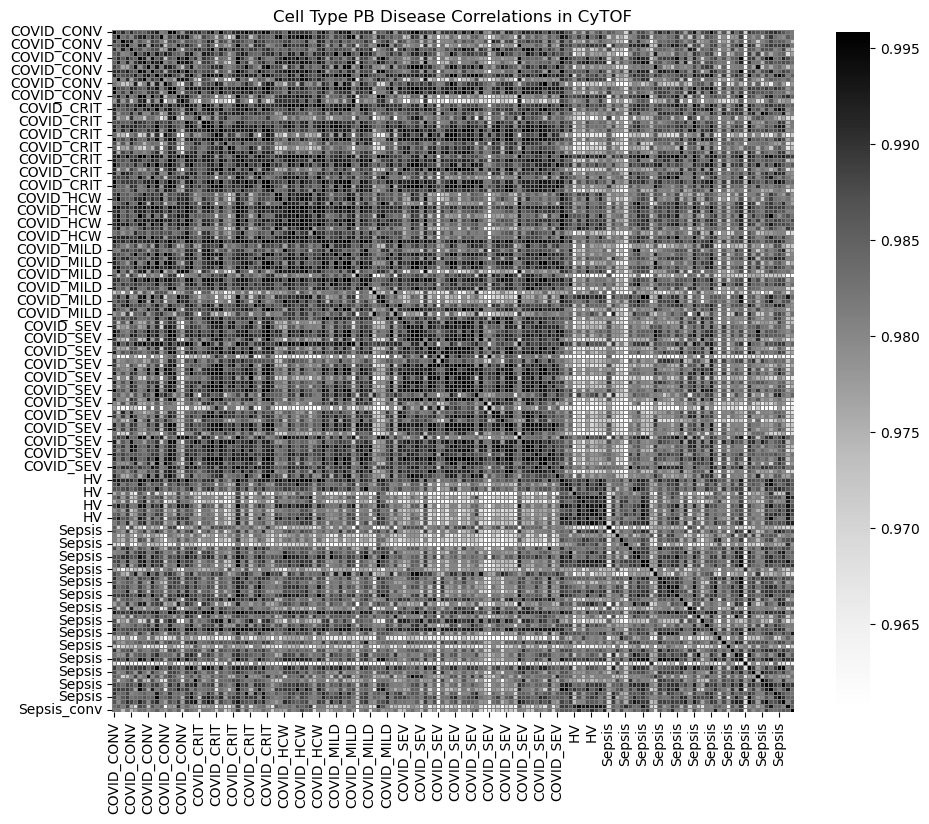

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["PB"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type PB Disease Correlations in CyTOF")

Text(0.5, 1.0, 'Cell Type PB Patient Correlations in CyTOF')

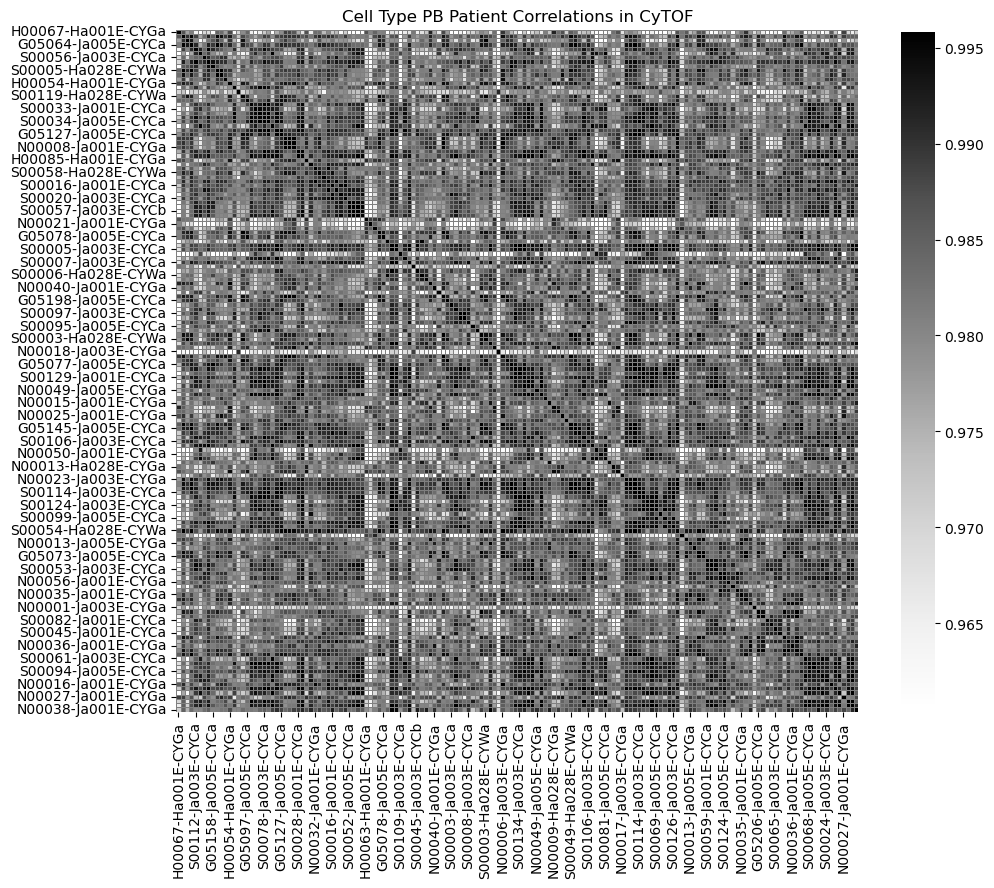

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(corr_p_cytof["PB"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type PB Patient Correlations in CyTOF")

##### nan

Text(0.5, 25.722222222222214, 'Patients')

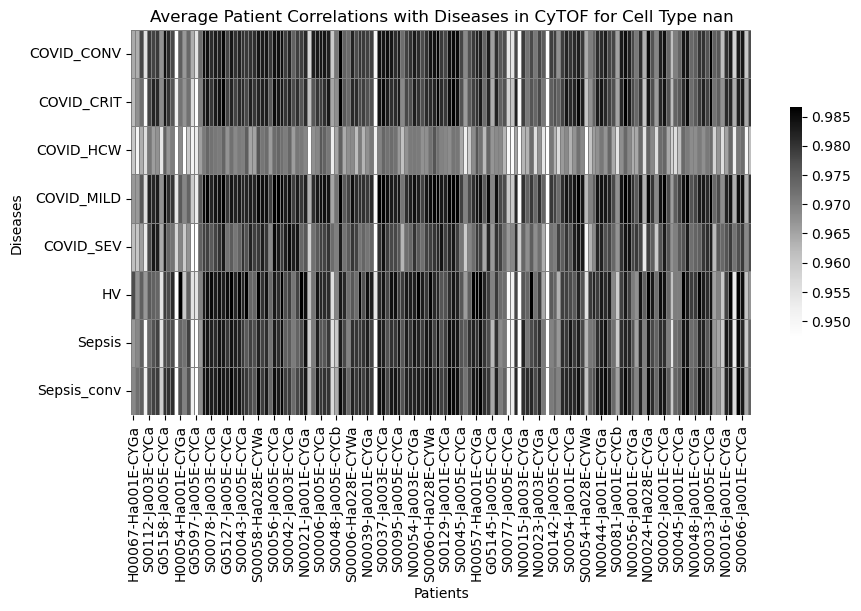

In [ ]:
fig,ax=plt.subplots(figsize=(10,5))
sb.heatmap(corr_p_d_cytof["nan"].transpose().groupby(corr_p_d_cytof["nan"].transpose().index).mean(), cmap ='Greys', robust = True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.6}, )
plt.title("Average Patient Correlations with Diseases in CyTOF for Cell Type nan")
plt.ylabel("Diseases")
plt.xlabel("Patients")

Text(0.5, 1.0, 'Cell Type nan Disease Correlations in CyTOF')

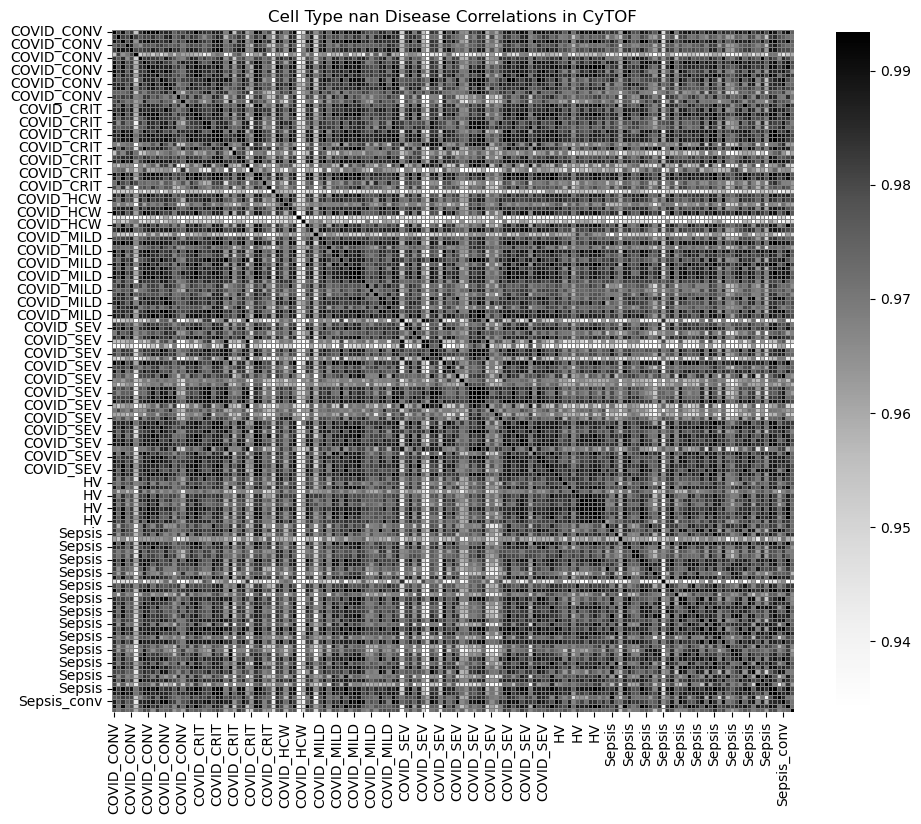

In [ ]:
fig,ax=plt.subplots(figsize=(11,11))
sb.heatmap(cytof_disease_clusters_corr["nan"]["all"], cmap ='Greys',  robust = True, square= True, linewidth=.5, linecolor = "grey" , ax = ax, cbar_kws={"shrink": 0.8})
plt.title("Cell Type nan Disease Correlations in CyTOF")

## Gaussian Kernel

In [ ]:
anndata_obj = ad.read_excel(os.path.join(pseudobulk, "cytof_CD16posCD56dim NK.xlsx"), "Sheet1", dtype=str)
df = anndata_obj.to_df().set_index("patient_id")
ids = [(i,j) for i in range(df.shape[0]) for j in range(i)]

/opt/anaconda3/envs/thesis/lib/python3.10/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [ ]:
import numpy as np
sim_dict = {i:[0] * df.shape[0] for i in df.index}
sigma = 1
for id in ids:
    p1_name = df.index[id[0]]
    p1 =df.iloc[id[0]].to_numpy(dtype=float)
    p1_index = df.index.get_loc(p1_name)

    p2_name = df.index[id[1]]
    p2 = df.iloc[id[1]].to_numpy(dtype=float)
    p2_index = df.index.get_loc(p2_name)

    #d = np.linalg.norm(p1 - p2)
    #var = sigma ** 2
    #sim =  np.exp( - (d ** 2) / (2 * var) )
    sim = sp.spatial.distance.cosine(p1, p2) # Cosine Sim

    sim_dict[p1_name][p2_index] = sim
    sim_dict[p2_name][p1_index] = sim
    
